In [1]:
# Parameters (papermill will overwrite this)
n = 4 # Default to None to detect issues
k= "Dominant" # "Dominant" or "NonDominant"
m= "1kg" #or "0kg" or "1kg" or "0kg"
print(f"Running with n = {n}")
print(f"Running with n = {k}")
print(f"Running with m = {m}")

Running with n = 4
Running with n = Dominant
Running with m = 1kg


In [2]:
!pip install shapely

In [3]:
import json
import numpy as np
import scipy.signal as sig
import matplotlib.pyplot as plt
import matplotlib.backends.backend_pdf
#%matplotlib inline
import os
import glob
from sklearn import preprocessing

import csv
import pandas as pd

import sys
#!{sys.executable} -m pip install pyautogui
#import pyautogui
import math
import statistics as stat

from shapely.geometry import Polygon
from scipy.integrate import quad
from numpy import trapz
import ast
plt.ion()  # Vuelve a activar el modo interactivo


/Users/mariavivasarias/Desktop/TRIALS/4/Dominant/1kg/
Advanced file: /Users/mariavivasarias/Desktop/TRIALS/4/Dominant/1kg/advanced_mdurance-test-345692.csv
Basic file: /Users/mariavivasarias/Desktop/TRIALS/4/Dominant/1kg/rms_dynamic_2025_03_31_17_12_elbow_extension_maria_vivas_arias.csv
[-57.62, -57.57, -56.94, -56.34, -56.01, -55.43, -55.08, -54.95, -55.2, -55.89, -56.78, -57.74, -58.72, -59.33, -59.75, -60.19, -60.45, -60.5, -60.37, -60.27, -60.36, -60.49, -60.61, -60.72, -60.9, -61.23, -61.7, -62.25, -62.78, -63.19, -62.94, -61.17, -56.53, -48.55, -38.05, -25.06, -9.22, 8.34, 25.48, 41.3, 54.77, 64.65, 71.57, 76.06, 78.15, 78.62, 77.61, 75.14, 71.55, 66.65, 59.75, 50.44, 39.26, 27.22, 15.31, 4.21, -5.87, -14.83, -22.66, -29.74, -36.27, -42.27, -47.73, -52.64, -56.91, -60.18, -62.07, -62.55, -61.65, -59.48, -56.49, -53.03, -48.88, -43.37, -36.4, -28.42, -20.15, -11.8, -3.25, 5.04, 13.22, 21.45, 29.03, 35.75, 42.06, 48.25, 54.55, 60.51, 65.43, 69.07, 71.25, 71.5, 69.7, 65.97, 60.03, 5

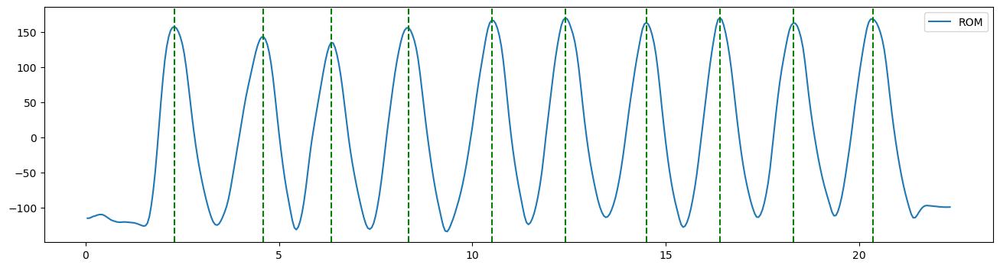

In [4]:
#BEGGINING
rows = []
csvtimes=[]
csvangles=[]
timeStep=0.05
length=0

# Define the structure for the data initially (this is for one row of data)
data_row_finalCSV = {
    'ROM': None,
    'Speed': None,
    'Homogeneity Coefficient': None,
    'Normality Coefficient': None,
    'CCaccFlex': None,
    'CCdeccFlex': None,
    'CCaccExt': None,
    'CCdeccExt': None,
    'SynergyBiceps': None,
    'SynergyTriceps': None,
    'PeaktoSecondaryPeak': None
}
# Define the header for the CSV file
header_finalCSV = [
    'ROM', 'Speed', 'Homogeneity Coefficient', 'Normality Coefficient', 'CCaccFlex', 
    'CCdeccFlex', 'CCaccExt', 'CCdeccExt', 'SynergyBiceps', 'SynergyTriceps', 'PeaktoSecondaryPeak'
]
def get_advanced_and_basic_files(folder_path):
    """Assigns advanced and basic CSV files based on the file name patterns in the folder."""
    # List all files in the provided folder
    files = os.listdir(folder_path)

    # Filter for advanced and basic files
    advanced_file = next((f for f in files if f.startswith('advanced_mdurance') and f.endswith('.csv')), None)
    basic_file = next((f for f in files if f.startswith('rms_dynamic') and f.endswith('.csv')), None)

    if advanced_file and basic_file:
        # Return the full paths of the files
        return os.path.join(folder_path, advanced_file), os.path.join(folder_path, basic_file)
    else:
        print("Advanced or basic CSV file not found in the folder.")
        return None, None

# User provides the subject folder path

#folder_path = f"C:/Users/carlo/OneDrive/Documentos/Carlota/CEU/TFG/Señales/pruebas/{n}/{k} exo/{m}/"
folder_path= f"/Users/mariavivasarias/Desktop/TRIALS/{n}/{k}/{m}/"

print(folder_path)

# Extract the base directory of the BPM folder
base_folder = os.path.dirname(os.path.dirname(folder_path))  # Removes the subject number (e.g., "20")

# Extract the BPM value
bpm_value = None
for bpm in ["78", "60", "42"]:
    if f"{bpm}BPM" in base_folder:
        bpm_value = bpm
        break
        
# Get the advanced and basic CSV files from the folder
advanced, basic = get_advanced_and_basic_files(folder_path)

if advanced and basic:
    print(f"Advanced file: {advanced}")
    print(f"Basic file: {basic}")
    # Initialize list for the second column (as per your initial code)
    second_column = []
else:
    print("Error: Files not found.")
    
# Open and read the CSV file
#with open(advanced, newline='') as csvfile:
    #csvreader = csv.reader(csvfile, delimiter=';', quotechar='|')
    #next(csvreader)  # Skip the header row
    #for row in csvreader:
        #try:
            # Check if the second column is not empty
            #if len(row) > 1 and row[1]:
                # Convert and append the value from the second column
                #value = float(row[1].replace(",", "."))
                #second_column.append(value)
        #except (ValueError, IndexError):
            # Handle the case where conversion fails or the row is malformed
            #print(f"Skipping invalid row: {row}")
#start
error_count = 0
second_column = []
try:
    with open(advanced, newline='') as csvfile:
        csvreader = csv.reader(csvfile, delimiter=';', quotechar='|')
        next(csvreader)  # skip header
        for row in csvreader:
            try:
                if len(row) > 1 and row[1]:
                    value = float(row[1].replace(",", "."))
                    second_column.append(value)
            except (ValueError, IndexError):
                if error_count < 5:
                    print(f"Skipping invalid row: {row}")
                error_count += 1
except Exception as e:
    print(f"Error reading file: {e}")

if error_count > 0:
    print(f"Total invalid rows skipped: {error_count}")
# --- END OF REPLACEMENT ---

# Print or use the second_column list as needed
print(second_column)
csvtimes=[]
csvangles = second_column[0:-1] 
csvangles = [x * 2 for x in csvangles]
for j in range (1, len(csvangles)+1,1):
    
    csvtimes.append(round(timeStep*j,3))
  
peaks, properties = sig.find_peaks(x = csvangles, height = 45, distance= 20)

plt.figure(figsize=[16,4])
plt.plot(csvtimes,csvangles,label= 'ROM')
plt.legend()
length=len(csvangles)
#print(length)
                                   
for peak in peaks:
    plt.axvline(csvtimes[peak], linestyle = '--', color = "g")                 
#plt.plot(csvtimes,csvangles,label= 'Werium')

447
Index
[ 45  91 126 166 209 247 289 327 365 406]
45


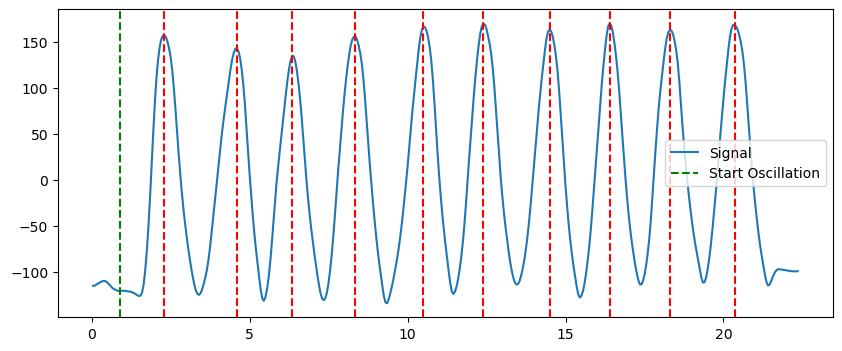

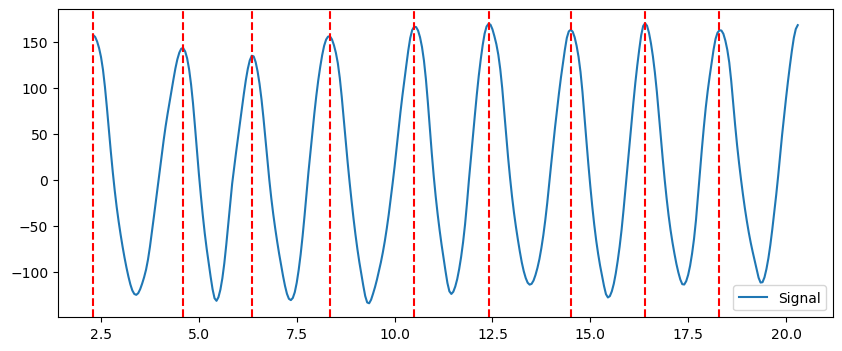

45


In [5]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal as sig

indexBaseLine=0

def separacionPruebas(csvangles, csvtimes):
    identificador = 0
    newAngles = []
    newTimes = []

    if identificador == 0:
        time = csvtimes
        signal = csvangles

        # Detect start of oscillations
        window_size = 20
        std_dev = np.array([np.std(signal[i:i + window_size]) for i in range(len(signal) - window_size)])
        start_index = np.argmax(std_dev > 20)

        # Detect peaks
        peaks, _ = sig.find_peaks(signal[start_index:], height=45, distance=25)
        peaks += start_index  # Adjust indices

        if len(peaks) < 9:
            print("Not enough peaks detected!")
            return [], [], None, None, None, None

        # Plot full signal
        plt.figure(figsize=(10, 4))
        plt.plot(time, signal, label='Signal')
        indexBaseLine = peaks[0]
        print("Index")
        print(peaks)  #indices de los picos detectados en la señal csvangles [incio del ciclo 1.....fin del ciclo 9]
        print(indexBaseLine) #Es el índice del primer pico detectado. Se usa como punto de referencia para segmentar la señal desde un punto estable (inicio del movimiento periódico).
        for peak in peaks:
            plt.axvline(csvtimes[peak], linestyle='--', color="r") 
        plt.axvline(time[start_index], color='green', linestyle='--', label='Start Oscillation')
        plt.legend()
        plt.show()

        # Extract a segment between two peaks
        i = 0
        index1 = peaks[i]
        index2 = peaks[i + 9 ]

        newAngles = csvangles[index1:index2]
        newTimes = csvtimes[index1:index2]

        # Find peaks in the new segment
        new_peaks, _ = sig.find_peaks(newAngles, height=45, distance=25)

        if len(new_peaks) > 1:
            # Compute the average distance between peaks (excluding first)
            avg_distance = np.mean(np.diff(new_peaks[1:]))

            # Check if the first peak is too close to index 0
            if new_peaks[0] < avg_distance * 0.5:
                new_peaks = new_peaks[1:]  # Remove the first peak

        # Ensure the first peak is at index 0
        if 0 not in new_peaks:
            new_peaks = np.insert(new_peaks, 0, 0)

        # Plot new segment
        plt.figure(figsize=(10, 4))
        plt.plot(newTimes, newAngles, label='Signal')
        for peak in new_peaks:
            plt.axvline(newTimes[peak], linestyle='--', color="r") 
        plt.legend()
        plt.show()

    return newAngles, newTimes, index1, index2, 0, 2, indexBaseLine
    
length=len(csvangles)
print(length) #numero total de puntos (muestras) en señal original
csvangles, csvtimes, index1, index2, minLength1, minLength2, indexBaseLine = separacionPruebas(csvangles, csvtimes)

print(index1)
#length=len(csvangles)

In [6]:
def deltaAngle (angles): #Devuelve una lista con las diferencias de angulo entre cada muestra consecutiva
    deltaAngles=[]
    delta=0
    for i in range (0, len(angles)-1,1):
        delta = angles[i+1]-angles[i]
        deltaAngles.append(delta)
        
    return deltaAngles

In [7]:
def deltaTime (times): #Devuelve una lista con las diferencias de tiempo entre cada muestra consecutiva
    deltaTimes=[]
    delta=0
    for i in range (0, len(times)-1, 1):
        delta = times[i+1]-times[i]
        deltaTimes.append(delta)
        
    return deltaTimes

In [8]:
diffAngles = deltaAngle(csvangles)
diffTimes = deltaTime(csvtimes)
#print(diffAngles)
#print(diffTimes)


In [9]:
def angSpd (diffT, diffA):
    angularSpd = []
    ang=0

    for i in range (0, len(diffT), 1):
        if diffT[i] != 0:  # Avoid division by zero
            ang = diffA[i] / diffT[i]  # Compute angular speed (change in angle / change in time)
            angularSpd.append(ang)
        else:
            angularSpd.append(0)  # Handle case where time difference is zero (could happen if time intervals are zero)
    angularSpd.append(0) 
    return angularSpd


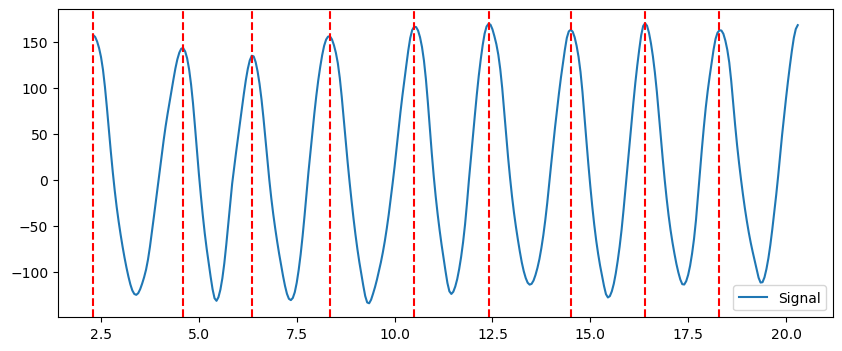

In [10]:
# Find peaks in the new segment TO VERIFY IF SIGNAL IS WELL SEGMENTED

new_peaks, _ = sig.find_peaks(csvangles, height=45, distance=25)

if len(new_peaks) > 1:
    # Compute the average distance between peaks (excluding first)
    avg_distance = np.mean(np.diff(new_peaks[1:]))

    # Check if the first peak is too close to index 0
    if new_peaks[0] < avg_distance * 0.5:
        new_peaks = new_peaks[1:]  # Remove the first peak

# Ensure the first peak is at index 0
if 0 not in new_peaks:
    new_peaks = np.insert(new_peaks, 0, 0)
    
# last_index = len(csvangles) - 1
# if last_index not in new_peaks:
#     new_peaks = np.append(new_peaks, last_index)

# Plot new segment
plt.figure(figsize=(10, 4))
plt.plot(csvtimes, csvangles, label='Signal')
for peak in new_peaks:
    plt.axvline(csvtimes[peak], linestyle='--', color="r") 
plt.legend()
plt.show()



[157.24, 155.22, 150.28, 143.1, 133.3, 119.5, 100.88, 78.52, 54.44, 30.62, 8.42, -11.74, -29.66, -45.32, -59.48, -72.54, -84.54, -95.46, -105.28, -113.82, -120.36, -124.14, -125.1, -123.3, -118.96, -112.98, -106.06, -97.76, -86.74, -72.8, -56.84, -40.3, -23.6, -6.5, 10.08, 26.44, 42.9, 58.06, 71.5, 84.12, 96.5, 109.1, 121.02, 130.86, 138.14, 142.5, 143.0, 139.4, 131.94, 120.06, 103.76, 83.0, 58.14, 31.68, 6.38, -16.96, -38.66, -58.22, -75.22, -90.58, -105.34, -119.02, -128.78, -131.58, -127.68, -119.38, -107.04, -90.68, -70.58, -48.1, -25.02, -4.32, 13.04, 29.72, 46.02, 61.84, 77.84, 93.7, 108.38, 120.58, 129.72, 134.8, 134.1, 127.94, 117.72, 104.16, 87.34, 67.08, 44.38, 21.4, -0.38, -20.1, -37.4, -52.82, -67.1, -80.4, -92.8, -104.54, -115.26, -123.96, -129.4, -130.82, -128.46, -122.26, -111.88, -97.98, -81.14, -61.24, -38.94, -14.82, 8.54, 30.08, 51.46, 72.04, 91.18, 108.12, 122.68, 135.38, 145.64, 152.3, 155.58, 155.8, 152.54, 146.32, 137.96, 126.62, 110.64, 90.02, 66.42, 42.28, 19.3

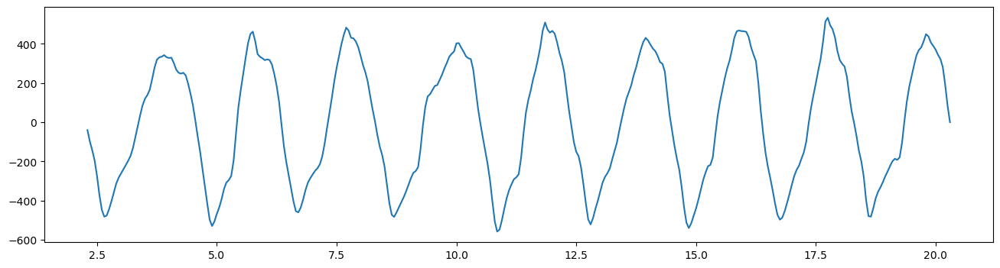

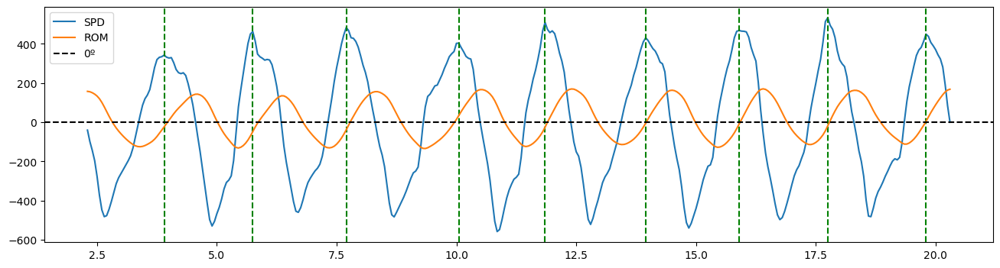

In [11]:
angularSpd = angSpd (diffTimes, diffAngles) #angular velocity


#print(len(csvangles)) #===
#print(len(csvtimes)) #===
#print(len(angularSpd)) #===
#print(angularSpd)
print(csvangles)

plt.figure(figsize=[16,4])
plt.plot(csvtimes, angularSpd, label= 'SPD') #VELOCIDAD ANGULAR EN EL TIEMPO

plt.figure(figsize=[16,4])
plt.plot(csvtimes[0:500], angularSpd[0:500], label= 'SPD') # solo las primeras 500 muestras de la señal de velocidad angular
peaks, properties = sig.find_peaks(x = angularSpd, height = 40, distance= 25)  # momentos donde el brazo acelera más rápido (puntos de máxima velocidad angular).

#print("Peaks found:",peaks)
smolpeaks = peaks[0:11] #only 11 first peaks

for peak in smolpeaks:
    plt.axvline(csvtimes[peak], linestyle = '--', color = "g") #líneas verdes marcan los picos de velocidad angular
    
 

#Sobre la misma gráfica: añades la señal angular (ROM) y una línea a 0°
plt.plot(csvtimes,csvangles,label= 'ROM')
plt.axhline(y = 0, color = 'Black', linestyle = '--', label = '0º')
plt.legend()



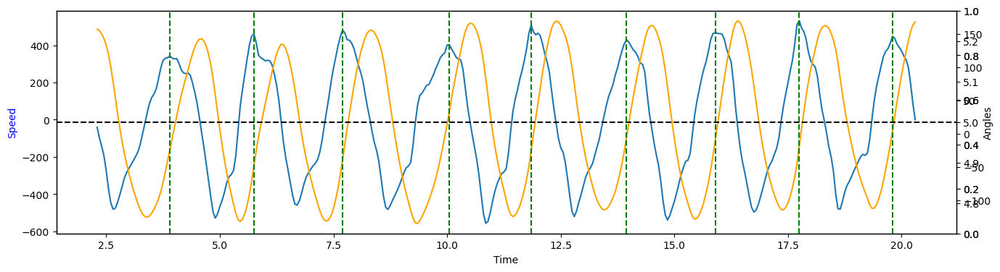

[-23.6, -48.1, -38.94, 34.32, -25.4, -4.78, -9.4, -18.18, 4.24]


In [12]:
#dos señales sincronizadas (velocidad y ángulo) sobre el mismo eje X (tiempo)
fig, ax = plt.subplots(figsize = [16,4])
axes = [ax, ax.twinx()]


ax.plot(csvtimes[0:500], angularSpd[0:500])
ax.set_ylabel('Speed', color = 'Blue')
ax.tick_params(axis='y')
ax.twinx().plot(csvtimes[0:500], csvangles[0:500], color = 'Orange')
ax.twinx().set_ylabel('Angles')
ax.twinx().tick_params(axis='y')

axes[0].set_xlabel('Time')
cortes =[]
for peak in peaks:
    plt.axvline(csvtimes[peak], linestyle = '--', color = "g")
    index=csvtimes.index(csvtimes[peak])
    cortes.append(csvangles[index])
plt.axhline(y = 5, color = 'Black', linestyle = '--', label = '5º')    
plt.show()
print(cortes)

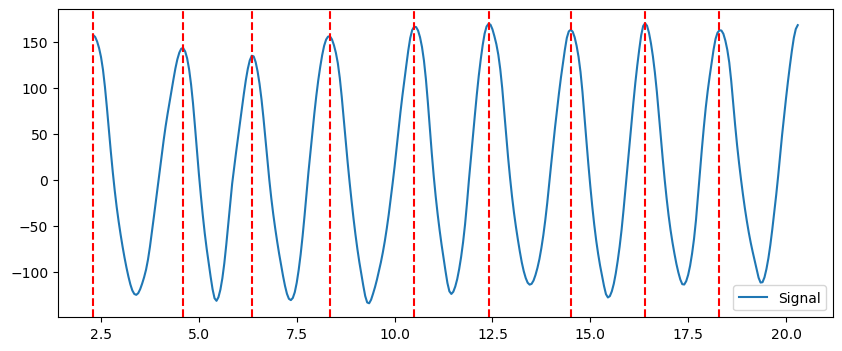

361


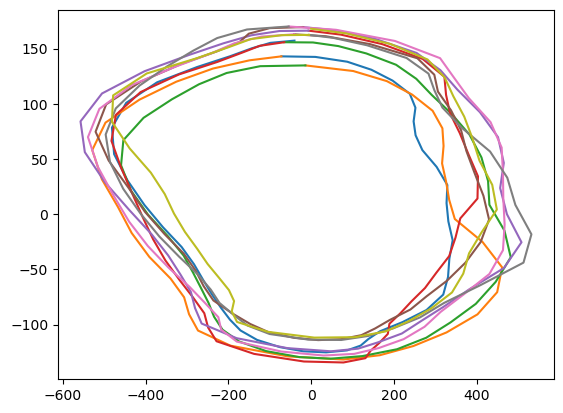

In [13]:

# Filter out closely spaced peaks
peaks, _ = sig.find_peaks(csvangles, height=45, distance=25)

if len(peaks) > 1:
    # Compute the average distance between peaks (excluding first)
    avg_distance = np.mean(np.diff(peaks[1:]))

    # Check if the first peak is too close to index 0
    if peaks[0] < avg_distance * 0.5:
        peaks = peaks[1:]  # Remove the first peak

# Ensure the first peak is at index 0
if 0 not in peaks:
    peaks = np.insert(peaks, 0, 0)
    
# last_index = len(csvangles) - 1
# if last_index not in peaks:
#     peaks = np.append(peaks, last_index)

# Plot new segment
plt.figure(figsize=(10, 4))
plt.plot(csvtimes, csvangles, label='Signal')
for peak in new_peaks:
    plt.axvline(csvtimes[peak], linestyle='--', color="r") 
plt.legend()
plt.show()

filtered_peaks = []
min_spacing = 20  # Adjust as needed

for i in range(len(peaks)):
    if i == 0 or (peaks[i] - filtered_peaks[-1]) > min_spacing:
        filtered_peaks.append(peaks[i])

filtered_peaks = np.array(filtered_peaks)
peaks=filtered_peaks
#peaks = np.delete(peaks, 0)
csvangles2=csvangles
angularSpd2=angularSpd

rom = []
spd = []
if(peaks[0]!=0):
    angspd = angularSpd2[0:peaks[0]]
    angs = csvangles2[0:peaks[0]]
    angspd.append(angularSpd2[peaks[0]])
    angs.append(csvangles2[peaks[0]])

    rom.append(angspd)
    spd.append(angs)
for i in range(0,len(peaks)-1,1):
    angspd = angularSpd2[peaks[i]:peaks[i+1]]
    angspd.append(angularSpd2[peaks[i+1]])
    angs = csvangles2[peaks[i]:peaks[i+1]]
    angs.append(csvangles2[peaks[i+1]])
    rom.append(angspd)
    spd.append(angs)
angspd = angularSpd2[peaks[-1]:-1]
angs = csvangles2[peaks[-1]:-1]
angspd.append(angularSpd2[-1])
angs.append(csvangles2[-1])

rom.append(angspd)
spd.append(angs)

print(len(csvangles2))
for i in range (0, len(rom),1):
    plt.plot(rom[i], spd[i])

#print(csvangles2)

In [14]:
def save_lists_of_lists_to_csv(filename, *lists_of_lists): #Recibe un nombre de archivo y varias listas (listas de listas): cada una representa una columna.
    try:
        # Read existing CSV file
        with open(filename, 'r', newline='') as csvfile:
            csv_reader = csv.reader(csvfile)
            existing_data = list(csv_reader)
    except FileNotFoundError:
        existing_data = []

    # Find the next available row index
    next_row_index = len(existing_data)

    # Iterate through the rows (assuming the first list determines the number of columns)
    for i in range(len(lists_of_lists[0])):
        # Create a new row by taking the i-th element from each list, or an empty list if not available
        new_row = [lst[i] if len(lst) > i else [] for lst in lists_of_lists]

        # Append the new row at the next available index
        if next_row_index < len(existing_data):
            existing_data[next_row_index] = new_row
        else:
            existing_data.append(new_row)
        
        next_row_index += 1

    # Write the updated data to the CSV file
    with open(filename, 'w', newline='') as csvfile:
        csv_writer = csv.writer(csvfile)
        csv_writer.writerows(existing_data)
        
angles = spd
speeds = rom

# Example usage:
file1_lists = [[1, 2, 3], ['a', 'b', 'c'], [True, False, True]]
file2_lists = [[4, 5, 6], ['x', 'y', 'z'], [False, True, False]]

save_lists_of_lists_to_csv('DatosPrueba1Dominant0kg.csv', angles, speeds)

            
   

In [15]:

def compute_ROM(angles):

    result = []
    for angle in angles:
        
        # Exclude the last value
        sublist_to_consider = angle[:-1]
        
        # Find the min and max of the remaining values
        if sublist_to_consider:  # Ensure sublist isn't empty
            min_value = min(sublist_to_consider)
            max_value = max(sublist_to_consider)
            result.append((min_value, max_value))
            
    # Extract min and max values into separate lists
    min_values = [x[0] for x in result]
    max_values = [x[1] for x in result]
    
    # Compute averages
    avg_min = sum(min_values) / len(min_values) if min_values else 0
    avg_max = sum(max_values) / len(max_values) if max_values else 0
    
    
    return avg_max,avg_min

def compute_Speed(speeds):
    result = []
    
    # Iterate over each sublist of speeds
    for speed_list in speeds:
        # Exclude the last value from the current sublist
        sublist_to_consider = speed_list[:-1]
        
        if sublist_to_consider:  # Ensure sublist isn't empty
            min_value = min(sublist_to_consider)
            max_value = max(sublist_to_consider)
            result.append((min_value, max_value))
    
    # Extract min and max values into separate lists
    min_values = [x[0] for x in result]
    max_values = [x[1] for x in result]
    
    # Compute averages of min and max values
    avg_min = sum(min_values) / len(min_values) if min_values else 0
    avg_max = sum(max_values) / len(max_values) if max_values else 0
    
    return avg_max, avg_min
    
data_row_finalCSV['ROM'] = compute_ROM(angles)
data_row_finalCSV['Speed'] = compute_Speed(speeds)

In [16]:
from sklearn.preprocessing import StandardScaler

#Medir qué tan similares (correlacionados) son los ciclos entre sí, considerando ángulo + velocidad como variables combinadas.

# Assign to new variable names
allAngles2 = angles
allSpds2 = speeds

# Normalize angles and speeds separately
scaler_angles = StandardScaler()
scaler_speeds = StandardScaler()

# Fit and transform angles
normalized_angles = [scaler_angles.fit_transform(np.array(row).reshape(-1, 1)).flatten() for row in allAngles2] # Normalizar los valores (z-score), Esto convierte cada ciclo (lista de ángulos o velocidades) a una distribución con: media=0 and sd =1

# Fit and transform speeds
normalized_speeds = [scaler_speeds.fit_transform(np.array(row).reshape(-1, 1)).flatten() for row in allSpds2]

# Combine normalized angles and speeds into list of lists of tuples, ex [(0.1, -0.2), (0.3, -0.1), (1.2, 0.5)]
normalized_data = [[(angle, speed) for angle, speed in zip(angle_row, speed_row)]
                   for angle_row, speed_row in zip(normalized_angles, normalized_speeds)]

# Flatten each iteration
flattened_data = [np.ravel(iteration) for iteration in normalized_data]

# Convert to DataFrame for easier manipulation, cada fila representa un ciclo y cada columna un valor angular o de velocidad
df = pd.DataFrame(flattened_data)

# Calculate the correlation matrix--> matriz de correlación entre ciclos (no entre variables)
correlation_matrix = df.T.corr() #Se transpone df.T para que cada columna sea un ciclo (como espera corr()

# Extract the upper triangle of the correlation matrix, excluding the diagonal
upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))

# Calculate the mean of the off-diagonal elements
mean_correlation = upper_triangle.stack().mean() #coge todos los valores off-diagonal (comparaciones entre ciclos distintos) y calcula su media.

print("Overall mean correlation between iterations:", mean_correlation)
print("Overall mean correlation between iterations:", mean_correlation) #Qué tan similares son entre sí todos los ciclos en términos de forma y comportamiento combinado de ángulo + velocidad.

Overall mean correlation between iterations: 0.9319357987041167
Overall mean correlation between iterations: 0.9319357987041167


In [17]:
def read_csv(file_path): #leer un archivo CSV que contiene datos guardados como listas de listas
    data_list = []

    with open(file_path, 'r') as csvfile:
        csvreader = csv.reader(csvfile)
        for row in csvreader:
            if len(row) >= 1:  # Ensure there is at least 1 element in the row
                try:
                    # Use ast.literal_eval to safely convert the string into a list
                    values = [ast.literal_eval(val) for val in row]

                    # Ensure values is a list containing two sublists
                    if isinstance(values, list) and len(values) == 2:
                        data_list.append(values)
                    else:
                        print(f"Skipping row with unexpected format: {row}")
                except Exception as e:
                    print(f"Error processing row: {row}. {e}")
            else:
                print(f"Skipping empty row")

    return data_list


# Example usage
csv_file_path = 'DatosPrueba1Dominant0kg.csv'  # Replace with the path to your CSV file
result = read_csv(csv_file_path)
#print(result)

In [18]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d

def plot_average_curve_with_std(data, data_type):
    # Find the minimum size among the lists
    min_size = min(len(values) for values in data)

    # Normalize the x-axis by rescaling all segments to the same length
    normalized_data = []
    for values in data:
        # Create a time vector based on the number of points in the segment
        original_x = np.linspace(0, 1, len(values))  # Normalize time to [0, 1]
        
        # Create a new x vector to match the minimum size
        new_x = np.linspace(0, 1, min_size)
        
        # Use interpolation to rescale the data to the new x-axis
        interpolator = interp1d(original_x, values, kind='linear', fill_value='extrapolate')
        normalized_values = interpolator(new_x)
        
        # Store the normalized data
        normalized_data.append(normalized_values)
    
    # Calculate the average values and standard deviation for each position across the lists
    position_averages = [np.mean([values[i] for values in normalized_data]) for i in range(min_size)]
    position_std_deviations = [np.std([values[i] for values in normalized_data]) for i in range(min_size)]

    # Plotting
    plt.figure(figsize=(8, 5))

    # Plot the curve of average values
    plt.plot(position_averages, label=f'{data_type} Average Curve', color='red', linewidth=2)

    # Plot the curve of average values plus standard deviation
    plt.plot(np.array(position_averages) + position_std_deviations, label=f'{data_type} Average + Std Dev', linestyle='--', color='blue')

    # Plot the curve of average values minus standard deviation
    plt.plot(np.array(position_averages) - position_std_deviations, label=f'{data_type} Average - Std Dev', linestyle='--', color='green')

    # Show legend
    plt.legend()

    # Set plot labels
    plt.title(f'Average Curves with Standard Deviation ({data_type})')
    plt.xlabel('Normalized Time')
    plt.ylabel('Values')

    # Show the plot
    plt.show()

    return position_averages, position_std_deviations


#print(spd)
angles = spd
speeds = rom
position_averages=[]
position_std_deviations=[]
 

#print(angles)
#position_averages, position_std_deviations = plot_average_curve_with_std(angles, 'Angle')
#position_averages, position_std_deviations = plot_average_curve_with_std(speeds, 'Speed')

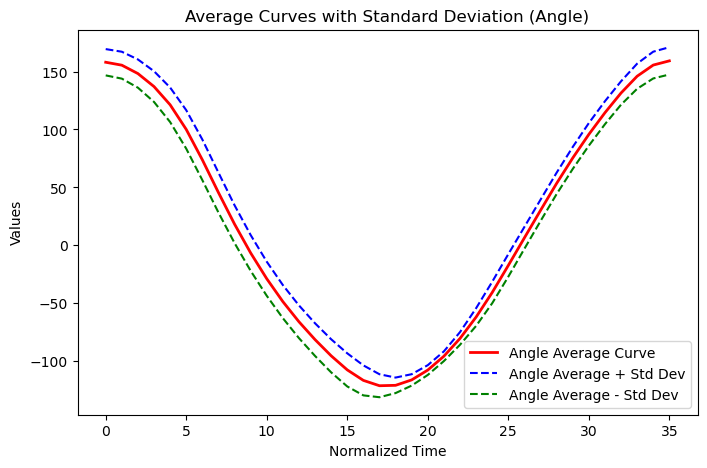

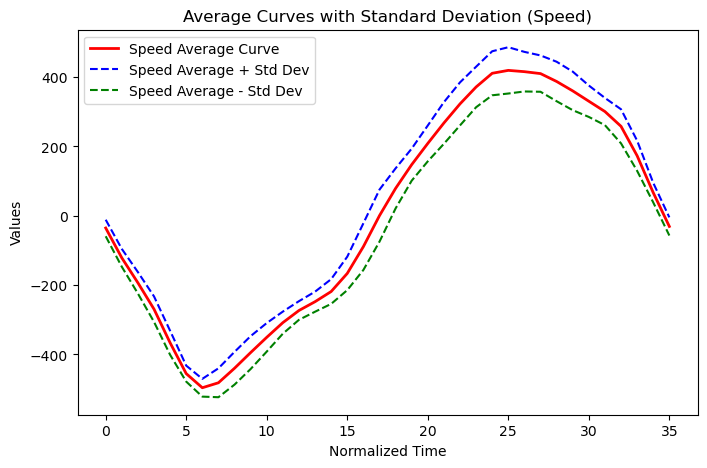

Global CV (ROM): 27.38%
Global CV (Speed): 23.06%


In [19]:
data_to_append = []  # Your list of values

# Get the averages and standard deviations for angles and speeds
position_averagesAng, position_std_deviationsAng = plot_average_curve_with_std(angles, 'Angle')
position_averagesSpd, position_std_deviationsSpd = plot_average_curve_with_std(speeds, 'Speed')

# Ensure that values are native Python floats (not np.float64)
position_averagesAng = [float(val) for val in position_averagesAng]
position_std_deviationsAng = [float(val) for val in position_std_deviationsAng]
position_averagesSpd = [float(val) for val in position_averagesSpd]
position_std_deviationsSpd = [float(val) for val in position_std_deviationsSpd]

# Directly append lists to the data
data_to_append.append(position_averagesAng)
data_to_append.append(position_std_deviationsAng)
data_to_append.append(position_averagesSpd)
data_to_append.append(position_std_deviationsSpd)

threshold_rom = 1    # degrees
threshold_spd = 3    # speed units, given your ±150 range

cv_rom_values = []
cv_spd_values = []

# Compute ROM CV with safe filtering
for mean_val, sd_val in zip(position_averagesAng, position_std_deviationsAng):
    if abs(mean_val) > threshold_rom:  # Only consider non-zero values
        cv_rom_values.append((sd_val / abs(mean_val)) * 100)  # Use abs(mean_val) here

# Compute Speed CV with safe filtering
for mean_val, sd_val in zip(position_averagesSpd, position_std_deviationsSpd):
    if abs(mean_val) > threshold_spd:  # Only consider non-zero values
        cv_spd_values.append((sd_val / abs(mean_val)) * 100)  # Use abs(mean_val) here

# Calculate global CV
global_cv_rom = np.mean(cv_rom_values)
global_cv_spd = np.mean(cv_spd_values)
print(f"Global CV (ROM): {global_cv_rom:.2f}%")
print(f"Global CV (Speed): {global_cv_spd:.2f}%")

coefficient_of_variation = float(global_cv_rom), float(global_cv_spd)

In [20]:
# Weighted CV computation for ROM (Angle)
cv_rom_values = []
weights_rom = []

for mean_val, sd_val in zip(position_averagesAng, position_std_deviationsAng):
    if abs(mean_val) > 1e-6:  # avoid division by near-zero numbers
        cv_val = (sd_val / abs(mean_val)) * 100
    else:
        cv_val = 0  # near-zero mean; no contribution
    weight = abs(mean_val)
    cv_rom_values.append(cv_val)
    weights_rom.append(weight)

global_weighted_cv_rom = np.sum(np.array(cv_rom_values) * np.array(weights_rom)) / np.sum(weights_rom)

# Weighted CV computation for Speed
cv_spd_values = []
weights_spd = []

for mean_val, sd_val in zip(position_averagesSpd, position_std_deviationsSpd):
    if abs(mean_val) > 1e-6:
        cv_val = (sd_val / abs(mean_val)) * 100
    else:
        cv_val = 0
    weight = abs(mean_val)
    cv_spd_values.append(cv_val)
    weights_spd.append(weight)

global_weighted_cv_spd = np.sum(np.array(cv_spd_values) * np.array(weights_spd)) / np.sum(weights_spd)

# Print results
print(f"Weighted Global CV (ROM): {global_weighted_cv_rom:.2f}%")
print(f"Weighted Global CV (Speed): {global_weighted_cv_spd:.2f}%")

# Add to your final CSV row or results dictionary
coefficient_of_variation = float(global_weighted_cv_rom), float(global_weighted_cv_spd)
data_row_finalCSV['Homogeneity Coefficient'] = coefficient_of_variation

Weighted Global CV (ROM): 12.61%
Weighted Global CV (Speed): 16.34%


Peaks found: [  7  52  88 128 171 210 251 289 327]


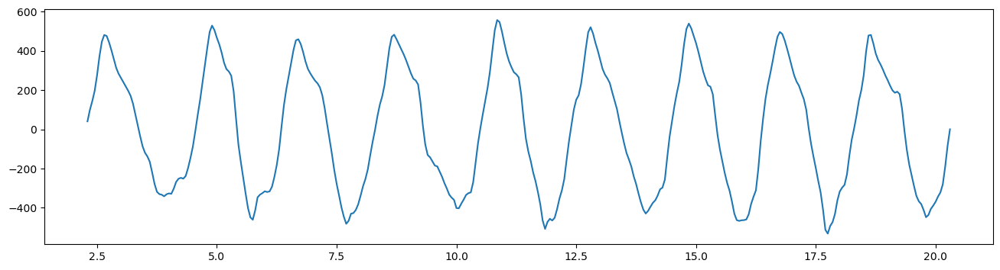

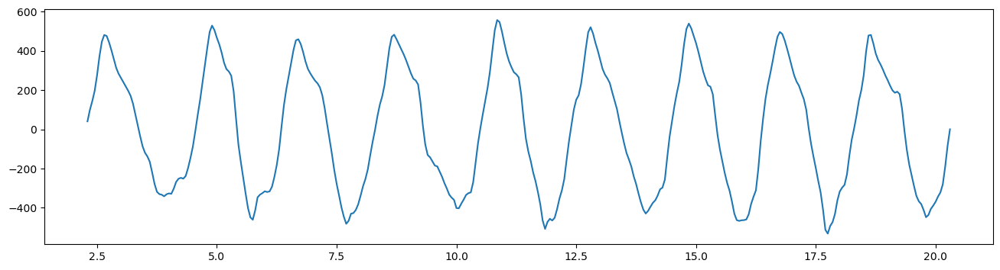

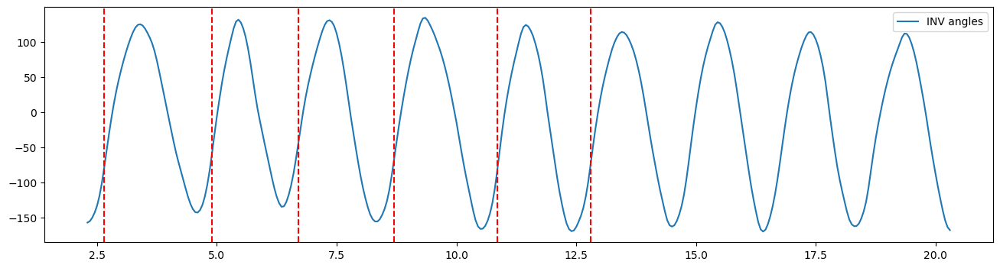

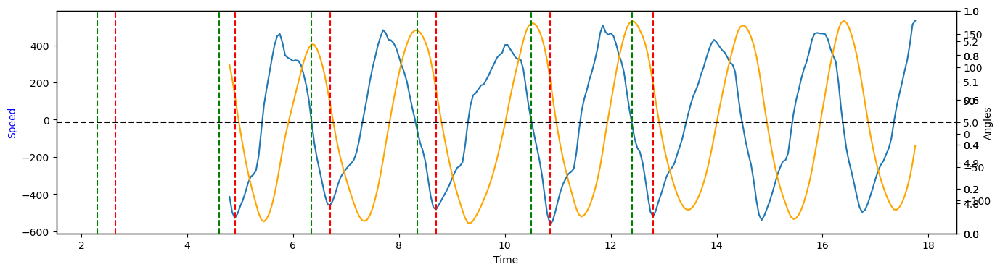

In [21]:

InvAngularSpd = [x * (-1) for x in angularSpd]
    
 
plt.figure(figsize=[16,4])
plt.plot(csvtimes, InvAngularSpd, label= 'INV SPD')

plt.figure(figsize=[16,4])
plt.plot(csvtimes[0:500], InvAngularSpd[0:500], label= 'SPD')
peaks2, properties2 = sig.find_peaks(x = InvAngularSpd, height = 100, distance= 25)

InvAngles = [x * (-1) for x in csvangles]
    
 
plt.figure(figsize=[16,4])
plt.plot(csvtimes, InvAngles, label= 'INV angles')

invPeaks, properties2 = sig.find_peaks(x = InvAngles, height = 15, distance= 25)

print("Peaks found:",peaks2)
smolpeaks2 = peaks2[0:6]

for peak in smolpeaks2:
    plt.axvline(csvtimes[peak], linestyle = '--', color = "r")
plt.legend()    
    
    
    
fig, ax = plt.subplots(figsize = [16,4])
axes = [ax, ax.twinx()]


ax.plot(csvtimes[50:310], angularSpd[50:310])
ax.set_ylabel('Speed', color = 'Blue')
ax.tick_params(axis='y')
ax.twinx().plot(csvtimes[50:310], csvangles[50:310], color = 'Orange')
ax.twinx().set_ylabel('Angles')
ax.twinx().tick_params(axis='y')

axes[0].set_xlabel('Time')
smolpeaks = peaks[0:6]
for peak in smolpeaks:
    plt.axvline(csvtimes[peak], linestyle = '--', color = "g")
    
for peak in smolpeaks2:
    plt.axvline(csvtimes[peak], linestyle = '--', color = "r")
    
plt.axhline(y = 5, color = 'Black', linestyle = '--', label = '5º')
plt.show()


In [22]:
def maxSpdAngles (angles, peaks):
    maxAngles = []
    for i in range (0, len(peaks),1):
        maxAngles.append(angles[peaks[i]])
    return maxAngles

In [23]:
def minSpdAngles (angles, peaks):
    minAngles = []
    for i in range (0, len(peaks),1):
        minAngles.append(angles[peaks[i]])
    return minAngles

In [24]:
def separación (angulos):
    segmentos =[]
    segmentosFlex =[]
    segmentosExt = []
    prevPeak=0
    nextseg = 0
    segInv=[]
    i=0
    extPeaks=[]
    shortestLenghtExt=99
    shortestLenghtFlex=99

    peaks, _ = sig.find_peaks(angulos, height=45, distance=25)
    
    if len(peaks) > 1:
        # Compute the average distance between peaks (excluding first)
        avg_distance = np.mean(np.diff(peaks[1:]))
    
        # Check if the first peak is too close to index 0
        if peaks[0] < avg_distance * 0.5:
            peaks = peaks[1:]  # Remove the first peak
    
    # Ensure the first peak is at index 0
    if 0 not in peaks:
        peaks = np.insert(peaks, 0, 0)
    # last_index = len(csvangles) - 1
    # if last_index not in peaks:
    #     peaks = np.append(peaks, last_index)
    
    #peaks = np.delete(peaks, 0)
    print("capullo")
    print(len(peaks))
    for peak in peaks:
        if(peak==0):
            continue
        segmentos.append(angulos[prevPeak:peak])
        prevPeak= peak
        
    segmentos.append(angulos[prevPeak:-1])
    #print(len(segmentos))
    #print("Aloha")
    #print(segmentos)
    for segmento in segmentos:
        InvAngulos = [x * (-1) for x in segmento]
        segInv.append(InvAngulos)
    print(len(segInv))
    for seg in segInv:
       
            #peaks, properties =sig.find_peaks(x = segmento,  height = 0.2, distance= 5)
        peak=np.argmax(seg)
        
            #print(peaks2[0])
        extPeaks.append(peak)
        
    for segmento in segmentos:
        #print(extPeaks[i])
        segmentosExt.append(segmento[0:extPeaks[i]])
        if ((len(segmento[0:extPeaks[i]])<shortestLenghtExt) and (len(segmento[0:extPeaks[i]])>1)) :
            shortestLenghtExt=len(segmento[0:extPeaks[i]])
        segmentosFlex.append(segmento[extPeaks[i]:-1])
        if ((len(segmento[extPeaks[i]:-1])<shortestLenghtFlex) and (len(segmento[extPeaks[i]:-1])>1)):
            shortestLenghtFlex=len(segmento[extPeaks[i]:-1])
        i = i +1
        
    #for segmento in segmentos:
            #InvAngulos = [x * (-1) for x in segmento]
            #peaks2, properties2 = sig.find_peaks(x = InvAngulos, height = 5, distance= 5)
            #print(peaks2)
            #segmentosExt.append(segmento[0:peaks2])
            #segmentosFlex.append(segmento[peaks2:-1])

        
    return  segmentosExt, segmentosFlex, segmentos, peaks, extPeaks, shortestLenghtExt, shortestLenghtFlex

In [25]:
# --- Segmentación de ángulos y velocidad por fase ---

# Ángulos
segmentosExt, segmentosFlex, segmentos, peaks, extPeaks, shortestLenghtExt, shortestLenghtFlex = separación(csvangles)

# Velocidad
segmentosSpd = []
segmentosSpdExt = []
segmentosSpdFlex = []
prevPeak = 0
i = 0

for peak in peaks:
    if peak == 0:
        continue
    segmentosSpd.append(angularSpd[prevPeak:peak])
    prevPeak = peak
segmentosSpd.append(angularSpd[prevPeak:-1])

for segmento in segmentosSpd:
    segmentosSpdExt.append(segmento[0:extPeaks[i]])
    segmentosSpdFlex.append(segmento[extPeaks[i]:-1])
    i += 1


capullo
9
9


In [26]:
def cortesAngles (segmentosExt, segmentosFlex, segmentosSpdExt, segmentosSpdFlex):
    
    segSpdInv=[]
    puntoCorteFlex=[]
    puntoCorteExt=[]
    flexPeaks=[]
    extPeaks=[]
    segmentosSpdFlex[0]=segmentosSpdFlex[1]
    segmentosSpdExt[0]=segmentosSpdExt[1]

    for segmento in segmentosSpdFlex:
        

        #peaks, properties =sig.find_peaks(x = segmento,  height = 0.2, distance= 5)
        peak=np.argmax(segmento)
        flexPeaks.append(peak)
  
    for segmento in segmentosSpdExt:    
        InvAngulos = [x * (-1) for x in segmento]
        segSpdInv.append(InvAngulos)
   
    for seg in segSpdInv:
        
        #peaks2, properties2 =sig.find_peaks(x = seg, height = 0.2, distance= 5)
        peak=np.argmax(seg)
        extPeaks.append(peak)
        

    for segmento in segmentosFlex:
        index = flexPeaks[segmentosFlex.index(segmento)]

        puntoCorteFlex.append(segmento[index])
        #print(segmentosFlex.index(segmento))
        #print(segmento[index])




    print("hey")
    print(len(extPeaks))
    print(len(segmentosExt))
    index=0
    for segmento in segmentosExt:

        print(index)
        print(segmento)
        print(segmento[index])
        puntoCorteExt.append(segmento[index])
        index =index+1

    return puntoCorteFlex, puntoCorteExt, segSpdInv, flexPeaks, extPeaks

In [27]:
def xNorm (segmentosExt, segmentosFlex, segmentosSpdExt, segmentosSpdFlex):
    maxValAngle = 1
    minValAngle = 0
    diff = maxValAngle - minValAngle
    diff_arr = 0
    segmentosExtNorm = []
    segmentosFlexNorm = []
    for segmento in segmentosExt:
        maxValAngle = max(segmento)
        minValAngle = min(segmento)
        diff_arr = max(arr) - min(arr)
        

    diff_arr = max(arr) - min(arr)   
    for i in arr:
        temp = (((i - min(arr))*diff)/diff_arr) + t_min
        norm_arr.append(temp)
    return norm_arr
    

In [28]:
def yNorm (segmentosExt, segmentosFlex):
    t_max = 1
    t_min = 0
    diff = t_max - t_min
    diff_arr = 0
    segmentosExtNorm = []
    segmentosFlexNorm = []
    
    for segmento in segmentosExt:
        if (segmentosExt.index(segmento)!=0):


            normSegmento = []
            maxValAngle = max(segmento)
            minValAngle = min(segmento)
            diff_arr = max(segmento) - min(segmento)
            for value in segmento:
                temp = (((value - min(segmento))*diff)/diff_arr) + t_min
                normSegmento.append(temp)
            segmentosExtNorm.append(normSegmento)
        else:
            segmentosExtNorm.append(0)
    for segmento in segmentosFlex:
        normSegmento = []
        maxValAngle = max(segmento)
        minValAngle = min(segmento)
        diff_arr = max(segmento) - min(segmento)
        for value in segmento:
            temp = (((value - min(segmento))*diff)/diff_arr) + t_min
            normSegmento.append(temp)
        segmentosFlexNorm.append(normSegmento)   

    return segmentosExtNorm, segmentosFlexNorm
    

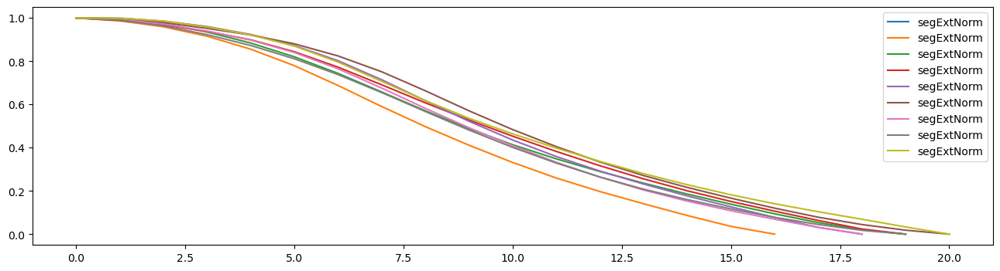

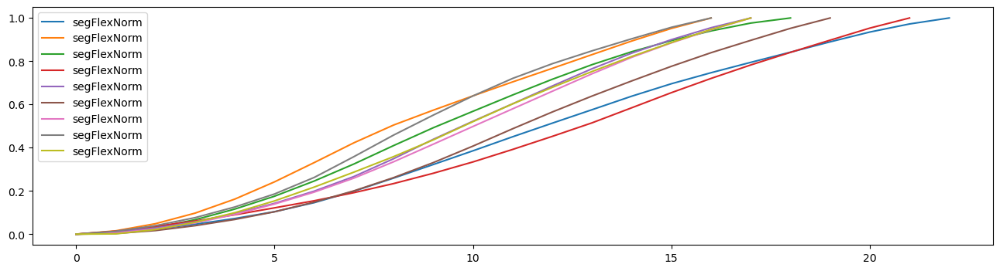

In [29]:
segmentosExtNorm, segmentosFlexNorm = yNorm(segmentosExt, segmentosFlex)

plt.figure(figsize=[16,4])
for segmento in segmentosExtNorm:

    plt.plot(segmento,label= 'segExtNorm')

plt.legend()

plt.figure(figsize=[16,4])
for segmento in segmentosFlexNorm:
    plt.plot(segmento,label= 'segFlexNorm')
plt.legend()


In [30]:
def conversiónTemporal (segmentosFlex, segmentosExt, segmentosSpdExt, segmentosSpdFlex):
    segmentosSpdExtTemp = []
    segmentosSpdFlexTemp = []
    segmentosFlexTemp = []
    segmentosExtTemp = []
    minLenFlex = 99
    minLenExt = 99
    minLenSpdFlex = 99
    minLenSpdExt = 99

    for segmento in segmentosFlex:
        if (len(segmento)<minLenFlex):
            minLenFlex = len(segmento)
    for segmento in segmentosExt:
        if (len(segmento)<minLenExt):
            minLenExt = len(segmento)
    for segmento in segmentosSpdFlex:
        if (len(segmento)<minLenSpdFlex):
            minLenSpdFlex = len(segmento)
    for segmento in segmentosSpdExt:
        if (len(segmento)<minLenSpdExt):
            minLenSpdExt = len(segmento)
                    
    for segmento in segmentosFlex:
        resampled_signal = np.interp(
        np.linspace(0.0, 1.0, minLenFlex, endpoint=False),  # where to interpret
        np.linspace(0.0, 1.0, len(segmento), endpoint=False),  # known positions
        segmento,  # known data points
    )

        segmentosFlexTemp.append(resampled_signal)

        
    for segmento in segmentosExt:
        resampled_signal = np.interp(
        np.linspace(0.0, 1.0, minLenExt, endpoint=False),  # where to interpret
        np.linspace(0.0, 1.0, len(segmento), endpoint=False),  # known positions
        segmento,  # known data points
    )
        segmentosExtTemp.append(resampled_signal)   
        #segmentosExtTemp.append(sig.resample(segmento,minLenExt))   
        
    for segmento in segmentosSpdFlex:
        resampled_signal = np.interp(
        np.linspace(0.0, 1.0, minLenSpdFlex, endpoint=False),  # where to interpret
        np.linspace(0.0, 1.0, len(segmento), endpoint=False),  # known positions
        segmento,  # known data points
    )
        segmentosSpdFlexTemp.append(resampled_signal)
        #segmentosSpdFlexTemp.append(sig.resample(segmento,minLenSpdFlex))
        
    for segmento in segmentosSpdExt:
        resampled_signal = np.interp(
        np.linspace(0.0, 1.0, minLenSpdExt, endpoint=False),  # where to interpret
        np.linspace(0.0, 1.0, len(segmento), endpoint=False),  # known positions
        segmento,  # known data points
    )
        segmentosSpdExtTemp.append(resampled_signal)    
        #segmentosSpdExtTemp.append(sig.resample(segmento,minLenSpdExt))    


    return segmentosFlexTemp, segmentosExtTemp, segmentosSpdFlexTemp, segmentosSpdExtTemp

In [31]:
def cortesAnglesTemp (segmentosExtTemp, segmentosFlexTemp, segmentosSpdExtTemp, segmentosSpdFlexTemp):
    
    segSpdInvT=[]
    puntoCorteFlexT=[]
    puntoCorteExtT=[]
    flexPeaksT=[]
    extPeaksT=[]
    indexFlex =0
    indexExt =0

    for segmento in segmentosSpdFlex:
        

        #peaks, properties =sig.find_peaks(x = segmento,  height = 0.2, distance= 5)
        peak=np.argmax(segmento)
        flexPeaksT.append(peak)
        
    for segmento in segmentosSpdExtTemp:    
        InvAngulos = [x * (-1) for x in segmento]
        segSpdInvT.append(InvAngulos)
   
    for seg in segSpdInvT:
        
        #peaks2, properties2 =sig.find_peaks(x = seg, height = 0.2, distance= 5)
        peak=np.argmax(seg)
        extPeaksT.append(peak)

    for segmento in segmentosFlexTemp:
        

        index = flexPeaksT[indexFlex]
        puntoCorteFlex.append(segmento[index])
        #print(segmentosFlex.index(segmento))
        #print(segmento[index])
        indexFlex=indexFlex+1
    index=0 



    for segmento in segmentosExtTemp:
        
        index = extPeaksT[indexExt]
        puntoCorteExtT.append(segmento[index])
        indexExt=indexExt+1
    return puntoCorteFlexT, puntoCorteExtT, segSpdInvT, flexPeaksT, extPeaksT

Skipping invalid row: ['', '', '', '', '', '', '89', '', '', '69.07']
Skipping invalid row: ['', '', '', '', '', '', '90', '', '', '71.25']
Skipping invalid row: ['', '', '', '', '', '', '91', '', '', '71.5']
Skipping invalid row: ['', '', '', '', '', '', '92', '', '', '69.7']
Skipping invalid row: ['', '', '', '', '', '', '93', '', '', '65.97']
Skipping invalid row: ['', '', '', '', '', '', '94', '', '', '60.03']
Skipping invalid row: ['', '', '', '', '', '', '95', '', '', '51.88']
Skipping invalid row: ['', '', '', '', '', '', '96', '', '', '41.5']
Skipping invalid row: ['', '', '', '', '', '', '97', '', '', '29.07']
Skipping invalid row: ['', '', '', '', '', '', '98', '', '', '15.84']
Skipping invalid row: ['', '', '', '', '', '', '99', '', '', '3.19']
Skipping invalid row: ['', '', '', '', '', '', '100', '', '', '-8.48']
Skipping invalid row: ['', '', '', '', '', '', '101', '', '', '-19.33']
Skipping invalid row: ['', '', '', '', '', '', '102', '', '', '-29.11']
Skipping invalid ro

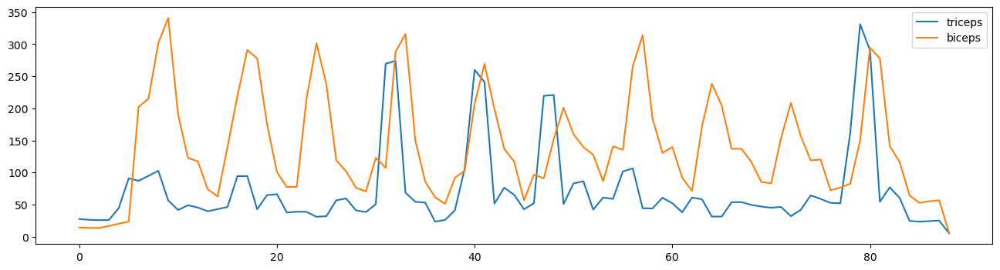

In [32]:
# Initialize lists for the triceps and biceps EMG data
tricepsEMG = []
bicepsEMG = []

# Open and read the CSV file
with open(basic, newline='') as csvfile:
    csvreader = csv.reader(csvfile, delimiter=';', quotechar='|')
    next(csvreader)  # Skip the header row
    for row in csvreader:
        try:
            # Extract and convert the values from the 8th and 9th columns (index 7 and 8)
            triceps_value = float(row[7].replace(",", "."))
            biceps_value = float(row[6].replace(",", "."))
            tricepsEMG.append(triceps_value)
            bicepsEMG.append(biceps_value)
        except (ValueError, IndexError):
            # Handle the case where conversion fails or the row is malformed
            print(f"Skipping invalid row: {row}")

# Print or use the tricepsEMG and bicepsEMG lists as needed
#print(tricepsEMG)
#print(bicepsEMG)

plt.figure(figsize=[16,4])
plt.plot(tricepsEMG,label= 'triceps')
plt.plot(bicepsEMG,label= 'biceps') 
plt.legend()


window = 0.25


In [33]:
def separacionPruebasEMG (index1, index2,tricepsEMG, bicepsEMG ):

    newTriceps = []
    newBiceps = []
    print(index1)
    newTriceps = tricepsEMG [index1: index2]
    newBiceps = bicepsEMG [index1: index2]
    print(len(newTriceps))
    return newTriceps, newBiceps

In [34]:
def ajusteRMSInterp(length, tricepsEMG, bicepsEMG):
    tricepsEMGad=[]
    bicepsEMGad=[]

    print(len(tricepsEMG))
    print(len(bicepsEMG))
    trc = np.interp(
    np.linspace(0.0, 1.0, length, endpoint=False),  # where to interpret
    np.linspace(0.0, 1.0, len(tricepsEMG), endpoint=False),  # known positions
    tricepsEMG,  # known data points
    )

    tricepsEMGad=trc
    
    print(len(trc))
    
    bic = np.interp(
    np.linspace(0.0, 1.0, length, endpoint=False),  # where to interpret
    np.linspace(0.0, 1.0, len(bicepsEMG), endpoint=False),  # known positions
    bicepsEMG,  # known data points
    )
    
    bicepsEMGad=bic
    print(len(bic))
    return tricepsEMGad, bicepsEMGad

89
89
447
447
plot triceps
plot biceps


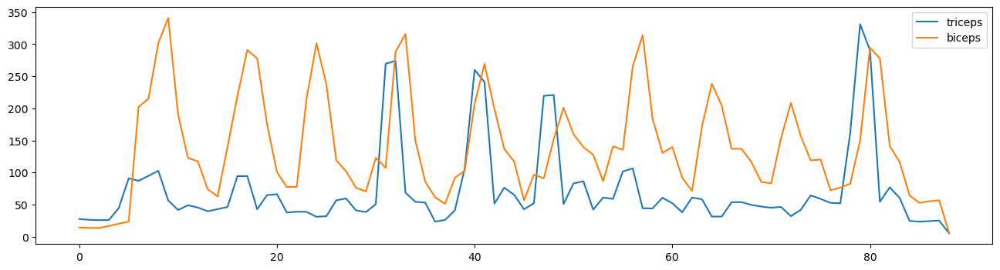

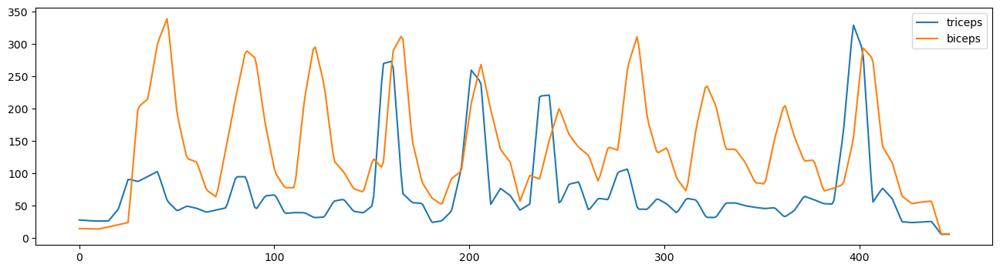

In [35]:
tricepsEMGad, bicepsEMGad= ajusteRMSInterp(length, tricepsEMG, bicepsEMG)

#print (bicepsEMGad)
#print(len(bicepsEMGad))
#print(len(tricepsEMGad))
plt.figure(figsize=[16,4])
plt.plot(tricepsEMG,label= 'triceps')
plt.plot(bicepsEMG,label= 'biceps') 
plt.legend()

plt.figure(figsize=[16,4])
plt.plot(tricepsEMGad,label= 'triceps')
print("plot triceps")
plt.plot(bicepsEMGad,label= 'biceps') 
print("plot biceps")
plt.legend()

In [36]:
def baseLine(tricepsEMGad, bicepsEMGad, indexBaseLine):
    
    triceps = tricepsEMGad
   
    triceps = tricepsEMGad[0:indexBaseLine]
    
    biceps = bicepsEMGad
    biceps = bicepsEMGad [0:indexBaseLine]

    #print(trice)
    
    minValTrc = min(triceps)
    minValBic = min(biceps)
    print(minValTrc)
    print("----sup")
    indexTrc = np.where(triceps == minValTrc)[0]
    indexBic = np.where(biceps == minValBic)[0]
    
    print(indexTrc[0])
    if((indexTrc[0]-30)<0):
        firstIndex=0
    else:
        firstIndex=indexTrc[0]-30
        
    if((indexBic[0]-30)<0):
        secondIndex=0
    else:
        secondIndex=indexBic[0]-30
        
    windowTrc = triceps[(firstIndex):(indexTrc[0]+30)]
    windowBic = biceps[(secondIndex):(indexBic[0]+30)]
    print(windowTrc)
    thresholdTrc = stat.mean(windowTrc) + 3* stat.stdev(windowTrc)
    thresholdBic = stat.mean(windowBic) + 3* stat.stdev(windowBic)
    #1 muestra son 0.05s osea 5 ms
    #60 muestras (+- 30) de window
    #hacer la media de este nuevo array y la desviación estándar.
    
    return thresholdTrc, thresholdBic

In [37]:
def correctBaseLine(tricepsEMGadnorm, bicepsEMGadnorm, thresholdTrc, thresholdBic):
    tricepsEMGadnorm = tricepsEMGadnorm - thresholdTrc
    bicepsEMGadnorm = bicepsEMGadnorm - thresholdBic
    
    return tricepsEMGadnorm, bicepsEMGadnorm

In [38]:
def normalizacionSignal (tricepsEMGad, bicepsEMGad):
    t_max = 1
    t_min = 0
    diff = t_max - t_min
    diff_arr = 0
    maxValAngle=0
    minValAngle = 0
    tricepsEMGadTempNorm = []
    bicepsEMGadTempNorm = []

    
    maxValAngle = max(tricepsEMGad)

    minValAngle = min(tricepsEMGad)
            
            


    normSegmento = []


    diff_arr = maxValAngle - minValAngle
    for value in tricepsEMGad:
        temp = (((value - minValAngle)*diff)/diff_arr) + t_min
        normSegmento.append(temp)
    tricepsEMGadTempNorm.append(normSegmento)
        
    maxValAngle = max(bicepsEMGad)

    minValAngle = min(bicepsEMGad)
    diff_arr =0
    
    normSegmento2= []


    diff_arr = maxValAngle - minValAngle
    for value in bicepsEMGad:
        temp = (((value - minValAngle)*diff)/diff_arr) + t_min
        normSegmento2.append(temp)
    bicepsEMGadTempNorm.append(normSegmento2)

    return tricepsEMGadTempNorm, bicepsEMGadTempNorm

25.75536912751678
----sup
10
[ 27.56        27.31908277  27.07816555  26.83724832  26.5963311
  26.35541387  26.23322148  26.11375839  25.9942953   25.87483221
  25.75536913  25.80514541  25.86288591  25.9206264   25.97836689
  26.03610738  29.50297539  33.21628635  36.92959732  40.64290828
  44.35621924  53.0690604   62.27568233  71.48230425  80.68892617
  89.8955481   90.24780761  89.47926174  88.71071588  87.94217002
  87.17362416  88.39295302  89.92208054  91.45120805  92.98033557
  94.50946309  96.07550336  97.648434    99.22136465 100.7942953 ]
45
361


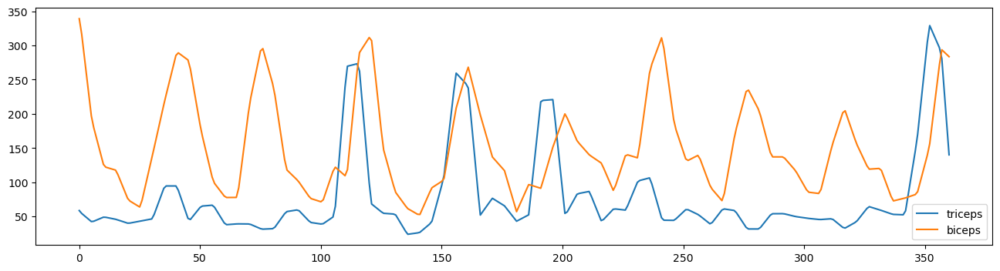

In [39]:

thresholdTrc, thresholdBic = baseLine(tricepsEMGad, bicepsEMGad, indexBaseLine)

tricepsEMGadTempNorm, bicepsEMGadTempNorm = correctBaseLine(tricepsEMGad, bicepsEMGad, thresholdTrc, thresholdBic)
tricepsEMGadTempNorm, bicepsEMGadTempNorm = normalizacionSignal (tricepsEMGadTempNorm, bicepsEMGadTempNorm)
thresholdTrc=thresholdTrc -0
thresholdBic= thresholdBic -0
#print(thresholdTrc)
#print(thresholdBic)

tricepsEMGad, bicepsEMGad = separacionPruebasEMG (index1, index2, tricepsEMGad, bicepsEMGad )
plt.figure(figsize=[16,4])
plt.plot(tricepsEMGad,label= 'triceps')
plt.plot(bicepsEMGad,label= 'biceps') 
plt.legend()



In [40]:
def separaciónRMS (angulos, tricepsEMGad, bicepsEMGad):
    
    segmentos=[]
    segmentosRMStrc =[]
    segmentosRMSbic =[]
    segmentosFlexRMStrc =[]
    segmentosExtRMStrc = []
    segmentosFlexRMSbic =[]
    segmentosExtRMSbic = []
    prevPeak=0
    nextseg = 0
    segInv=[]
    i=0
    extPeaks=[]
    
    print(len(segInv))
    
        
    for segmento in segmentos:
        #print(extPeaks[i])
        segmentosExt.append(segmento[0:extPeaks[i]])
        if ((len(segmento[0:extPeaks[i]])<shortestLenghtExt) and (len(segmento[0:extPeaks[i]])>1)) :
            shortestLenghtExt=len(segmento[0:extPeaks[i]])
        segmentosFlex.append(segmento[extPeaks[i]:-1])
        if ((len(segmento[extPeaks[i]:-1])<shortestLenghtFlex) and (len(segmento[extPeaks[i]:-1])>1)):
            shortestLenghtFlex=len(segmento[extPeaks[i]:-1])
        i = i +1
        
        
        

    peaks, _ = sig.find_peaks(angulos, height=45, distance=25)
    
    if len(peaks) > 1:
        # Compute the average distance between peaks (excluding first)
        avg_distance = np.mean(np.diff(peaks[1:]))
    
        # Check if the first peak is too close to index 0
        if peaks[0] < avg_distance * 0.5:
            peaks = peaks[1:]  # Remove the first peak
    
    # Ensure the first peak is at index 0
    if 0 not in peaks:
        peaks = np.insert(peaks, 0, 0)
    # last_index = len(csvangles) - 1
    # if last_index not in peaks:
    #     peaks = np.append(peaks, last_index)
        
    print(peaks)
    for peak in peaks:
        if(peak==0):
            prevPeak=peak
            continue
        segmentos.append(angulos[prevPeak:peak])
        prevPeak= peak
        
    segmentos.append(angulos[prevPeak:-1])
    print(len(segmentos))
    for segmento in segmentos:
        InvAngulos = [x * (-1) for x in segmento]
        segInv.append(InvAngulos)
        
    prevPeak=0   
    peaks, _ = sig.find_peaks(angulos, height=45, distance=25)
    
    if len(peaks) > 1:
        # Compute the average distance between peaks (excluding first)
        avg_distance = np.mean(np.diff(peaks[1:]))
    
        # Check if the first peak is too close to index 0
        if peaks[0] < avg_distance * 0.5:
            peaks = peaks[1:]  # Remove the first peak
    
    # Ensure the first peak is at index 0
    if 0 not in peaks:
        peaks = np.insert(peaks, 0, 0)
    # last_index = len(csvangles) - 1
    # if last_index not in peaks:
    #     peaks = np.append(peaks, last_index)
        
    for peak in peaks:
        if(peak==0):
            prevPeak=peak
            continue
        segmentosRMStrc.append(tricepsEMGad[prevPeak:peak])
        segmentosRMSbic.append(bicepsEMGad[prevPeak:peak])
        prevPeak= peak
    segmentosRMStrc.append(tricepsEMGad[prevPeak:-1])
    segmentosRMSbic.append(bicepsEMGad[prevPeak:-1])
    for seg in segInv:
       
        #peaks, properties =sig.find_peaks(x = segmento,  height = 0.2, distance= 5)
        peak=np.argmax(seg)
        
            #print(peaks2[0])
        extPeaks.append(peak)
        
    for segmento in segmentosRMStrc:
        
        segmentosExtRMStrc.append(segmento[0:extPeaks[i]])
        segmentosFlexRMStrc.append(segmento[extPeaks[i]:-1])
        i = i +1
    i=0
    for segmento in segmentosRMSbic:
        
        segmentosExtRMSbic.append(segmento[0:extPeaks[i]])
        segmentosFlexRMSbic.append(segmento[extPeaks[i]:-1])
        i = i +1
            
    #for segmento in segmentos:
            #InvAngulos = [x * (-1) for x in segmento]
            #peaks2, properties2 = sig.find_peaks(x = InvAngulos, height = 5, distance= 5)
            #print(peaks2)
            #segmentosExt.append(segmento[0:peaks2])
            #segmentosFlex.append(segmento[peaks2:-1])

        
    return  segmentosExtRMStrc, segmentosFlexRMStrc, segmentosExtRMSbic, segmentosFlexRMSbic, segmentos,  peaks, extPeaks

0
[  0  46  81 121 164 202 244 282 320]
9


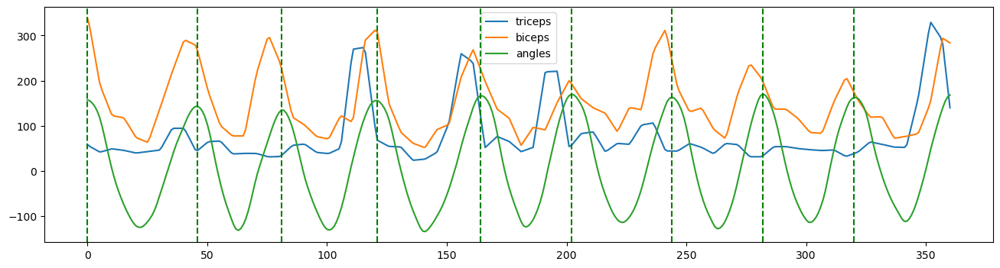

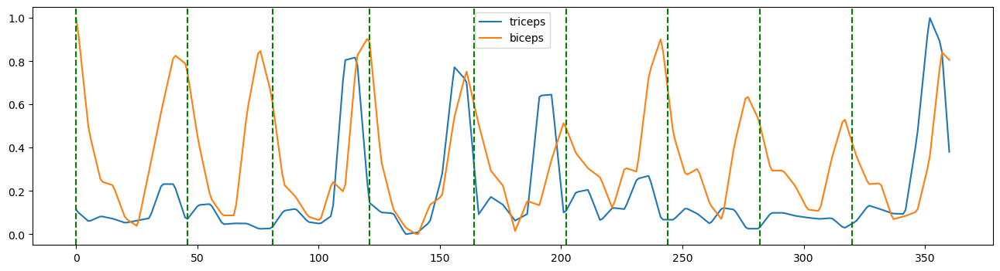

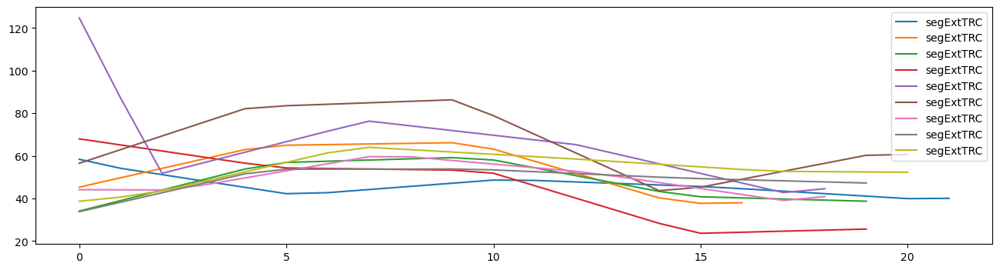

<Figure size 1600x400 with 0 Axes>

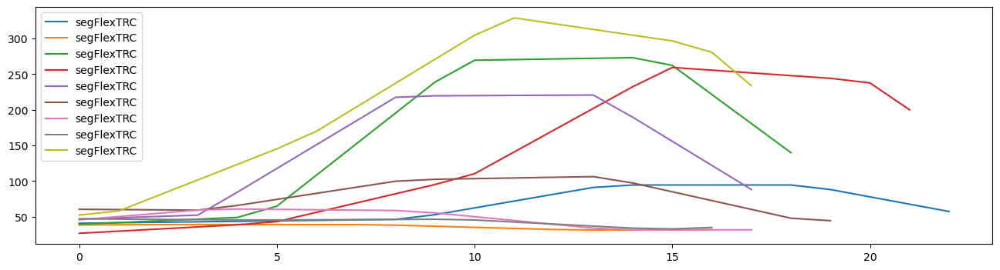

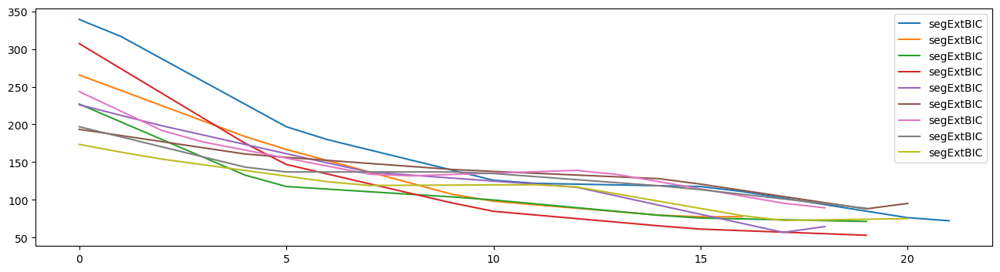

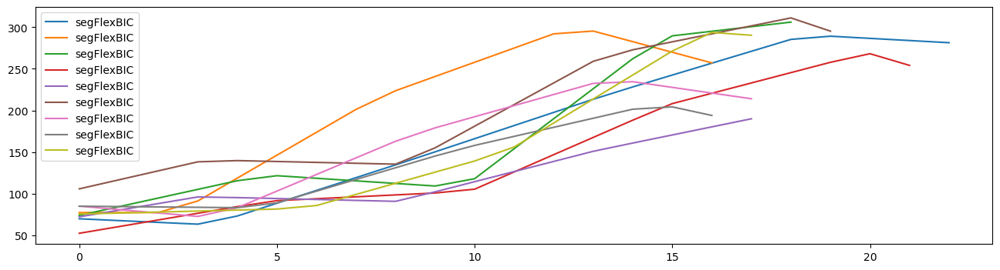

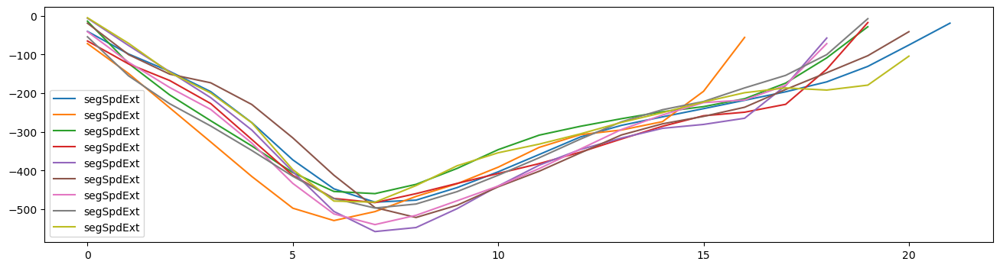

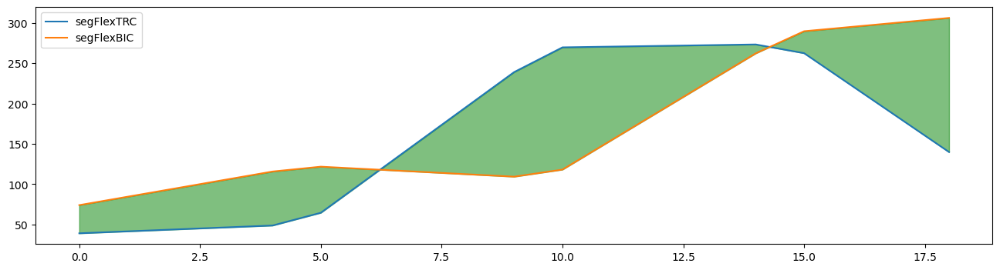

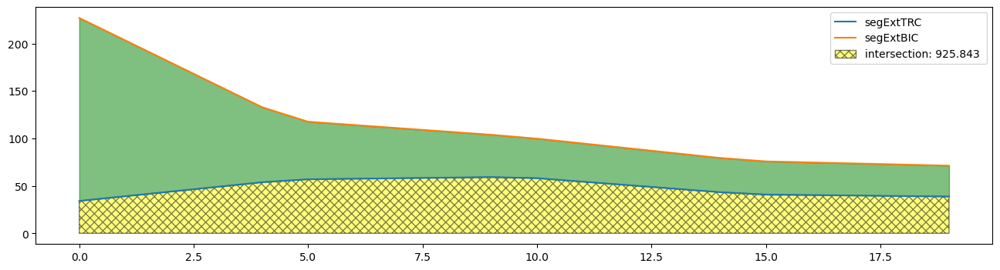

In [41]:
segmentosExtRMStrc, segmentosFlexRMStrc, segmentosExtRMSbic, segmentosFlexRMSbic, segmentos,  peaks, extPeaks=separaciónRMS (csvangles, tricepsEMGad, bicepsEMGad)
#print("wannaDie")
#print(segmentosFlexRMSbic[1])
plt.figure(figsize=[16,4])
plt.plot(tricepsEMGad,label= 'triceps')
plt.plot(bicepsEMGad,label= 'biceps') 
plt.plot(csvangles, label ='angles')
plt.legend()
for peak in peaks:
    plt.axvline(peak, linestyle = '--', color = "g")
tricepsEMGadTempNorm, bicepsEMGadTempNorm = normalizacionSignal (tricepsEMGad, bicepsEMGad)

# tricepsEMGadTempNorm, bicepsEMGadTempNorm = correctBaseLine(tricepsEMGadTempNorm, bicepsEMGadTempNorm, thresholdTrc, thresholdBic)
tricepsEMGadTempNorm = [0 if i < 0 else i for i in tricepsEMGadTempNorm[0]]
bicepsEMGadTempNorm = [0 if i < 0 else i for i in bicepsEMGadTempNorm[0]]
#print(tricepsEMGad)
#print(tricepsEMGadTempNorm)
#print(bicepsEMGadTempNorm)

plt.figure(figsize=[16,4])
plt.plot(tricepsEMGadTempNorm,label= 'triceps')
plt.plot(bicepsEMGadTempNorm,label= 'biceps') 
plt.legend()
for peak in peaks:
    plt.axvline(peak, linestyle = '--', color = "g")
    
RMStrcTemp=tricepsEMGadTempNorm
RMSbicTemp=bicepsEMGadTempNorm
   
plt.figure(figsize=[16,4])
for segmento in segmentosExtRMStrc:

    plt.plot(segmento,label= 'segExtTRC')
plt.legend()
plt.figure(figsize=[16,4])



plt.figure(figsize=[16,4])
for segmento in segmentosFlexRMStrc:
    plt.plot(segmento,label= 'segFlexTRC')
plt.legend()


plt.figure(figsize=[16,4])
for segmento in segmentosExtRMSbic:

    plt.plot(segmento,label= 'segExtBIC')

plt.legend()


plt.figure(figsize=[16,4])
for segmento in segmentosFlexRMSbic:
    plt.plot(segmento,label= 'segFlexBIC')
plt.legend()



plt.figure(figsize=[16,4])
for segmento in segmentosSpdExt:
    plt.plot(segmento,label = 'segSpdExt')
plt.legend()

x = np.arange(0,len(segmentosFlexRMStrc[2]),1)
plt.figure(figsize=[16,4])

plt.plot(segmentosFlexRMStrc[2],label= 'segFlexTRC')
plt.plot(segmentosFlexRMSbic[2],label= 'segFlexBIC')
plt.fill_between(x, segmentosFlexRMStrc[2], segmentosFlexRMSbic[2], color='green',
                 alpha=0.5)
plt.legend()

x = np.arange(0,len(segmentosExtRMStrc[2]),1)
plt.figure(figsize=[16,4])

plt.plot(segmentosExtRMStrc[2],label= 'segExtTRC')
plt.plot(segmentosExtRMSbic[2],label= 'segExtBIC')
plt.fill_between(x, segmentosExtRMStrc[2], segmentosExtRMSbic[2], color='green',
                 alpha=0.5)
plt.legend()


ys = []
x = np.arange(0,len(segmentosExtRMStrc[2]),1)
ys.append(segmentosExtRMStrc[2])
ys.append( segmentosExtRMSbic[2])
y_intersection = np.amin(ys, axis=0)
area = np.trapz(y_intersection, x)
fill_poly = plt.fill_between(x, 0, y_intersection, fc='yellow', ec='black', alpha=0.5,
                             label=f'intersection: {area:.3f} ')
fill_poly.set_hatch('xxx')
#print(area)
plt.legend()

In [42]:
def calculoArea2(segmentoTrc, segmentoBic):
    
    ys = []
    x = np.arange(0,len(segmentoTrc),1)
    ys.append(segmentoTrc)
    ys.append( segmentoBic)
    y_intersection = np.amin(ys, axis=0)
    area = np.trapz(y_intersection, x)
    print(area)
    return area

In [43]:
def integralSuperposiciónFlex(RMStrcTemp, RMSbicTemp):
    
    i=0
    x_y_curve1=[]
    x_y_curve2=[]
    areaSuperpos=0

    areaSuperpos = calculoArea2(RMStrcTemp, RMSbicTemp)
    
    return areaSuperpos

In [44]:
def integralRMSCompleta(RMStrcTemp, RMSbicTemp):
    
    areaRMSTrc=0
    areaRMSBic=0
 
    a = 0
    b = 0
    I=0
    
    b = len(RMStrcTemp)
    I = trapz(RMStrcTemp, dx=1)
    areaRMSTrc = I

    b = len(RMStrcTemp)
    I = trapz(RMSbicTemp, dx=1)
    areaRMSBic = I
        
    return areaRMSTrc, areaRMSBic

In [45]:
def integraciónParaCoeficienteCoactivación (areasSuperpos, areaRMSTrc, areaRMSBic):

    coeff=0
    
    coeff = 2*((areasSuperpos)/(areaRMSTrc+areaRMSBic))*100
       
    
    return coeff

In [46]:
areaSuperpos=integralSuperposiciónFlex(RMStrcTemp, RMSbicTemp)
print(areaSuperpos)
areaRMSTrc, areaRMSBic = integralRMSCompleta(RMStrcTemp, RMSbicTemp)
print(areaRMSTrc)
print(areaRMSBic)
coeff = integraciónParaCoeficienteCoactivación (areaSuperpos, areaRMSTrc, areaRMSBic)
print(coeff)

51.15294566165093
51.15294566165093
64.37829486696728
122.50184681432444
54.74412123347804


In [47]:
def cortesRMS (flexPeaks, extPeaks,segmentosExtRMStrc, segmentosFlexRMStrc, segmentosExtRMSbic, segmentosFlexRMSbic):
    cortesFlexRMStrc = []
    cortesExtRMStrc = []
    cortesFlexRMSbic = []
    cortesExtRMSbic = []
    index=0
    i=0
    #segmentosFlexRMStrc.pop()
    #segmentosFlexRMSbic.pop()
    print(len(segmentosFlexRMStrc))
    print(len(flexPeaks))
    print(flexPeaks)
    for segmento in segmentosFlexRMStrc:
        
        index = flexPeaks[i]
        cortesFlexRMStrc.append(segmento[index])
        i=i+1
    index=0
    i=0


    
    print(len(segmentosExtRMStrc))
    #segmentosExtRMStrc.pop(-1)
    #segmentosExtRMSbic.pop(-1)
    print(len(segmentosFlexRMStrc))
    print(len(extPeaks))
    print(extPeaks)
    
    for segmento in segmentosExtRMStrc:

        index = extPeaks[i]
        print(segmento)
        cortesExtRMStrc.append(segmento[index])
        i=i+1
        
    index=0
    i=0
    for segmento in segmentosFlexRMSbic:
        
        index = flexPeaks[i]
        cortesFlexRMSbic.append(segmento[index])
        i=i+1
        
    index=0 
    i=0
    for segmento in segmentosExtRMSbic:

        index = extPeaks[i]
        cortesExtRMSbic.append(segmento[index])
        i=i+1

    return cortesFlexRMStrc, cortesExtRMStrc, cortesFlexRMSbic, cortesExtRMSbic


In [48]:
def cortesAngles2 (segmentosExt, segmentosFlex, segmentosSpdExt, segmentosSpdFlex):
    
    segSpdInv=[]
    puntoCorteFlex=[]
    puntoCorteExt=[]
    flexPeaks=[]
    extPeaks=[]
    #segmentosSpdFlex[0]=segmentosSpdFlex[1]
    #segmentosSpdExt[0]=segmentosSpdExt[1]
    print(len(segmentosSpdFlex))
    for segmento in segmentosSpdFlex:
        

        #peaks, properties =sig.find_peaks(x = segmento,  height = 0.2, distance= 5)
        peak=np.argmax(segmento)
        flexPeaks.append(peak)
    print(len(flexPeaks))
    
        
    for segmento in segmentosSpdExt:    
        InvAngulos = [x * (-1) for x in segmento]
        segSpdInv.append(InvAngulos)
   
    for seg in segSpdInv:
        
        #peaks2, properties2 =sig.find_peaks(x = seg, height = 0.2, distance= 5)
        peak=np.argmax(seg)
        extPeaks.append(peak)

    i=0

    for segmento in segmentosFlex:


        index = flexPeaks[i]
        puntoCorteFlex.append(segmento[index])
        i=i+1
        #print(segmentosFlex.index(segmento))
        #print(segmento[index])
    index=0 


    i=0
    for segmento in segmentosExt:

        index = extPeaks[i]

        puntoCorteExt.append(segmento[index])
        i=i+1

    return puntoCorteFlex, puntoCorteExt, segSpdInv, flexPeaks, extPeaks

In [49]:
def conversiónTemporalRMS (segmentosFlex, segmentosExt, segmentosSpdExt, segmentosSpdFlex, segmentosExtRMStrc, segmentosFlexRMStrc, segmentosExtRMSbic, segmentosFlexRMSbic ):
    print("carajo")
    print(len(segmentosFlex))
    print(len(segmentosExt))
    print(len(segmentosSpdFlex))
    print(len(segmentosSpdExt))
    
    segmentosSpdExtTemp = []
    segmentosSpdFlexTemp = []
    segmentosFlexTemp = []
    segmentosExtTemp = []
    segmentosExtRMStrcTemp = []
    segmentosFlexRMStrcTemp = []
    segmentosExtRMSbicTemp = []
    segmentosFlexRMSbicTemp = []
    
    minLenFlex = 99
    minLenExt = 99
    minLenSpdFlex = 99
    minLenSpdExt = 99
    minLenFlexRMStrc = 99
    minLenExtRMStrc = 99
    minLenFlexRMSbic = 99
    minLenExtRMSbic = 99
    
    #segmentosFlexRMStrc.pop(0)
    #segmentosFlexRMSbic.pop(0)
    #segmentosExtRMStrc.pop(0)
    #segmentosExtRMSbic.pop(0)
    
    for segmento in segmentosFlex:
        if (len(segmento)<minLenFlex):
            minLenFlex = len(segmento)
    for segmento in segmentosExt:
        if (len(segmento)<minLenExt):
            minLenExt = len(segmento)
    for segmento in segmentosSpdFlex:
        if (len(segmento)<minLenSpdFlex):
            minLenSpdFlex = len(segmento)
    for segmento in segmentosSpdExt:
        if (len(segmento)<minLenSpdExt):
            minLenSpdExt = len(segmento)
            
    for segmento in segmentosFlexRMStrc:
        if (len(segmento)<minLenFlexRMStrc):
            minLenFlexRMStrc = len(segmento)
    for segmento in segmentosExtRMStrc:
        if (len(segmento)<minLenExtRMStrc):
            minLenExtRMStrc = len(segmento)
    for segmento in segmentosFlexRMSbic:
        if (len(segmento)<minLenFlexRMSbic):
            minLenFlexRMSbic = len(segmento)
    for segmento in segmentosExtRMSbic:
        if (len(segmento)<minLenExtRMSbic):
            minLenExtRMSbic = len(segmento)
                    
    for segmento in segmentosFlex:
        resampled_signal = np.interp(
        np.linspace(0.0, 1.0, minLenFlex, endpoint=False),  # where to interpret
        np.linspace(0.0, 1.0, len(segmento), endpoint=False),  # known positions
        segmento,  # known data points
    )

        segmentosFlexTemp.append(resampled_signal)

        
    for segmento in segmentosExt:
        resampled_signal = np.interp(
        np.linspace(0.0, 1.0, minLenExt, endpoint=False),  # where to interpret
        np.linspace(0.0, 1.0, len(segmento), endpoint=False),  # known positions
        segmento,  # known data points
    )
        segmentosExtTemp.append(resampled_signal)   
        #segmentosExtTemp.append(sig.resample(segmento,minLenExt))   
        
    for segmento in segmentosSpdFlex:
        resampled_signal = np.interp(
        np.linspace(0.0, 1.0, minLenSpdFlex, endpoint=False),  # where to interpret
        np.linspace(0.0, 1.0, len(segmento), endpoint=False),  # known positions
        segmento,  # known data points
    )
        segmentosSpdFlexTemp.append(resampled_signal)
        #segmentosSpdFlexTemp.append(sig.resample(segmento,minLenSpdFlex))
        
    for segmento in segmentosSpdExt:
        resampled_signal = np.interp(
        np.linspace(0.0, 1.0, minLenSpdExt, endpoint=False),  # where to interpret
        np.linspace(0.0, 1.0, len(segmento), endpoint=False),  # known positions
        segmento,  # known data points
    )
        segmentosSpdExtTemp.append(resampled_signal)    
        #segmentosSpdExtTemp.append(sig.resample(segmento,minLenSpdExt)) 
        
        
    for segmento in segmentosFlexRMStrc:
        resampled_signal = np.interp(
        np.linspace(0.0, 1.0, minLenFlexRMStrc, endpoint=False),  # where to interpret
        np.linspace(0.0, 1.0, len(segmento), endpoint=False),  # known positions
        segmento,  # known data points
    )

        segmentosFlexRMStrcTemp.append(resampled_signal)

        
    for segmento in segmentosExtRMStrc:
        resampled_signal = np.interp(
        np.linspace(0.0, 1.0, minLenExtRMStrc, endpoint=False),  # where to interpret
        np.linspace(0.0, 1.0, len(segmento), endpoint=False),  # known positions
        segmento,  # known data points
    )
        segmentosExtRMStrcTemp.append(resampled_signal)   
        #segmentosExtTemp.append(sig.resample(segmento,minLenExt))   
        
    for segmento in segmentosFlexRMSbic:
        resampled_signal = np.interp(
        np.linspace(0.0, 1.0, minLenFlexRMSbic, endpoint=False),  # where to interpret
        np.linspace(0.0, 1.0, len(segmento), endpoint=False),  # known positions
        segmento,  # known data points
    )
        segmentosFlexRMSbicTemp.append(resampled_signal)
        #segmentosSpdFlexTemp.append(sig.resample(segmento,minLenSpdFlex))
        
    for segmento in segmentosExtRMSbic:
        resampled_signal = np.interp(
        np.linspace(0.0, 1.0, minLenExtRMSbic, endpoint=False),  # where to interpret
        np.linspace(0.0, 1.0, len(segmento), endpoint=False),  # known positions
        segmento,  # known data points
    )
        segmentosExtRMSbicTemp.append(resampled_signal)    
        #segmentosSpdExtTemp.append(sig.resample(segmento,minLenSpdExt)) 


    return segmentosFlexTemp, segmentosExtTemp, segmentosSpdFlexTemp, segmentosSpdExtTemp, segmentosExtRMStrcTemp, segmentosFlexRMStrcTemp, segmentosExtRMSbicTemp, segmentosFlexRMSbicTemp 

In [50]:
segmentosFlexTemp, segmentosExtTemp, segmentosSpdFlexTemp, segmentosSpdExtTemp, segmentosExtRMStrcTemp, segmentosFlexRMStrcTemp, segmentosExtRMSbicTemp, segmentosFlexRMSbicTemp  = conversiónTemporalRMS (segmentosFlex, segmentosExt, segmentosSpdExt, segmentosSpdFlex, segmentosExtRMStrc, segmentosFlexRMStrc, segmentosExtRMSbic, segmentosFlexRMSbic )


carajo
9
9
9
9


9
9
9
9
[7, 6, 6, 10, 8, 9, 9, 7, 9]
9
9
9
[6, 6, 6, 6, 7, 6, 6, 6, 5]
[58.39677852 53.28991446 49.4378155  45.58571654 42.34298592 43.43059745
 45.34247533 47.2543532  48.58537044 48.01775365 47.10046453 46.18317542
 45.09036321 43.64320437 42.13843795 40.63367154 40.03920911]
[45.33272931 49.73693512 54.14114094 58.54534676 62.94955257 64.99885906
 65.29353468 65.58821029 65.88288591 66.17756152 63.1606264  57.44033557
 51.72004474 45.99975391 40.27946309 37.7198434  37.98465324]
[34.09026846 39.89008422 45.68989999 51.48971575 56.00818924 57.42142782
 58.08433083 58.74723385 58.7214673  55.89885906 51.55836689 47.21787472
 43.01565338 40.64447296 40.03310304 39.42173312 38.81036321]
[67.98317673 64.62884064 61.27450454 57.92016844 54.99826819 54.11499408
 53.81516515 53.51533623 52.72089222 48.40464008 41.48515068 34.56566127
 27.78943808 23.81954731 24.40046585 24.98138439 25.56230293]
[124.7357047   82.9258942   52.97156336  58.49919068  64.026818
  69.55444532  74.91195026  74.48

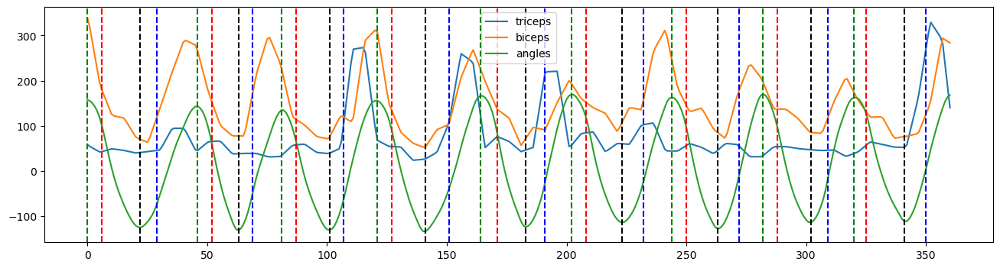

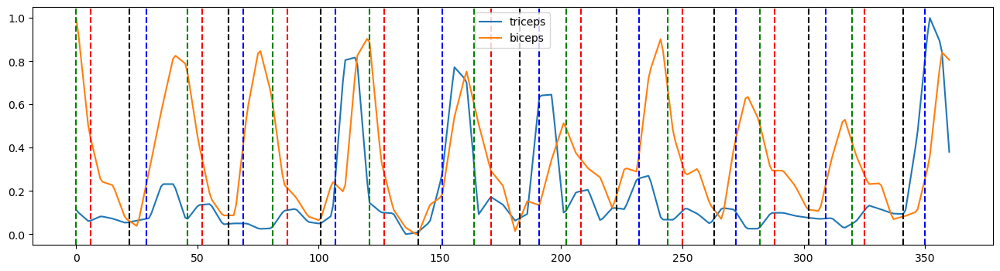

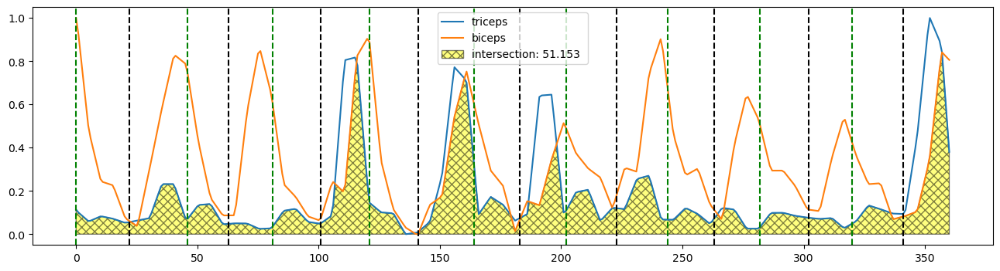

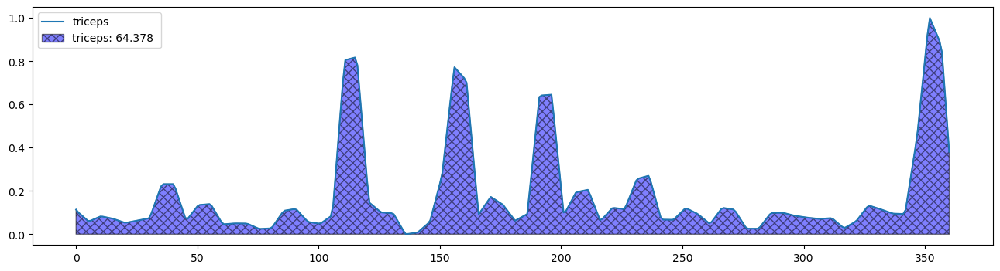

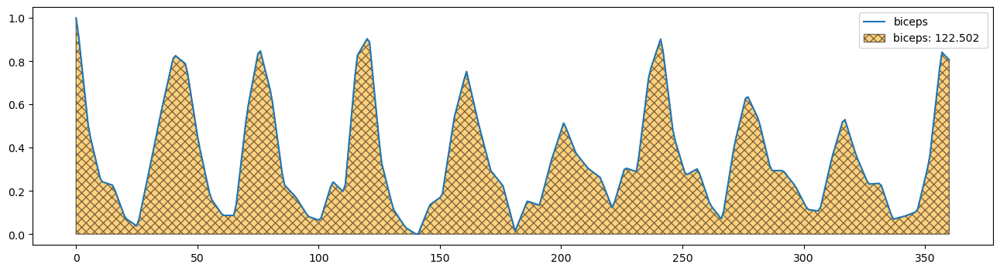

In [51]:

puntoCorteFlex, puntoCorteExt, segSpdInv, flexPeaks, extPeaks = cortesAngles2(segmentosExtTemp, segmentosFlexTemp, segmentosSpdExtTemp, segmentosSpdFlexTemp)

#for i in range(len(flexPeaks)):
        #flexPeaks[i] += 20


plt.figure(figsize=[16,4])
plt.plot(tricepsEMGad,label= 'triceps')
plt.plot(bicepsEMGad,label= 'biceps') 
plt.plot(csvangles, label ='angles')
plt.legend()

for peak in peaks:
    plt.axvline(peak, linestyle = '--', color = "g")
    
for peak in invPeaks:
    plt.axvline(peak, linestyle = '--', color = "black")
index=0

#print(len(peaks))
#print(len(extPeaks))

plt.axvline(extPeaks[0], linestyle = '--', color = "r")
for peak in extPeaks:
    if(index<len(peaks)):
        plt.axvline(peak+peaks[index], linestyle = '--', color = "r")
    
    index=index+1
index=0    
for peak in flexPeaks:

    plt.axvline(invPeaks[index]+peak, linestyle = '--', color = "b")
    
    index=index+1      
plt.figure(figsize=[16,4])
plt.plot(tricepsEMGadTempNorm,label= 'triceps')
plt.plot(bicepsEMGadTempNorm,label= 'biceps') 
plt.legend()
for peak in peaks:
    plt.axvline(peak, linestyle = '--', color = "g")
index=0
for peak in extPeaks:
    
    if(index<len(peaks)):
        plt.axvline(peak+peaks[index], linestyle = '--', color = "r")
    
    index=index+1
index=0    
for peak in invPeaks:
    plt.axvline(peak, linestyle = '--', color = "black")
for peak in flexPeaks:

    plt.axvline(invPeaks[index]+peak, linestyle = '--', color = "b")
    
    index=index+1        
#print("heyo")    
cortesFlexRMStrc, cortesExtRMStrc, cortesFlexRMSbic, cortesExtRMSbic=cortesRMS(flexPeaks, extPeaks,segmentosExtRMStrcTemp, segmentosFlexRMStrcTemp, segmentosExtRMSbicTemp, segmentosFlexRMSbicTemp)

#print(len(flexPeaks))
#print(len(invPeaks))
#print("--------")
#print(len(extPeaks))
#print(len(peaks))
#print("--------")

plt.figure(figsize=[16,4])
plt.plot(tricepsEMGadTempNorm,label= 'triceps')
plt.plot(bicepsEMGadTempNorm,label= 'biceps') 

for peak in peaks:
    plt.axvline(peak, linestyle = '--', color = "g")
for peak in invPeaks:
    plt.axvline(peak, linestyle = '--', color = "black")
ys = []
x = np.arange(0,len(tricepsEMGadTempNorm),1)
ys.append(tricepsEMGadTempNorm)
ys.append(bicepsEMGadTempNorm)
y_intersection = np.amin(ys, axis=0)
area = np.trapz(y_intersection, x)
fill_poly = plt.fill_between(x, 0, y_intersection, fc='yellow', ec='black', alpha=0.5,
                             label=f'intersection: {area:.3f} ')
fill_poly.set_hatch('xxx')
#print(area)
plt.legend()

plt.figure(figsize=[16,4])
plt.plot(tricepsEMGadTempNorm,label= 'triceps')
ys = []
x = np.arange(0,len(tricepsEMGadTempNorm),1)

area = np.trapz(tricepsEMGadTempNorm, x)
fill_poly = plt.fill_between(x, 0, tricepsEMGadTempNorm, fc='blue', ec='black', alpha=0.5,
                             label=f'triceps: {area:.3f} ')
fill_poly.set_hatch('xxx')
#print(area)
plt.legend()

plt.figure(figsize=[16,4])
plt.plot(bicepsEMGadTempNorm,label= 'biceps')
ys = []
x = np.arange(0,len(bicepsEMGadTempNorm),1)

area = np.trapz(bicepsEMGadTempNorm, x)
fill_poly = plt.fill_between(x, 0, bicepsEMGadTempNorm, fc='orange', ec='black', alpha=0.5,
                             label=f'biceps: {area:.3f} ')
fill_poly.set_hatch('xxx')
#print(area)
plt.legend()

#print(len(peaks))
#print(len(invPeaks))

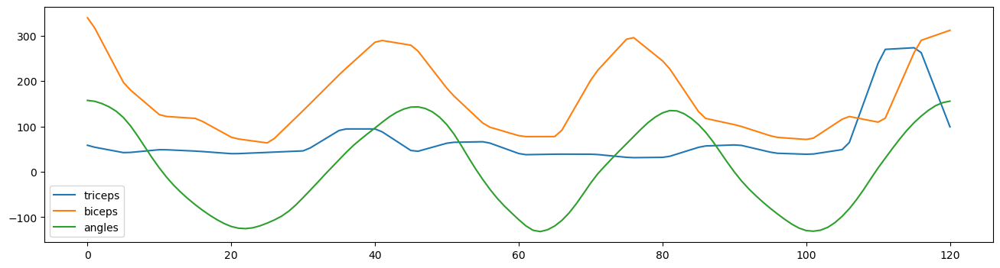

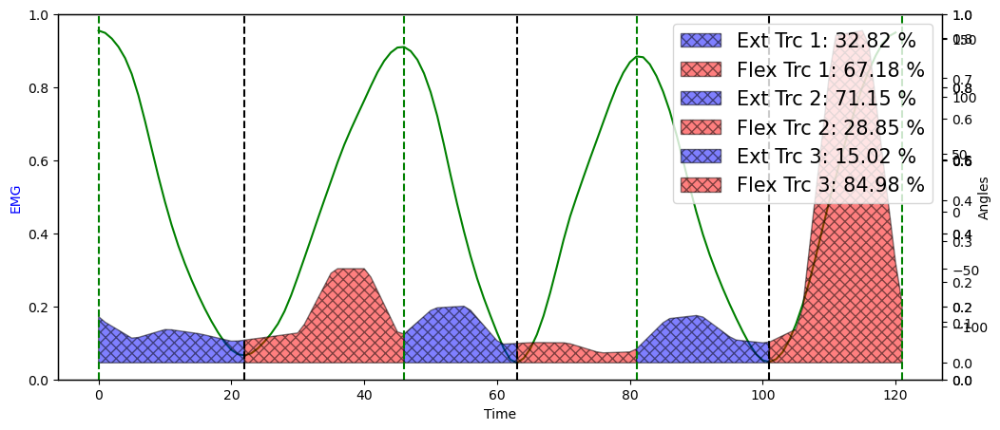

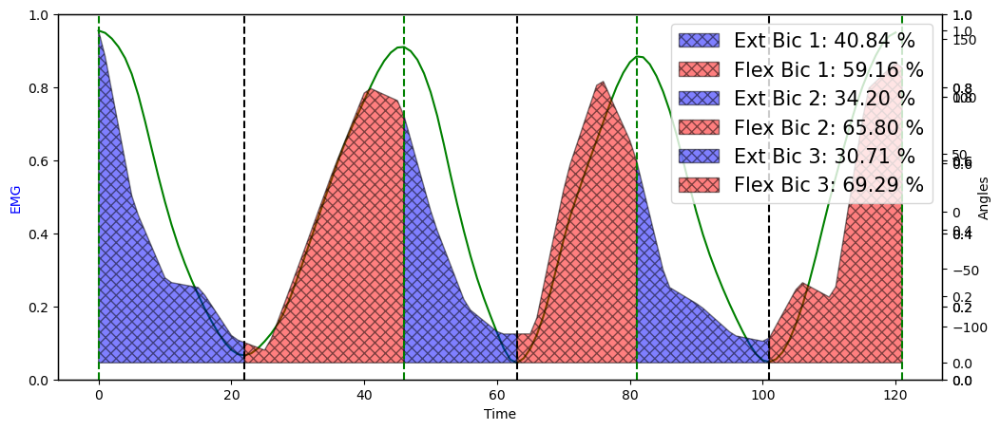

In [52]:
newpeaks, properties = sig.find_peaks(x = csvangles, height = 45, distance= 20)
newpeaks= newpeaks[0:3]
invPeaks2=invPeaks[0:3]
plt.figure(figsize=[16,4])

plt.plot(tricepsEMGad[0:newpeaks[2]],label= 'triceps')
plt.plot(bicepsEMGad[0:newpeaks[2]],label= 'biceps') 
plt.plot(csvangles[0:newpeaks[2]], label ='angles')
plt.legend()


fig, ax = plt.subplots(figsize = [12,5])
axes = [ax, ax.twinx()]


#ax.plot(tricepsEMGad[0:newpeaks[2]])
ax.set_ylabel('EMG', color = 'Blue')
ax.tick_params(axis='y')
ax.twinx().plot(csvangles[0:newpeaks[2]], color = 'Green', label ='Angle')
ax.twinx().set_ylabel('Angles')
ax.twinx().tick_params(axis='y')

axes[0].set_xlabel('Time')
ys = []
x = np.arange(0,len(tricepsEMGadTempNorm[0:invPeaks2[0]+1]),1)

area1 = np.trapz(tricepsEMGadTempNorm[0:invPeaks2[0]+1], x)
x = np.arange(invPeaks2[0],newpeaks[0]+1,1)
area2 = np.trapz(tricepsEMGadTempNorm[invPeaks2[0]:newpeaks[0]+1], x)
x = np.arange(0,len(tricepsEMGadTempNorm[0:invPeaks2[0]+1]),1)
area3=area1+area2
area=(area1/area3)*100

fill_poly = plt.fill_between(x, 0, tricepsEMGadTempNorm[0:invPeaks2[0]+1], fc='blue', ec='black', alpha=0.5,
                             label=f'Ext Trc 1: {area:.2f} %')
fill_poly.set_hatch('xxx')

ys = []


area1 = np.trapz(tricepsEMGadTempNorm[0:invPeaks2[0]+1], x)
x = np.arange(invPeaks2[0],newpeaks[0]+1,1)
area2 = np.trapz(tricepsEMGadTempNorm[invPeaks2[0]:newpeaks[0]+1], x)
area3=area1+area2
area=(area2/area3)*100

fill_poly = plt.fill_between(x, 0, tricepsEMGadTempNorm[invPeaks2[0]:newpeaks[0]+1], fc='red', ec='black', alpha=0.5,
                             label=f'Flex Trc 1: {area:.2f} %')
fill_poly.set_hatch('xxx')


ys = []
x = np.arange(newpeaks[0],invPeaks2[1]+1,1)
x1=np.arange(newpeaks[0],invPeaks2[1]+1,1)
x2=np.arange(invPeaks2[1],newpeaks[1]+1,1)

area1 = np.trapz(tricepsEMGadTempNorm[newpeaks[0]:invPeaks2[1]+1], x1)
area2 = np.trapz(tricepsEMGadTempNorm[invPeaks2[1]:newpeaks[1]+1], x2)
area3=area1+area2
area=(area1/area3)*100


#area = np.trapz(tricepsEMGadTempNorm[newpeaks[0]:invPeaks2[1]+1], x)
fill_poly = plt.fill_between(x, 0, tricepsEMGadTempNorm[newpeaks[0]:invPeaks2[1]+1], fc='blue', ec='black', alpha=0.5,
                             label=f'Ext Trc 2: {area:.2f} %')
fill_poly.set_hatch('xxx')

ys = []
x = np.arange(invPeaks2[1],newpeaks[1]+1,1)

area1 = np.trapz(tricepsEMGadTempNorm[newpeaks[0]:invPeaks2[1]+1], x1)
area2 = np.trapz(tricepsEMGadTempNorm[invPeaks2[1]:newpeaks[1]+1], x2)
area3=area1+area2
area=(area2/area3)*100

#area = np.trapz(tricepsEMGadTempNorm[invPeaks2[1]:newpeaks[1]+1], x)
fill_poly = plt.fill_between(x, 0, tricepsEMGadTempNorm[invPeaks2[1]:newpeaks[1]+1], fc='red', ec='black', alpha=0.5,
                             label=f'Flex Trc 2: {area:.2f} %')
fill_poly.set_hatch('xxx')



ys = []
x = np.arange(newpeaks[1],invPeaks2[2]+1,1)

x1=np.arange(newpeaks[1],invPeaks2[2]+1,1)
x2 = np.arange(invPeaks2[2],newpeaks[2]+1,1)

area1 = np.trapz(tricepsEMGadTempNorm[newpeaks[1]:invPeaks2[2]+1], x1)
area2 = np.trapz(tricepsEMGadTempNorm[invPeaks2[2]:newpeaks[2]+1], x2)
area3=area1+area2
area=(area1/area3)*100

#area = np.trapz(tricepsEMGadTempNorm[newpeaks[1]:invPeaks2[2]+1], x)
fill_poly = plt.fill_between(x, 0, tricepsEMGadTempNorm[newpeaks[1]:invPeaks2[2]+1], fc='blue', ec='black', alpha=0.5,
                             label=f'Ext Trc 3: {area:.2f} %')
fill_poly.set_hatch('xxx')

ys = []
x = np.arange(invPeaks2[2],newpeaks[2]+1,1)
area1 = np.trapz(tricepsEMGadTempNorm[newpeaks[1]:invPeaks2[2]+1], x1)
area2 = np.trapz(tricepsEMGadTempNorm[invPeaks2[2]:newpeaks[2]+1], x2)
area3=area1+area2
area=(area2/area3)*100

#area = np.trapz(tricepsEMGadTempNorm[invPeaks2[2]:newpeaks[2]+1], x)

fill_poly = plt.fill_between(x, 0, tricepsEMGadTempNorm[invPeaks2[2]:newpeaks[2]+1], fc='red', ec='black', alpha=0.5,
                             label=f'Flex Trc 3: {area:.2f} %')
fill_poly.set_hatch('xxx')


plt.legend(fontsize=15, loc='upper right')


for peak in invPeaks2:
    plt.axvline(peak, linestyle = '--', color = "black")

for peak in newpeaks:
    plt.axvline(peak, linestyle = '--', color = "g")   
plt.axvline(0, linestyle = '--', color = "g")   




fig, ax = plt.subplots(figsize = [12,5])
axes = [ax, ax.twinx()]


#ax.plot(tricepsEMGad[0:newpeaks[2]])
ax.set_ylabel('EMG', color = 'Blue')
ax.tick_params(axis='y')
ax.twinx().plot(csvangles[0:newpeaks[2]], color = 'Green', label ='Angle')
ax.twinx().set_ylabel('Angles')
ax.twinx().tick_params(axis='y')

axes[0].set_xlabel('Time')
ys = []
x = np.arange(0,len(bicepsEMGadTempNorm[0:invPeaks2[0]+1]),1)

area1 = np.trapz(bicepsEMGadTempNorm[0:invPeaks2[0]+1], x)
x = np.arange(invPeaks2[0],newpeaks[0]+1,1)
area2 = np.trapz(bicepsEMGadTempNorm[invPeaks2[0]:newpeaks[0]+1], x)
x = np.arange(0,len(bicepsEMGadTempNorm[0:invPeaks2[0]+1]),1)
area3=area1+area2
area=(area1/area3)*100

fill_poly = plt.fill_between(x, 0, bicepsEMGadTempNorm[0:invPeaks2[0]+1], fc='blue', ec='black', alpha=0.5,
                             label=f'Ext Bic 1: {area:.2f} %')
fill_poly.set_hatch('xxx')

ys = []


area1 = np.trapz(bicepsEMGadTempNorm[0:invPeaks2[0]+1], x)
x = np.arange(invPeaks2[0],newpeaks[0]+1,1)
area2 = np.trapz(bicepsEMGadTempNorm[invPeaks2[0]:newpeaks[0]+1], x)
area3=area1+area2
area=(area2/area3)*100

fill_poly = plt.fill_between(x, 0, bicepsEMGadTempNorm[invPeaks2[0]:newpeaks[0]+1], fc='red', ec='black', alpha=0.5,
                             label=f'Flex Bic 1: {area:.2f} %')
fill_poly.set_hatch('xxx')


ys = []
x = np.arange(newpeaks[0],invPeaks2[1]+1,1)
x1=np.arange(newpeaks[0],invPeaks2[1]+1,1)
x2=np.arange(invPeaks2[1],newpeaks[1]+1,1)

area1 = np.trapz(bicepsEMGadTempNorm[newpeaks[0]:invPeaks2[1]+1], x1)
area2 = np.trapz(bicepsEMGadTempNorm[invPeaks2[1]:newpeaks[1]+1], x2)
area3=area1+area2
area=(area1/area3)*100


#area = np.trapz(tricepsEMGadTempNorm[newpeaks[0]:invPeaks2[1]+1], x)
fill_poly = plt.fill_between(x, 0, bicepsEMGadTempNorm[newpeaks[0]:invPeaks2[1]+1], fc='blue', ec='black', alpha=0.5,
                              label=f'Ext Bic 2: {area:.2f} %')
fill_poly.set_hatch('xxx')

ys = []
x = np.arange(invPeaks2[1],newpeaks[1]+1,1)

area1 = np.trapz(bicepsEMGadTempNorm[newpeaks[0]:invPeaks2[1]+1], x1)
area2 = np.trapz(bicepsEMGadTempNorm[invPeaks2[1]:newpeaks[1]+1], x2)
area3=area1+area2
area=(area2/area3)*100

#area = np.trapz(tricepsEMGadTempNorm[invPeaks2[1]:newpeaks[1]+1], x)
fill_poly = plt.fill_between(x, 0, bicepsEMGadTempNorm[invPeaks2[1]:newpeaks[1]+1], fc='red', ec='black', alpha=0.5,
                             label=f'Flex Bic 2: {area:.2f} %')
fill_poly.set_hatch('xxx')

plt.legend(fontsize=15, loc='lower left')

ys = []
x = np.arange(newpeaks[1],invPeaks2[2]+1,1)

x1=np.arange(newpeaks[1],invPeaks2[2]+1,1)
x2 = np.arange(invPeaks2[2],newpeaks[2]+1,1)

area1 = np.trapz(bicepsEMGadTempNorm[newpeaks[1]:invPeaks2[2]+1], x1)
area2 = np.trapz(bicepsEMGadTempNorm[invPeaks2[2]:newpeaks[2]+1], x2)
area3=area1+area2
area=(area1/area3)*100

#area = np.trapz(tricepsEMGadTempNorm[newpeaks[1]:invPeaks2[2]+1], x)
fill_poly = plt.fill_between(x, 0, bicepsEMGadTempNorm[newpeaks[1]:invPeaks2[2]+1], fc='blue', ec='black', alpha=0.5,
                             label=f'Ext Bic 3: {area:.2f} %')
fill_poly.set_hatch('xxx')

ys = []
x = np.arange(invPeaks2[2],newpeaks[2]+1,1)
area1 = np.trapz(bicepsEMGadTempNorm[newpeaks[1]:invPeaks2[2]+1], x1)
area2 = np.trapz(bicepsEMGadTempNorm[invPeaks2[2]:newpeaks[2]+1], x2)
area3=area1+area2
area=(area2/area3)*100

#area = np.trapz(tricepsEMGadTempNorm[invPeaks2[2]:newpeaks[2]+1], x)

fill_poly = plt.fill_between(x, 0, bicepsEMGadTempNorm[invPeaks2[2]:newpeaks[2]+1], fc='red', ec='black', alpha=0.5,
                             label=f'Flex Bic 3: {area:.2f} %')
fill_poly.set_hatch('xxx')




for peak in invPeaks2:
    plt.axvline(peak, linestyle = '--', color = "black")

for peak in newpeaks:
    plt.axvline(peak, linestyle = '--', color = "g")   
plt.axvline(0, linestyle = '--', color = "g")   

plt.legend(fontsize=15, loc='upper right')



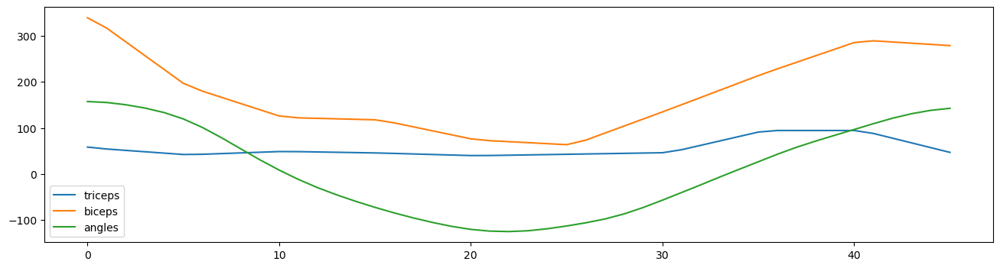

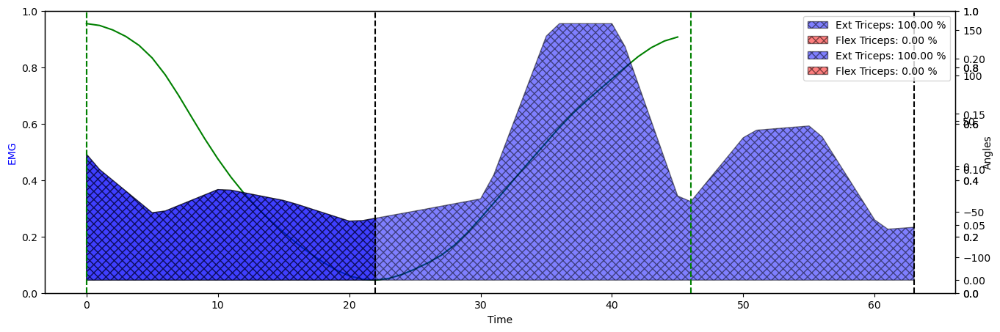

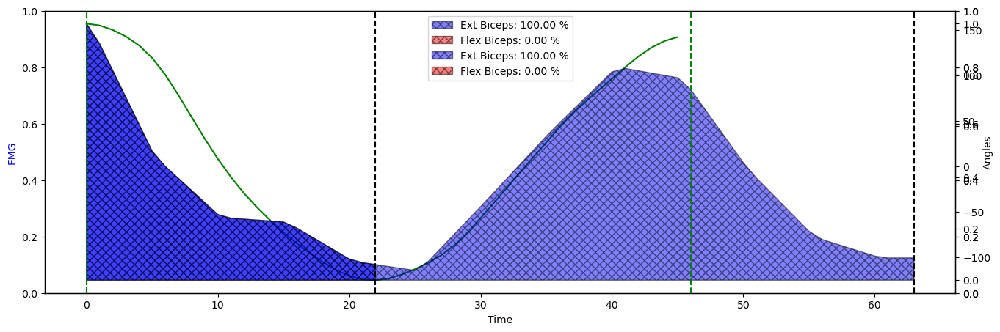

In [53]:
new_peaks, _ = sig.find_peaks(csvangles, height=45, distance=25)

if len(new_peaks) > 1:
    # Compute the average distance between peaks (excluding first)
    avg_distance = np.mean(np.diff(new_peaks[1:]))

    # Check if the first peak is too close to index 0
    if new_peaks[0] < avg_distance * 0.5:
        new_peaks = new_peaks[1:]  # Remove the first peak

# Ensure the first peak is at index 0
if 0 not in new_peaks:
    new_peaks = np.insert(new_peaks, 0, 0)
# last_index = len(csvangles) - 1
# if last_index not in peaks:
#     peaks = np.append(peaks, last_index)  
newpeaks= new_peaks[0:2]
invPeaks2=invPeaks[0:2]
plt.figure(figsize=[16,4])

plt.plot(tricepsEMGad[0:newpeaks[1]],label= 'triceps')
plt.plot(bicepsEMGad[0:newpeaks[1]],label= 'biceps') 
plt.plot(csvangles[0:newpeaks[1]], label ='angles')
plt.legend()


fig, ax = plt.subplots(figsize = [16,5])
axes = [ax, ax.twinx()]


#ax.plot(tricepsEMGad[0:newpeaks[2]])
ax.set_ylabel('EMG', color = 'Blue')
ax.tick_params(axis='y')
ax.twinx().plot(csvangles[0:newpeaks[1]], color = 'Green', label ='Angle')
ax.twinx().set_ylabel('Angles')
ax.twinx().tick_params(axis='y')

axes[0].set_xlabel('Time')
ys = []
x = np.arange(0,len(tricepsEMGadTempNorm[0:invPeaks2[0]+1]),1)

area1 = np.trapz(tricepsEMGadTempNorm[0:invPeaks2[0]+1], x)
x = np.arange(invPeaks2[0],newpeaks[0]+1,1)
area2 = np.trapz(tricepsEMGadTempNorm[invPeaks2[0]:newpeaks[0]+1], x)
x = np.arange(0,len(tricepsEMGadTempNorm[0:invPeaks2[0]+1]),1)
area3=area1+area2
area=(area1/area3)*100

fill_poly = plt.fill_between(x, 0, tricepsEMGadTempNorm[0:invPeaks2[0]+1], fc='blue', ec='black', alpha=0.5,
                             label=f'Ext Triceps: {area:.2f} %')
fill_poly.set_hatch('xxx')

ys = []


area1 = np.trapz(tricepsEMGadTempNorm[0:invPeaks2[0]+1], x)
x = np.arange(invPeaks2[0],newpeaks[0]+1,1)
area2 = np.trapz(tricepsEMGadTempNorm[invPeaks2[0]:newpeaks[0]+1], x)
area3=area1+area2
area=(area2/area3)*100

fill_poly = plt.fill_between(x, 0, tricepsEMGadTempNorm[invPeaks2[0]:newpeaks[0]+1], fc='red', ec='black', alpha=0.5,
                             label=f'Flex Triceps: {area:.2f} %')
fill_poly.set_hatch('xxx')


ys = []
x = np.arange(newpeaks[0],invPeaks2[1]+1,1)
x1=np.arange(newpeaks[0],invPeaks2[1]+1,1)
x2=np.arange(invPeaks2[1],newpeaks[1]+1,1)

area1 = np.trapz(tricepsEMGadTempNorm[newpeaks[0]:invPeaks2[1]+1], x1)
area2 = np.trapz(tricepsEMGadTempNorm[invPeaks2[1]:newpeaks[1]+1], x2)
area3=area1+area2
area=(area1/area3)*100


#area = np.trapz(tricepsEMGadTempNorm[newpeaks[0]:invPeaks2[1]+1], x)
fill_poly = plt.fill_between(x, 0, tricepsEMGadTempNorm[newpeaks[0]:invPeaks2[1]+1], fc='blue', ec='black', alpha=0.5,
                             label=f'Ext Triceps: {area:.2f} %')
fill_poly.set_hatch('xxx')

ys = []
x = np.arange(invPeaks2[1],newpeaks[1]+1,1)

area1 = np.trapz(tricepsEMGadTempNorm[newpeaks[0]:invPeaks2[1]+1], x1)
area2 = np.trapz(tricepsEMGadTempNorm[invPeaks2[1]:newpeaks[1]+1], x2)
area3=area1+area2
area=(area2/area3)*100

#area = np.trapz(tricepsEMGadTempNorm[invPeaks2[1]:newpeaks[1]+1], x)
fill_poly = plt.fill_between(x, 0, tricepsEMGadTempNorm[invPeaks2[1]:newpeaks[1]+1], fc='red', ec='black', alpha=0.5,
                             label=f'Flex Triceps: {area:.2f} %')
fill_poly.set_hatch('xxx')




for peak in invPeaks2:
    plt.axvline(peak, linestyle = '--', color = "black")

for peak in newpeaks:
    plt.axvline(peak, linestyle = '--', color = "g")   
plt.axvline(0, linestyle = '--', color = "g")   

plt.legend()


fig, ax = plt.subplots(figsize = [16,5])
axes = [ax, ax.twinx()]


#ax.plot(tricepsEMGad[0:newpeaks[2]])
ax.set_ylabel('EMG', color = 'Blue')
ax.tick_params(axis='y')
ax.twinx().plot(csvangles[0:newpeaks[1]], color = 'Green', label ='Angle')
ax.twinx().set_ylabel('Angles')
ax.twinx().tick_params(axis='y')

axes[0].set_xlabel('Time')
ys = []
x = np.arange(0,len(bicepsEMGadTempNorm[0:invPeaks2[0]+1]),1)

area1 = np.trapz(bicepsEMGadTempNorm[0:invPeaks2[0]+1], x)
x = np.arange(invPeaks2[0],newpeaks[0]+1,1)
area2 = np.trapz(bicepsEMGadTempNorm[invPeaks2[0]:newpeaks[0]+1], x)
x = np.arange(0,len(bicepsEMGadTempNorm[0:invPeaks2[0]+1]),1)
area3=area1+area2
area=(area1/area3)*100

fill_poly = plt.fill_between(x, 0, bicepsEMGadTempNorm[0:invPeaks2[0]+1], fc='blue', ec='black', alpha=0.5,
                             label=f'Ext Biceps: {area:.2f} %')
fill_poly.set_hatch('xxx')

ys = []


area1 = np.trapz(bicepsEMGadTempNorm[0:invPeaks2[0]+1], x)
x = np.arange(invPeaks2[0],newpeaks[0]+1,1)
area2 = np.trapz(bicepsEMGadTempNorm[invPeaks2[0]:newpeaks[0]+1], x)
area3=area1+area2
area=(area2/area3)*100

fill_poly = plt.fill_between(x, 0, bicepsEMGadTempNorm[invPeaks2[0]:newpeaks[0]+1], fc='red', ec='black', alpha=0.5,
                             label=f'Flex Biceps: {area:.2f} %')
fill_poly.set_hatch('xxx')


ys = []
x = np.arange(newpeaks[0],invPeaks2[1]+1,1)
x1=np.arange(newpeaks[0],invPeaks2[1]+1,1)
x2=np.arange(invPeaks2[1],newpeaks[1]+1,1)

area1 = np.trapz(bicepsEMGadTempNorm[newpeaks[0]:invPeaks2[1]+1], x1)
area2 = np.trapz(bicepsEMGadTempNorm[invPeaks2[1]:newpeaks[1]+1], x2)
area3=area1+area2
area=(area1/area3)*100


#area = np.trapz(tricepsEMGadTempNorm[newpeaks[0]:invPeaks2[1]+1], x)
fill_poly = plt.fill_between(x, 0, bicepsEMGadTempNorm[newpeaks[0]:invPeaks2[1]+1], fc='blue', ec='black', alpha=0.5,
                              label=f'Ext Biceps: {area:.2f} %')
fill_poly.set_hatch('xxx')

ys = []
x = np.arange(invPeaks2[1],newpeaks[1]+1,1)

area1 = np.trapz(bicepsEMGadTempNorm[newpeaks[0]:invPeaks2[1]+1], x1)
area2 = np.trapz(bicepsEMGadTempNorm[invPeaks2[1]:newpeaks[1]+1], x2)
area3=area1+area2
area=(area2/area3)*100

#area = np.trapz(tricepsEMGadTempNorm[invPeaks2[1]:newpeaks[1]+1], x)
fill_poly = plt.fill_between(x, 0, bicepsEMGadTempNorm[invPeaks2[1]:newpeaks[1]+1], fc='red', ec='black', alpha=0.5,
                             label=f'Flex Biceps: {area:.2f} %')
fill_poly.set_hatch('xxx')







for peak in invPeaks2:
    plt.axvline(peak, linestyle = '--', color = "black")

for peak in newpeaks:
    plt.axvline(peak, linestyle = '--', color = "g")   
plt.axvline(0, linestyle = '--', color = "g")   

plt.legend()

In [54]:
def segmentacionRMS(tricepsEMGadTempNorm, bicepsEMGadTempNorm, peaks, invPeaks):
    print("wapp")
    print(peaks)
    print(invPeaks)
    segmentosFlexTriceps = []
    segmentosFlexBiceps = []
    
    segmentosExtTriceps = []
    segmentosExtBiceps = []
    
     
    
    for i in range(0, len(peaks)-1,1):
        
        segmentoExtT= tricepsEMGadTempNorm[peaks[i]:invPeaks[i]]
        segmentosExtTriceps.append(segmentoExtT)
        segmentoExtB= bicepsEMGadTempNorm[peaks[i]:invPeaks[i]]
        segmentosExtBiceps.append(segmentoExtB)

        segmentoFlexT = tricepsEMGadTempNorm[invPeaks[i]:peaks[i+1]]
        segmentosFlexTriceps.append(segmentoFlexT)
        segmentoFlexB = bicepsEMGadTempNorm[invPeaks[i]:peaks[i+1]]
        segmentosFlexBiceps.append(segmentoFlexB)
        
    maxindex=len(peaks)-1     
    segmentoExtT = tricepsEMGadTempNorm[peaks[maxindex]:invPeaks[maxindex]]
    segmentosExtTriceps.append(segmentoExtT)
    segmentoExtB = bicepsEMGadTempNorm[peaks[maxindex]:invPeaks[maxindex]]
    segmentosExtBiceps.append(segmentoExtB)    

    segmentoFlexT = tricepsEMGadTempNorm[invPeaks[maxindex]:-1]
    segmentosFlexTriceps.append(segmentoFlexT)
    segmentoFlexB = bicepsEMGadTempNorm[invPeaks[maxindex]:-1]
    segmentosFlexBiceps.append(segmentoFlexB)
    
    return segmentosFlexTriceps, segmentosFlexBiceps, segmentosExtTriceps, segmentosExtBiceps

wapp
[  0  46  81 121 164 202 244 282 320]
[ 22  63 101 141 183 223 263 302 341]


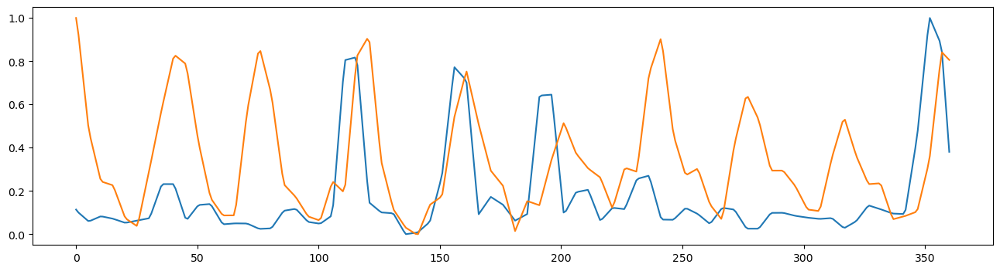

<Figure size 1600x400 with 0 Axes>

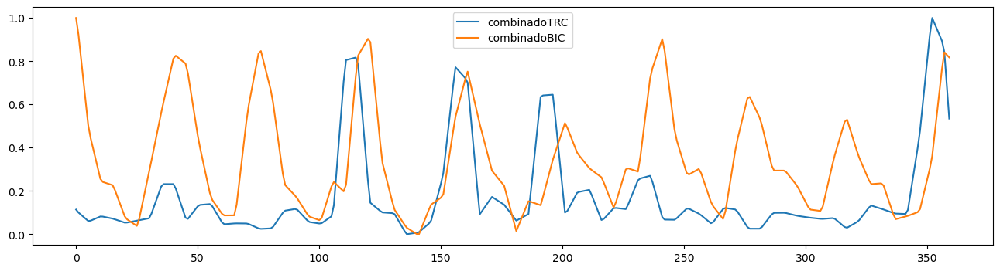

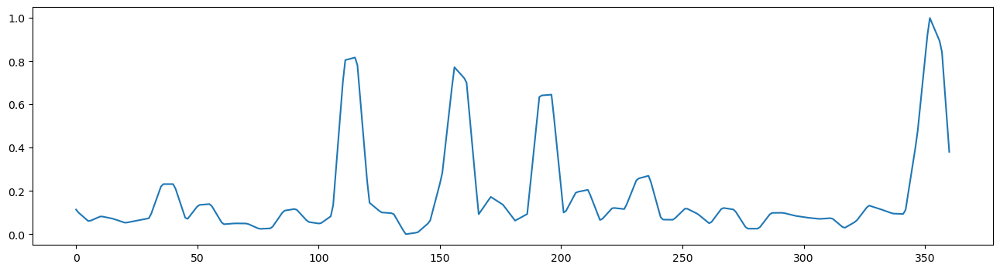

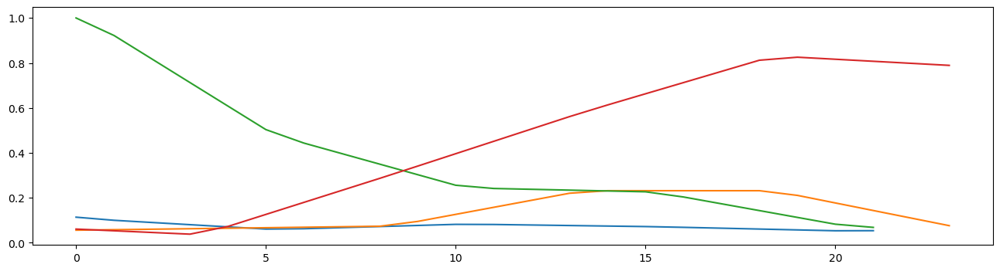

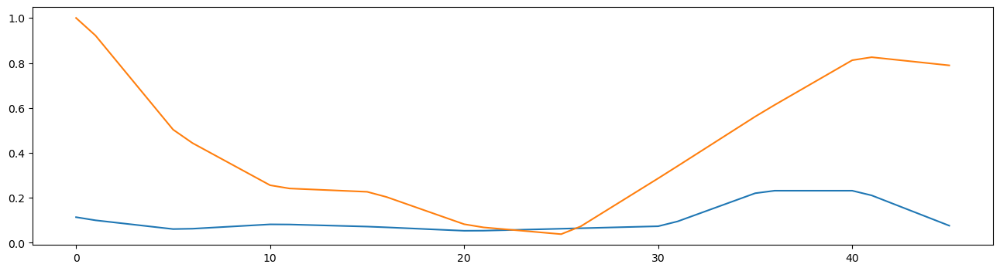

In [55]:

#Obtiene los segmentos por fase (ya normalizados)
segmentosFlexTriceps, segmentosFlexBiceps, segmentosExtTriceps, segmentosExtBiceps = segmentacionRMS(tricepsEMGadTempNorm, bicepsEMGadTempNorm, peaks, invPeaks)
#segmentosFlexTriceps.pop(0)
#segmentosFlexBiceps.pop(0)

#Combinar segmentos Ext + Flex por ciclo
combinadoRMStrcTemp=[]
combinadoRMSbicTemp=[]

combinadoRMStrcTemp2=[]
combinadoRMSbicTemp2=[]

for i in range (0, len(segmentosFlexTriceps), 1):#Agrupa pares de segmentos y los aplana con itertools.chain
    combinadoRMStrcTemp2 = combinadoRMStrcTemp2 + (segmentosExtTriceps[i]+segmentosFlexTriceps[i]) #concatena primero la fase de extensión y luego la de flexión
    combinadoRMSbicTemp2=combinadoRMSbicTemp2 + (segmentosExtBiceps[i]+segmentosFlexBiceps[i])
    

#Junta todos los ciclos completos en una sola lista larga
arr_result1 = [[a, b] for a, b in zip(segmentosFlexTriceps, segmentosExtTriceps)]
arr_result2 = [[a, b] for a, b in zip(segmentosFlexBiceps, segmentosExtBiceps)]

#print(segmentosFlexTriceps)
#print("--------------------------")
from itertools import chain
for i in range (0, len(arr_result1),1):
    combinadoRMStrcTemp.append(list(chain.from_iterable(arr_result1[i])))
    combinadoRMSbicTemp.append(list(chain.from_iterable(arr_result2[i])))

#print(combinadoRMStrcTemp[0])

combinadoRMStrcTemp= list(chain.from_iterable(combinadoRMStrcTemp))
combinadoRMSbicTemp= list(chain.from_iterable(combinadoRMSbicTemp))
#print("--------------------------")
#print(combinadoRMStrcTemp)

plt.figure(figsize=[16,4])
plt.plot(tricepsEMGadTempNorm,label= 'triceps')
plt.plot(bicepsEMGadTempNorm,label= 'biceps') 
plt.figure(figsize=[16,4])
##plt.plot(combinadoRMStrcTemp,label= 'combinadoTRC')
##plt.plot(combinadoRMSbicTemp,label= 'combinadoBIC')
#print(len(tricepsEMGadTempNorm))
#print(len(combinadoRMStrcTemp2))
plt.figure(figsize=[16,4])
plt.plot(combinadoRMStrcTemp2,label= 'combinadoTRC')
plt.plot(combinadoRMSbicTemp2,label= 'combinadoBIC')
plt.legend()
plt.figure(figsize=[16,4])
plt.plot(tricepsEMGadTempNorm)
plt.figure(figsize=[16,4])
plt.plot(segmentosExtTriceps[0])
plt.plot(segmentosFlexTriceps[0])

plt.plot(segmentosExtBiceps[0])
plt.plot(segmentosFlexBiceps[0])
plt.figure(figsize=[16,4])
plt.plot(segmentosExtTriceps[0]+segmentosFlexTriceps[0])
plt.plot(segmentosExtBiceps[0]+segmentosFlexBiceps[0])

In [56]:
for i in range (0, len(combinadoRMStrcTemp2), 1):
    if (combinadoRMStrcTemp2[i]!=tricepsEMGadTempNorm[i]):
        print("error")
        print(i)
        print("-----")
        print(combinadoRMStrcTemp2[i-1])
        print(tricepsEMGadTempNorm[i-1])
        print("-----")
        print(combinadoRMStrcTemp2[i])
        print(tricepsEMGadTempNorm[i])
        print("----")
        print(combinadoRMStrcTemp2[i+1])
        print(tricepsEMGadTempNorm[i+1])
        print("-----")
        print(combinadoRMStrcTemp2[i+2])
        print(tricepsEMGadTempNorm[i+2])
        break

In [57]:
def normalizacionPicoSesion (segmentosExtRMStrcTemp, segmentosFlexRMStrcTemp, segmentosExtRMSbicTemp, segmentosFlexRMSbicTemp):
    t_max = 1
    t_min = 0
    diff = t_max - t_min
    diff_arr = 0
    maxValAngle=0
    minValAngle = 0
    segmentosExtRMStrcTempNorm = []
    segmentosFlexRMStrcTempNorm = []
    segmentosExtRMSbicTempNorm = []
    segmentosFlexRMSbicTempNorm = []
    
    for segmento in segmentosExtRMStrcTemp:
        if (max(segmento)>maxValAngle):
            maxValAngle = max(segmento)
    for segmento in segmentosExtRMStrcTemp:
        if (min(segmento)<minValAngle):
            minValAngle = min(segmento)
            
            

    for segmento in segmentosExtRMStrcTemp:
        normSegmento = []


        diff_arr = maxValAngle - minValAngle
        for value in segmento:
            temp = (((value - minValAngle)*diff)/diff_arr) + t_min
            normSegmento.append(temp)
        segmentosExtRMStrcTempNorm.append(normSegmento)
        
    maxValAngle=0   
    minValAngle=0
    for segmento in segmentosExtRMSbicTemp:
        if (max(segmento)>maxValAngle):
            maxValAngle = max(segmento)
            
    for segmento in segmentosExtRMSbicTemp:
        if (min(segmento)<minValAngle):
            minValAngle = min(segmento)      
            
    for segmento in segmentosExtRMSbicTemp:
        normSegmento = []
  
        diff_arr = maxValAngle - minValAngle
        for value in segmento:
            temp = (((value - minValAngle)*diff)/diff_arr) + t_min
            normSegmento.append(temp)
        segmentosExtRMSbicTempNorm.append(normSegmento) 
        
        
    maxValAngle=0   
    minValAngle=0    
    for segmento in segmentosFlexRMStrcTemp:
        if (max(segmento)>maxValAngle):
            maxValAngle = max(segmento)

    for segmento in segmentosFlexRMStrcTemp:
        if (min(segmento)<minValAngle):
            minValAngle = min(segmento)
            
    
            
    for segmento in segmentosFlexRMStrcTemp:
        normSegmento = []
    

        diff_arr = maxValAngle - minValAngle
        for value in segmento:
            temp = (((value - minValAngle)*diff)/diff_arr) + t_min
            normSegmento.append(temp)
        segmentosFlexRMStrcTempNorm.append(normSegmento)
        
    maxValAngle=0   
    minValAngle=0     
    for segmento in segmentosFlexRMSbicTemp:
        if (max(segmento)>maxValAngle):
            maxValAngle = max(segmento)
    for segmento in segmentosFlexRMSbicTemp:
        if (min(segmento)<minValAngle):
            minValAngle = min(segmento)
    for segmento in segmentosFlexRMSbicTemp:
        normSegmento = []
        
        diff_arr = maxValAngle - minValAngle
        for value in segmento:
            temp = (((value - minValAngle)*diff)/diff_arr) + t_min
            normSegmento.append(temp)
        segmentosFlexRMSbicTempNorm.append(normSegmento)   

    return segmentosExtRMStrcTempNorm, segmentosFlexRMStrcTempNorm, segmentosExtRMSbicTempNorm, segmentosFlexRMSbicTempNorm

In [58]:
def calculoArea(segmentoTrc, segmentoBic):
    
    ys = []
    x = np.arange(0,len(segmentoTrc),1)
    ys.append(segmentoTrc)
    ys.append(segmentoBic)
    y_intersection = np.amin(ys, axis=0)
    area = np.trapz(y_intersection, x)
    return area

In [59]:
def calculoAreaAlternativoAcc(segmentoTrc, segmentoBic, peak):
    
    segTrcTemp =segmentoTrc
    segTrcTemp = segTrcTemp[0:peak+1]
    segBicTemp =segmentoBic
    segBicTemp = segBicTemp[0:peak+1]

  
    ys = []
    x = np.arange(0,len(segTrcTemp),1)
    area = np.trapz(segTrcTemp, x)
    
    print(area)
    return area

In [60]:
def calculoAreaAlternativoDecc(segmentoTrc, segmentoBic, peak):
    
    segTrcTemp =segmentoTrc
    segTrcTemp = segTrcTemp[peak:-1]
    segBicTemp =segmentoBic
    segBicTemp = segBicTemp[peak:-1]

  
    ys = []
    x = np.arange(0,len(segTrcTemp),1)
    area = np.trapz(segTrcTemp, x)
    
    print(area)
    return area

In [61]:
def integralSuperposiciónFlexAcc(segmentosFlexRMStrcTemp, segmentosFlexRMSbicTemp, flexPeaks):
    
    i=0
    x_y_curve1=[]
    x_y_curve2=[]
    area=0
    areasFlexAcc=[]
    segmentosFlexTrcAcc = []
    segmentosFlexBicAcc = []
    
    print("cawen")
    #segmentosFlexRMStrcTemp.pop()
    print(len(flexPeaks))
    print(segmentosFlexRMStrcTemp)
    print(len(segmentosFlexRMStrcTemp))
    for segmento in segmentosFlexRMStrcTemp:
        #print(segmento[0:flexPeaks[i]])
        #segmentosFlexTrcAcc.append(segmento[0:flexPeaks[i]])
        i=i+1
    print("i vale")
    print(i)
    for j in range (0,(i-1),1):
        print(segmento[0:flexPeaks[j]])
        segmentosFlexTrcAcc.append(segmento[0:flexPeaks[j]])
    #segmentosFlexTrcAcc.append(segmento[flexPeaks[j]:-1])
    i=0
    
    for segmento in segmentosFlexRMSbicTemp:
        #print(segmento[0:flexPeaks[i]])
        #segmentosFlexTrcAcc.append(segmento[0:flexPeaks[i]])
        i=i+1
    for j in range (0,i-1,1):
        print(segmento[0:flexPeaks[j]])
        segmentosFlexBicAcc.append(segmento[0:flexPeaks[j]])
    #segmentosFlexBicAcc.append(segmento[flexPeaks[j]:-1])
    #segmentosFlexRMSbicTemp.pop()
    
    #for segmento in segmentosFlexRMSbicTemp:
        #print(segmento[0:flexPeaks[i]])
        #segmentosFlexBicAcc.append(segmento[0:flexPeaks[i]])
        #i=i+1
    #print(segmentosFlexTrcAcc)    
    

    for j in range (0,len(segmentosFlexRMStrcTemp)-1,1):
        area = calculoAreaAlternativoAcc(segmentosFlexRMStrcTemp[j], segmentosFlexRMSbicTemp[j],flexPeaks[j])
        print("Wilds")
        areasFlexAcc.append(area)
    
    return areasFlexAcc

In [62]:
def integralSuperposiciónFlexDecc(segmentosFlexRMStrcTemp, segmentosFlexRMSbicTemp, flexPeaks):
    
    i=0
    x_y_curve1=[]
    x_y_curve2=[]
    area=0
    areasFlexDecc=[]
    segmentosFlexTrcDecc = []
    segmentosFlexBicDecc = []
    
    i=0
    #segmentosFlexRMStrcTemp.pop()
    for segmento in segmentosFlexRMStrcTemp:
        #print(segmento[0:flexPeaks[i]])
        segmentosFlexTrcDecc.append(segmento[flexPeaks[i]:-1])
        i=i+1
    i=0
    #segmentosFlexRMSbicTemp.pop()
    for segmento in segmentosFlexRMSbicTemp:
        #print(segmento[0:flexPeaks[i]])
        segmentosFlexBicDecc.append(segmento[flexPeaks[i]:-1])
        i=i+1
    #print(segmentosFlexTrcAcc)    
    

    for j in range (0,len(segmentosFlexRMStrcTemp),1):
        area = calculoAreaAlternativoDecc(segmentosFlexRMStrcTemp[j], segmentosFlexRMSbicTemp[j],flexPeaks[j])
        print("Wilds2")
        areasFlexDecc.append(area)
    
    return areasFlexDecc

In [63]:

def integralSuperposiciónExtAcc(segmentosExtRMStrcTemp, segmentosExtRMSbicTemp, extPeaks):
    
    i=0
    x_y_curve1=[]
    x_y_curve2=[]
    area=0
    areasExtAcc=[]
    segmentosExtTrcAcc = []
    segmentosExtBicAcc = []
    
    i=0
    print(len(extPeaks))   

    print(len(segmentosExtRMStrcTemp))
    for segmento in segmentosExtRMStrcTemp:
        #print(segmento[0:flexPeaks[i]])
        segmentosExtTrcAcc.append(segmento[0:extPeaks[i]])
        i=i+1
    i=0

    for segmento in segmentosExtRMSbicTemp:
        #print(segmento[0:flexPeaks[i]])
        segmentosExtBicAcc.append(segmento[0:extPeaks[i]])
        i=i+1
    #print(segmentosFlexTrcAcc)    
    

    for j in range (0,len(segmentosExtRMStrcTemp),1):
        area = calculoArea(segmentosExtTrcAcc[j], segmentosExtBicAcc[j])
        areasExtAcc.append(area)
    
    return areasExtAcc

In [64]:

def integralSuperposiciónExtDecc(segmentosExtRMStrcTemp, segmentosExtRMSbicTemp, extPeaks):
    
    i=0
    x_y_curve1=[]
    x_y_curve2=[]
    area=0
    areasExtDecc=[]
    segmentosExtTrcDecc = []
    segmentosExtBicDecc = []
    
    i=0

    for segmento in segmentosExtRMStrcTemp:
        #print(segmento[0:flexPeaks[i]])
        segmentosExtTrcDecc.append(segmento[extPeaks[i]:-1])
        i=i+1
    i=0

    for segmento in segmentosExtRMSbicTemp:
        #print(segmento[0:flexPeaks[i]])
        segmentosExtBicDecc.append(segmento[extPeaks[i]:-1])
        i=i+1
    #print(segmentosFlexTrcAcc)    
    

    for j in range (0,len(segmentosExtRMStrcTemp),1):
        area = calculoArea(segmentosExtTrcDecc[j], segmentosExtBicDecc[j])
        areasExtDecc.append(area)
    
    return areasExtDecc

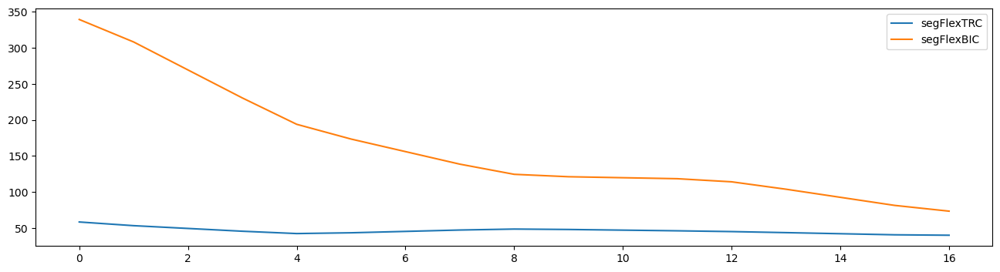

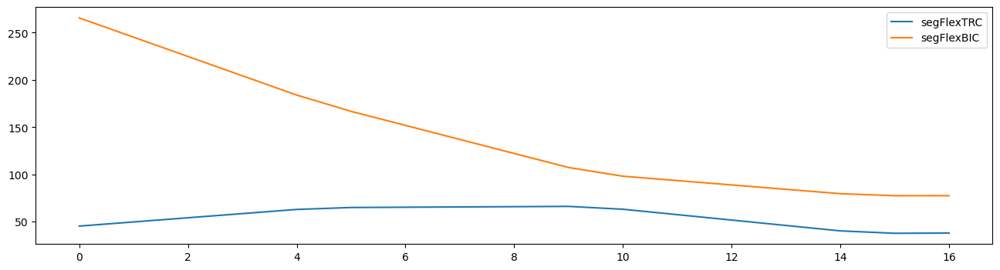

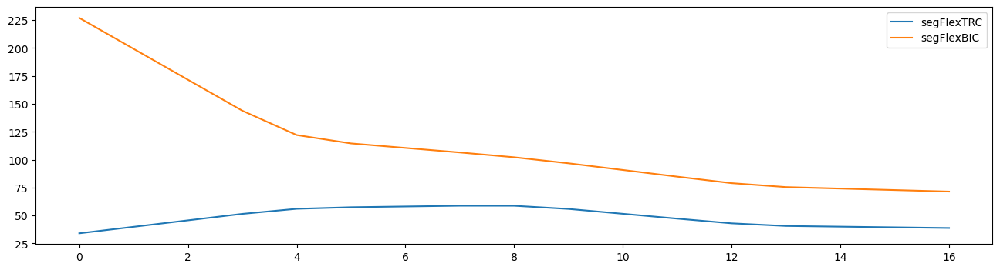

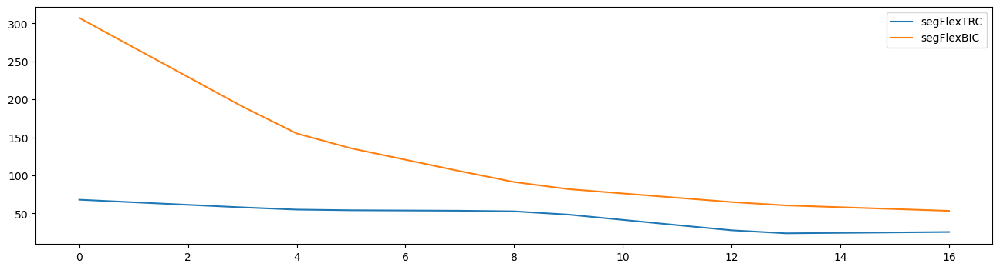

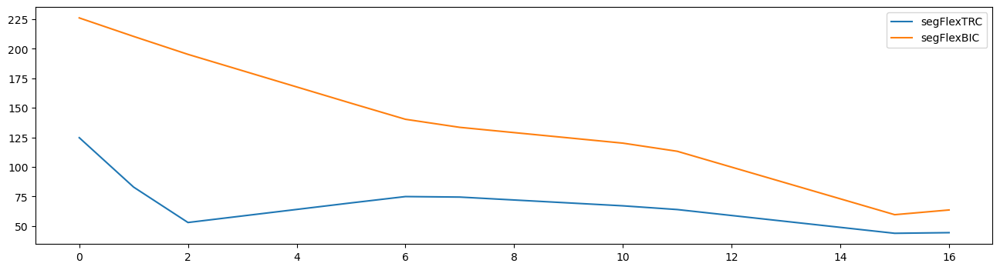

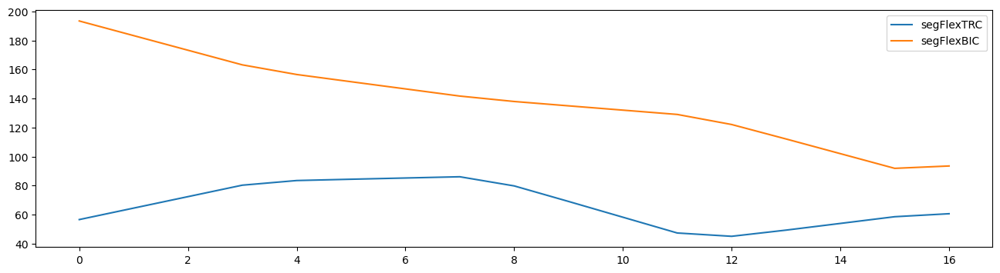

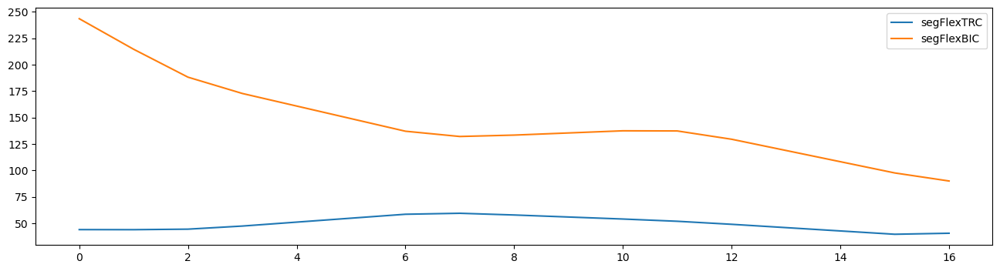

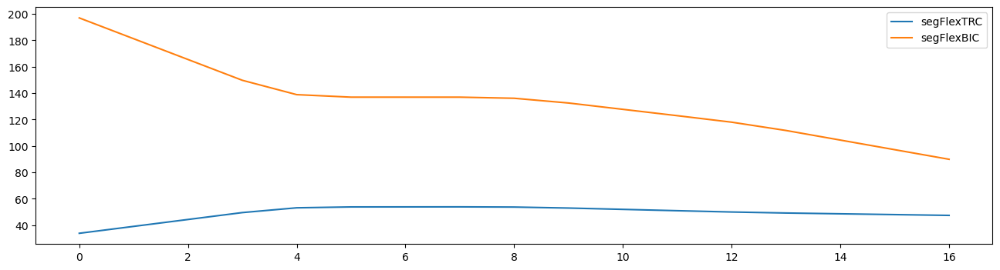

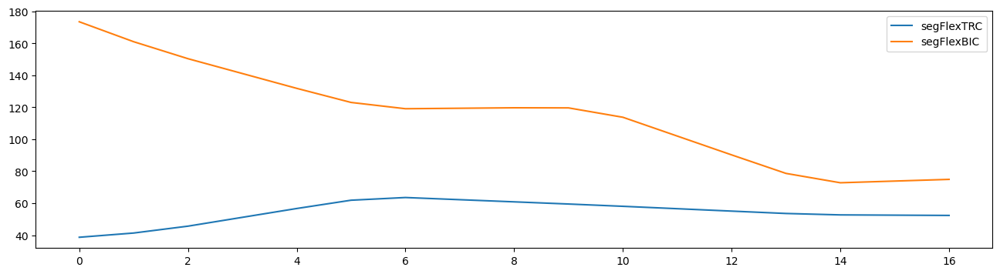

In [65]:

index = np.arange(0,len(segmentosExtRMStrcTemp),1)
for i in index:
    plt.figure(figsize=[16,4])
    plt.plot(segmentosExtRMStrcTemp[i],label= 'segFlexTRC')
    plt.plot(segmentosExtRMSbicTemp[i],label= 'segFlexBIC')
    plt.legend()


[40.7355481  41.62718779 42.51882748 43.42232136 44.33551125 45.24870114
 46.85569812 57.15880247 70.10778129 83.0567601  92.75991183 94.37696802
 94.37427425 94.37158047 88.38757336 74.70262535 60.78658113]
[0.05587076062892216, 0.05802892596494367, 0.060187091300965154, 0.06234525663698666, 0.06453917283637682, 0.06674949926813296, 0.06895982569988912, 0.07117015213164526, 0.07338047856340141, 0.09490301113111912, 0.126245309530682, 0.1575876079302449, 0.1889299063298078, 0.22027220472937026, 0.23153716990890863, 0.23153064977194185, 0.23152412963497496, 0.23151760949800818, 0.23151108936104128, 0.21069324440550288, 0.17701021683484716, 0.14332718926419147, 0.1096441616935358, 0.07596113412288054]
4.376493603086293
4.6333935738882515
7.730867017655485
cawen
9
[[0.05587076062892216, 0.05802892596494367, 0.060187091300965154, 0.06234525663698666, 0.06453917283637682, 0.06674949926813296, 0.06895982569988912, 0.07117015213164526, 0.07338047856340141, 0.09490301113111912, 0.1262453095306

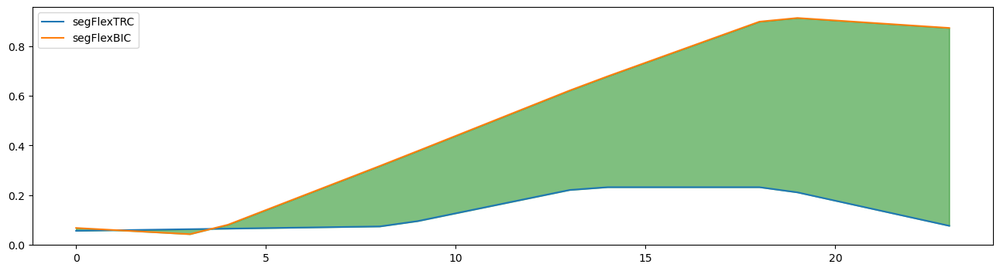

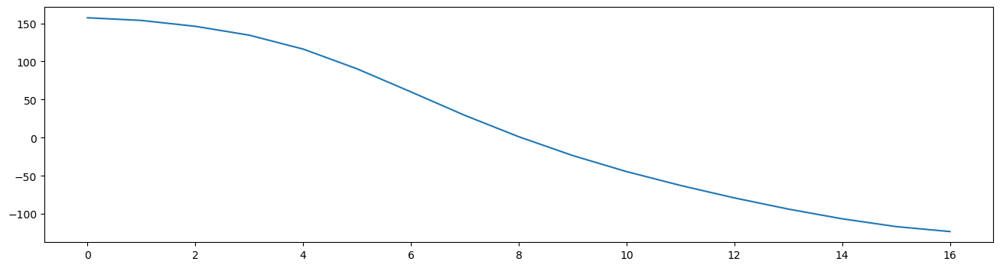

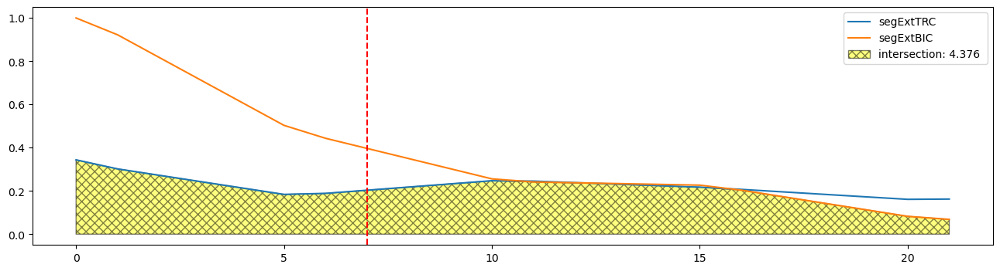

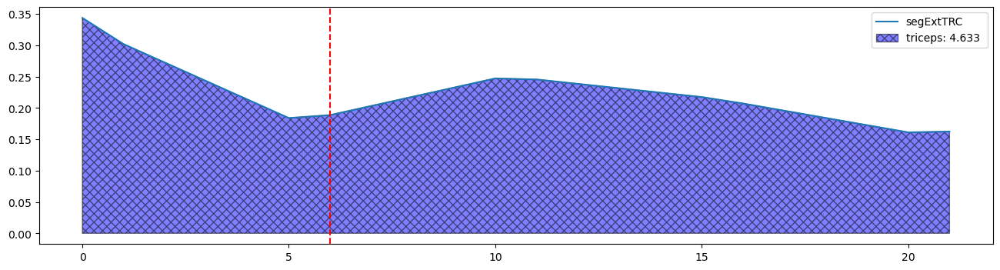

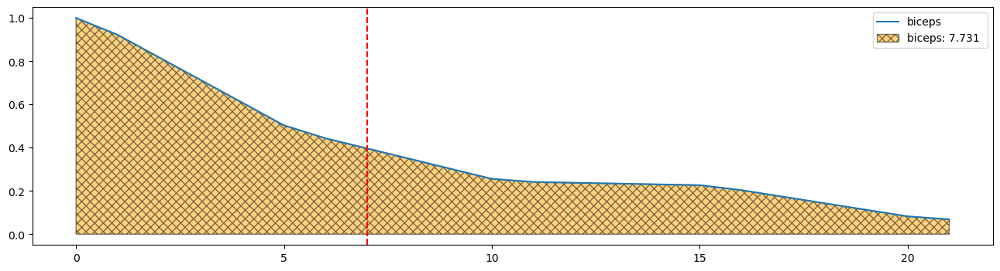

In [66]:

print(segmentosFlexRMStrcTemp[0])
segmentosExtRMStrcTemp, segmentosFlexRMStrcTemp, segmentosExtRMSbicTemp, segmentosFlexRMSbicTemp = normalizacionPicoSesion (segmentosExtTriceps, segmentosFlexTriceps, segmentosExtBiceps, segmentosFlexBiceps)
print(segmentosFlexRMStrcTemp[0])


x = np.arange(0,len(segmentosFlexRMStrcTemp[0]),1)
plt.figure(figsize=[16,4])

plt.plot(segmentosFlexRMStrcTemp[0],label= 'segFlexTRC')
plt.plot(segmentosFlexRMSbicTemp[0],label= 'segFlexBIC')
plt.fill_between(x, segmentosFlexRMStrcTemp[0], segmentosFlexRMSbicTemp[0], color='green',
                 alpha=0.5)
plt.legend()

x = np.arange(0,len(segmentosExtRMStrcTemp[0]),1)

plt.figure(figsize=[16,4])

plt.plot(segmentosExtTemp[0],label= 'segExtTRC')


plt.figure(figsize=[16,4])

plt.plot(segmentosExtRMStrcTemp[0],label= 'segExtTRC')
plt.plot(segmentosExtRMSbicTemp[0],label= 'segExtBIC')
#plt.fill_between(x, segmentosExtRMStrcTemp[2], segmentosExtRMSbicTemp[2], color='green',
                 #alpha=0.5)
plt.legend()


ys = []
x = np.arange(0,len(segmentosExtRMStrcTemp[0]),1)
ys.append(segmentosExtRMStrcTemp[0])
ys.append( segmentosExtRMSbicTemp[0])
y_intersection = np.amin(ys, axis=0)
area = np.trapz(y_intersection, x)
fill_poly = plt.fill_between(x, 0, y_intersection, fc='yellow', ec='black', alpha=0.5,
                             label=f'intersection: {area:.3f} ')
fill_poly.set_hatch('xxx')
print(area)
plt.legend()


plt.axvline(flexPeaks[0], linestyle = '--', color = "red")          



plt.figure(figsize=[16,4])
plt.plot(segmentosExtRMStrcTemp[0],label= 'segExtTRC')
ys = []
x = np.arange(0,len(segmentosExtRMStrcTemp[0]),1)

area = np.trapz(segmentosExtRMStrcTemp[0], x)
fill_poly = plt.fill_between(x, 0, segmentosExtRMStrcTemp[0], fc='blue', ec='black', alpha=0.5,
                             label=f'triceps: {area:.3f} ')
fill_poly.set_hatch('xxx')
print(area)
plt.legend()
plt.axvline(flexPeaks[2], linestyle = '--', color = "red")   

plt.figure(figsize=[16,4])
plt.plot(segmentosExtRMSbicTemp[0],label= 'biceps')
ys = []
x = np.arange(0,len(segmentosExtRMSbicTemp[0]),1)

area = np.trapz(segmentosExtRMSbicTemp[0], x)
fill_poly = plt.fill_between(x, 0, segmentosExtRMSbicTemp[0], fc='orange', ec='black', alpha=0.5,
                             label=f'biceps: {area:.3f} ')
fill_poly.set_hatch('xxx')
print(area)
plt.legend()
plt.axvline(flexPeaks[0], linestyle = '--', color = "red")   



#print(len(segmentosFlexRMSbicTemp))
#print(len(segmentosExtRMSbicTemp))
#print(len(flexPeaks))
#print(len(extPeaks))
#print(flexPeaks)
#print(extPeaks)
#print("par")
areasFlexAcc = integralSuperposiciónFlexAcc(segmentosFlexRMStrcTemp, segmentosFlexRMSbicTemp, flexPeaks)
#print(areasFlexAcc)
#print("---------------------------------")
areasFlexDecc = integralSuperposiciónFlexDecc(segmentosFlexRMStrcTemp, segmentosFlexRMSbicTemp, flexPeaks)
#print(areasFlexDecc)
#print("---------------------------------")
#print(len(segmentosExtTriceps))
#print(len(segmentosExtBiceps))
#print(len(extPeaks))

areasExtAcc = integralSuperposiciónExtAcc(segmentosExtRMStrcTemp, segmentosExtRMSbicTemp, extPeaks)
#print(areasExtAcc)
#print("---------------------------------")
areasExtDecc = integralSuperposiciónExtDecc(segmentosExtRMStrcTemp, segmentosExtRMSbicTemp, extPeaks)
#print(areasExtDecc)

kk
[0.06655681741776856, 0.07302826906724916, 0.08532669630602104, 0.09756944597069367, 0.12222736669982925, 0.1527427635840671, 0.19767515196152044, 0.24587272888000689, 0.2938098910396394, 0.32914445058200253, 0.3591332792511988, 0.3797962607787797, 0.38866944273097537, 0.3978253023316697, 0.3911510182565466, 0.376995174121845, 0.3389124541779261, 0.28954777274237675, 0.2666387522297083, 0.33333733675577093, 0.281694097363137, 0.2723820734961874, 0.2899995509526357, 0.3155875355271358, 0.36900163504455724, 0.38603262769339936, 0.3938114119400271, 0.38543187007717017, 0.3718037850115643, 0.3568963875245486, 0.3439466604960195, 0.3202772531448219, 0.29171518230220506, 0.26506422166556554, 0.23685180774300227]


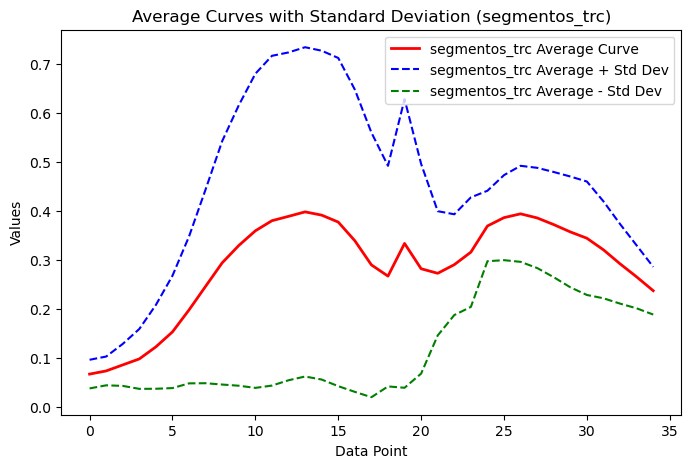

kk
[0.09667653883543213, 0.11016939575450561, 0.12377271795883368, 0.14332647526820555, 0.1723315194847086, 0.20694379310252528, 0.240407218152194, 0.27779477723779955, 0.3130288345503389, 0.3586739353496481, 0.41178060371117137, 0.48417862032113707, 0.5617130278571186, 0.6333574705502479, 0.6866477100363939, 0.7265077424067075, 0.7453458613352755, 0.7531750992293673, 0.7708205250841318, 0.71831236174381, 0.6344674099760812, 0.5476672465307236, 0.5015229894235494, 0.48532923396992306, 0.4567289489352453, 0.4086266348256059, 0.3646511368179455, 0.32925359546800936, 0.29868658834395956, 0.2751043395496909, 0.25624591373313105, 0.23774535539704436, 0.21080516851362407, 0.1835590164740336, 0.15914819592049828]


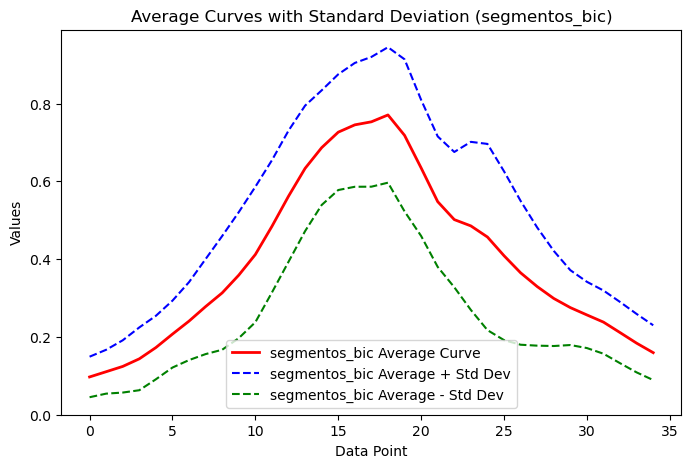

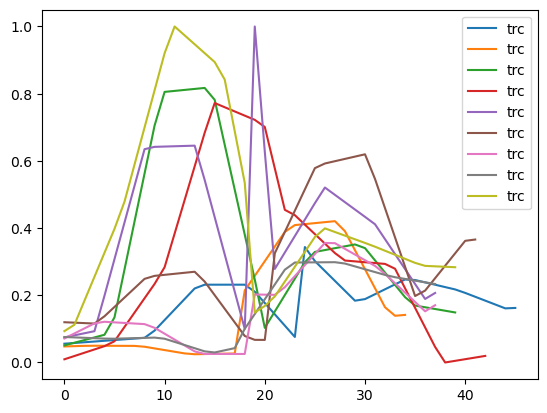

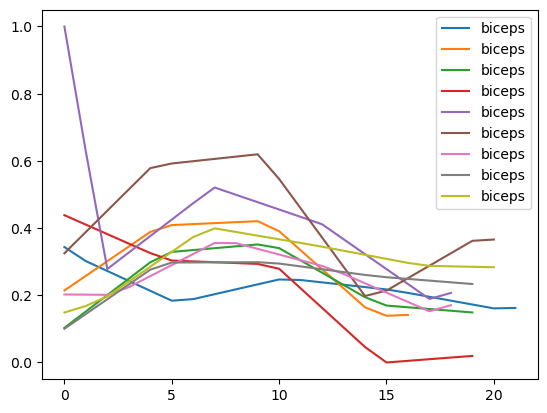

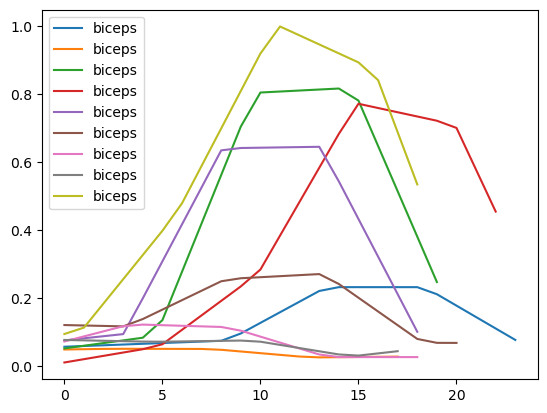

In [67]:
def plot_average_curve_with_std_EMG(data, data_type):
    # Find the minimum size among the lists
    min_size = min(len(values) for values in data)

    # Calculate the average values and standard deviation for each position across the lists
    position_averages = [np.mean([values[i] for values in data if len(values) >= i + 1]) for i in range(min_size)]
    print("kk")
    print(position_averages)
    position_std_deviations = [np.std([values[i] for values in data if len(values) >= i + 1]) for i in range(min_size)]

    # Plotting
    plt.figure(figsize=(8, 5))

    # Plot the curve of average values
    plt.plot(position_averages, label=f'{data_type} Average Curve', color='red', linewidth=2)

    # Plot the curve of average values plus standard deviation
    plt.plot(np.array(position_averages) + position_std_deviations, label=f'{data_type} Average + Std Dev', linestyle='--', color='blue')

    # Plot the curve of average values minus standard deviation
    plt.plot(np.array(position_averages) - position_std_deviations, label=f'{data_type} Average - Std Dev', linestyle='--', color='green')

    # Show legend
    plt.legend()

    # Set plot labels
    plt.title(f'Average Curves with Standard Deviation ({data_type})')
    plt.xlabel('Data Point')
    plt.ylabel('Values')

    # Show the plot
    plt.show()
    
    return position_averages, position_std_deviations
segmentosTrc = []

for sublist_1, sublist_2 in zip(segmentosFlexRMStrcTemp, segmentosExtRMStrcTemp):
    concatenated_list = sublist_1 + sublist_2
    segmentosTrc.append(concatenated_list)
    
segmentosBic = []

for sublist_1, sublist_2 in zip(segmentosFlexRMSbicTemp, segmentosExtRMSbicTemp):
    concatenated_list = sublist_1 + sublist_2
    segmentosBic.append(concatenated_list)
    
def concatenate_lists(list1, list2):
    concatenated_lists = []
    for i in range(len(list1)):
        concatenated_sublist = list1[i] + list2[i]
        concatenated_lists.append(concatenated_sublist)
    return concatenated_lists

segmentosTrc=concatenate_lists(segmentosFlexRMStrcTemp,segmentosExtRMStrcTemp)
segmentosBic=concatenate_lists(segmentosFlexRMSbicTemp,segmentosExtRMSbicTemp)

plot_average_curve_with_std_EMG(segmentosTrc, 'segmentos_trc')
plot_average_curve_with_std_EMG(segmentosBic, 'segmentos_bic')


plt.figure()
for seg in segmentosTrc:
    plt.plot(seg,label= 'trc')
plt.legend()

plt.figure()
for seg in segmentosExtRMStrcTemp:
    plt.plot(seg,label= 'biceps')
plt.legend()
plt.figure()
for seg in segmentosFlexRMStrcTemp:
    plt.plot(seg,label= 'biceps')

plt.legend()


In [68]:
#------


In [69]:
def AlternativeCoefs(areaInter, areaTrc, areaBic):
    coeffs=[]
    coef=0
    for index, area in enumerate(areaInter):
        coeff = 2*((area)/(areaTrc[index]+areaBic[index]))*100
        coeffs.append(coeff)
    return coeffs

/var/folders/m1/fyb2wf_51n3f0l5w2s09qqyh0000gn/T/ipykernel_3645/2804400471.py:18: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


0.4146378890571323
0.44433022808757805
0.73264360652709
0.2957727534465151
0.2957727534465151
1.2424539608199403
0.5697351505893671
0.5807212004084975
1.1699160311168177
0.9197537096067243
1.0242541769169595
1.2566077179545625
1.007819864762693
2.0644328726258356
1.1612043383390125
1.5063714924959855
1.5063714924959855
2.8123254284836117
0.9318093500069861
0.9796290774665545
1.952368780419189
0.5078197687622438
0.5078197687622438
1.008877477119215
1.2425212769533558
3.494263854558468
1.2425212769533558


/var/folders/m1/fyb2wf_51n3f0l5w2s09qqyh0000gn/T/ipykernel_3645/2804400471.py:52: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


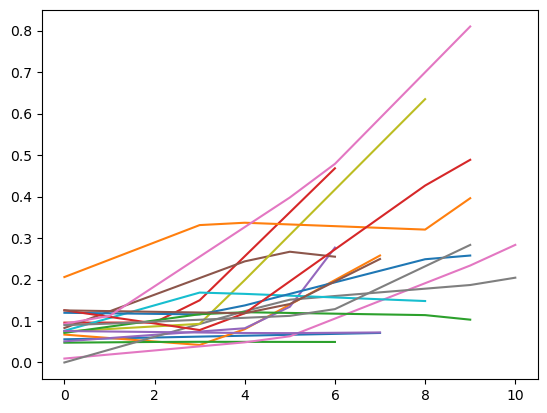

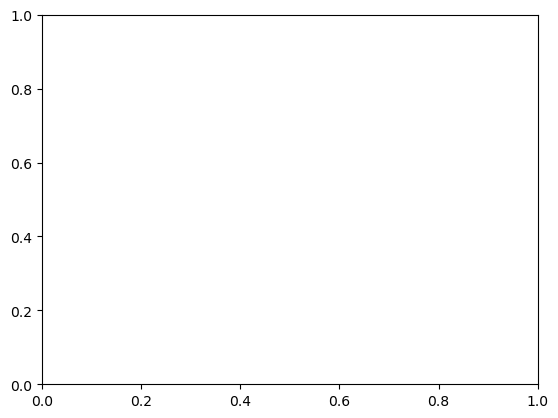

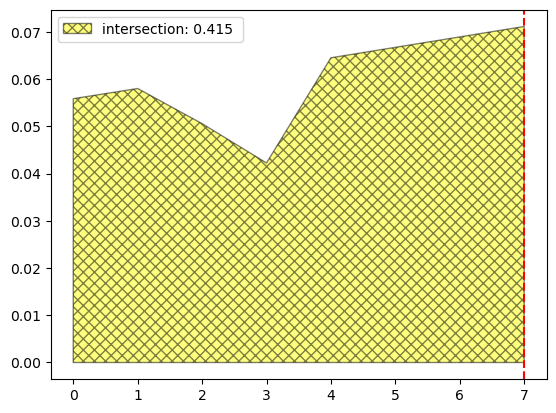

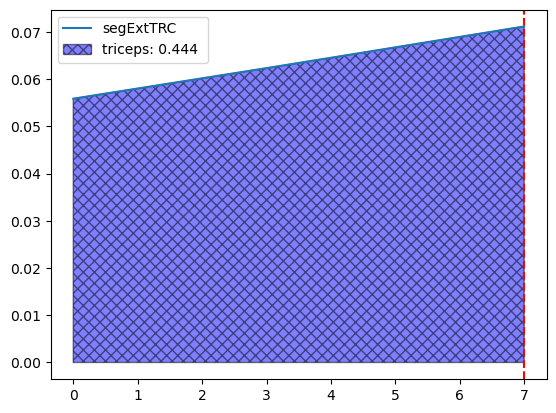

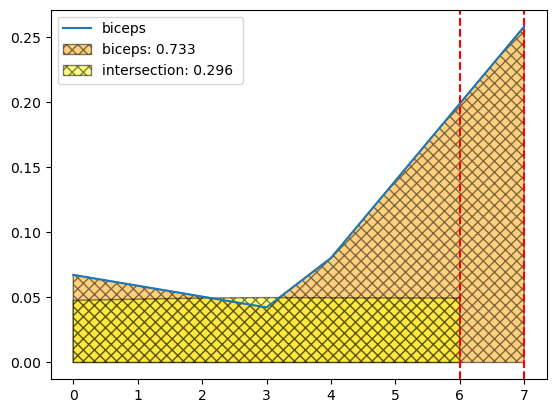

...

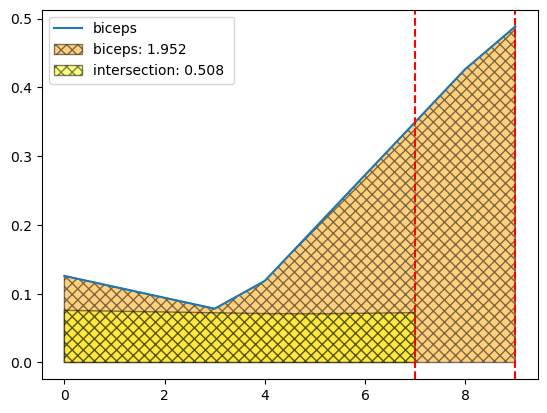

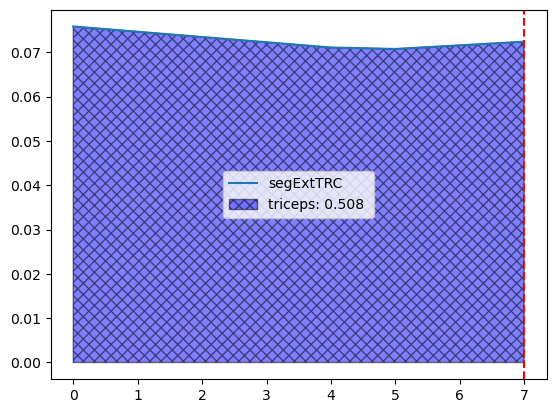

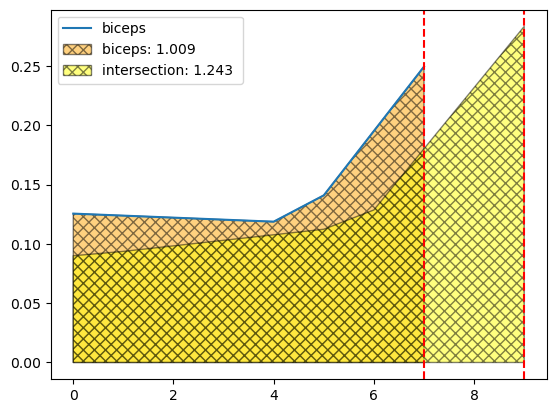

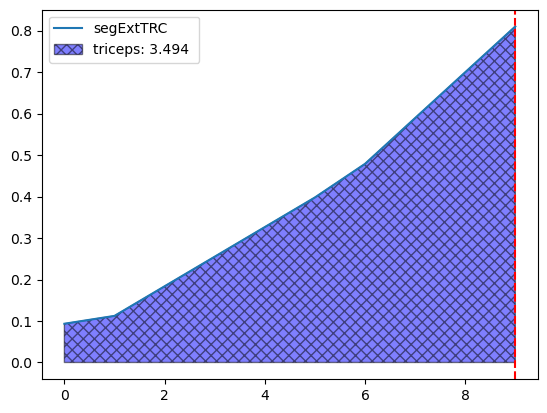

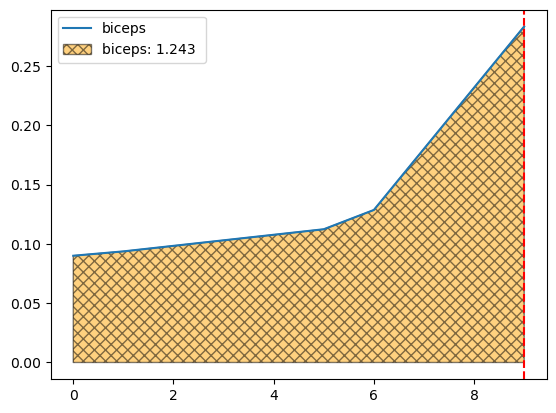

In [70]:
areaInter=[]
areaTrc=[]
areaBic=[]


fig1, ax1 = plt.subplots()
fig2, ax2 = plt.subplots()
fig3, ax3 = plt.subplots()

for index, segmento in enumerate(segmentosFlexRMStrcTemp):
    segmentoBic=segmentosFlexRMSbicTemp[index]
    segmentoBic=segmentoBic[0:flexPeaks[index]+1]
    segmento=segmento[0:flexPeaks[index]+1]
    ax1.plot(segmento,label= 'segExtTRC')
    ax1.plot(segmentoBic,label= 'segExtBIC')
#plt.fill_between(x, segmentosExtRMStrcTemp[2], segmentosExtRMSbicTemp[2], color='green',
                 #alpha=0.5)
    plt.legend()


    ys = []
    x = np.arange(0,len(segmento),1)
    ys.append(segmento)
    ys.append(segmentoBic)
    y_intersection = np.amin(ys, axis=0)
    area = np.trapz(y_intersection, x)
    fill_poly = plt.fill_between(x, 0, y_intersection, fc='yellow', ec='black', alpha=0.5,
                                 label=f'intersection: {area:.3f} ')
    fill_poly.set_hatch('xxx')
    print(area)
    plt.legend()
    areaInter.append(area)

    plt.axvline(flexPeaks[index], linestyle = '--', color = "red")          



    plt.figure()
    plt.plot(segmento,label= 'segExtTRC')
    ys = []
    x = np.arange(0,len(segmento),1)

    area = np.trapz(segmento, x)
    fill_poly = plt.fill_between(x, 0, segmento, fc='blue', ec='black', alpha=0.5,
                             label=f'triceps: {area:.3f} ')
    fill_poly.set_hatch('xxx')
    print(area)
    areaTrc.append(area)
    plt.legend()
    plt.axvline(flexPeaks[index], linestyle = '--', color = "red")   
    
    plt.figure()
    plt.plot(segmentoBic,label= 'biceps')
    ys = []
    x = np.arange(0,len(segmentoBic),1)

    area = np.trapz(segmentoBic, x)
    fill_poly = plt.fill_between(x, 0, segmentoBic, fc='orange', ec='black', alpha=0.5,
                                 label=f'biceps: {area:.3f} ')
    fill_poly.set_hatch('xxx')
    print(area)
    areaBic.append(area)
    plt.legend()
    plt.axvline(flexPeaks[index], linestyle = '--', color = "red")
    
CoeffsFlexAcc=AlternativeCoefs(areaInter, areaTrc, areaBic)
#print(CoeffsFlexAcc)
#print("Media:")
#print(stat.mean(CoeffsFlexAcc))
#print("Desv. Std.:")
#print(stat.stdev(CoeffsFlexAcc))
    


1.4800994766066857
1.4800994766066857
4.285093103243094
1.971422814818477
2.015003617089668
3.202889699647965
1.2670382985761628
1.4479006269917254
2.249854249215181
2.1363796983786347
2.144725203013036
3.3152277515116655
2.7021770927801985
3.2689777670736007
3.114568003731969
2.304117360563019
2.988032945178735
2.4616339658597264
1.43580592905414
1.4366673942167312


/var/folders/m1/fyb2wf_51n3f0l5w2s09qqyh0000gn/T/ipykernel_3645/2629423069.py:49: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=[16,4])


2.7415658592861942
1.3320186245234131
1.3373093280182309
2.239914967125844
1.1024977785110868
1.1296963504140833
1.7160620488382674


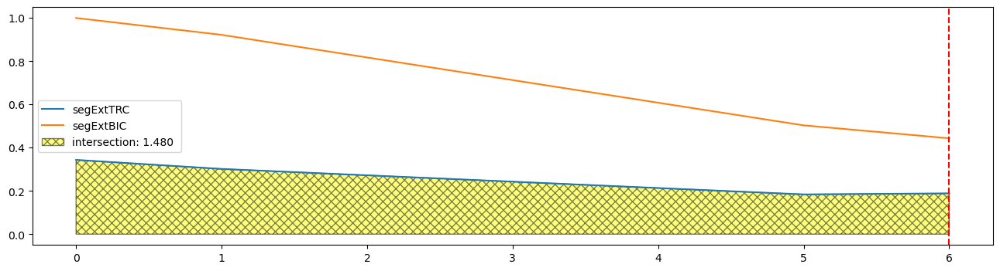

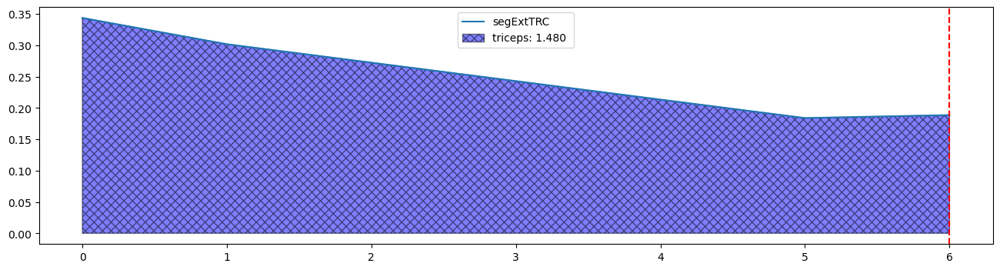

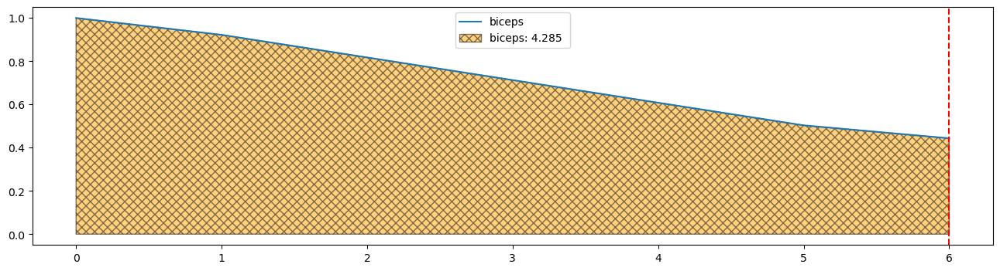

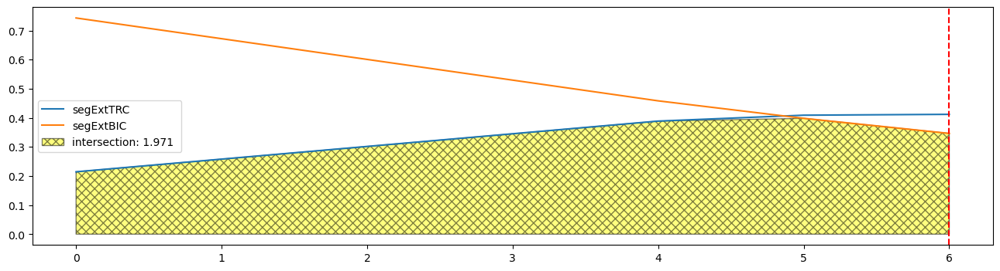

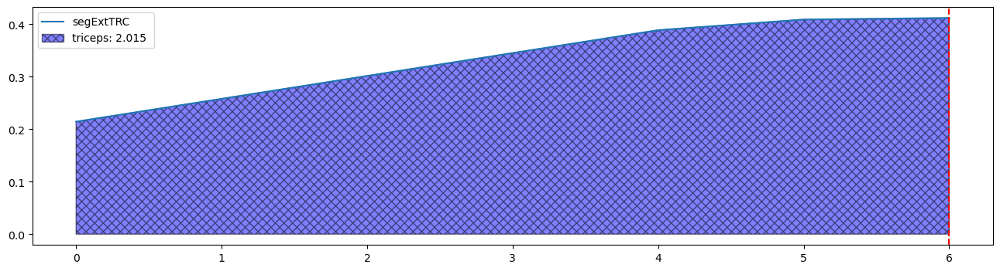

...

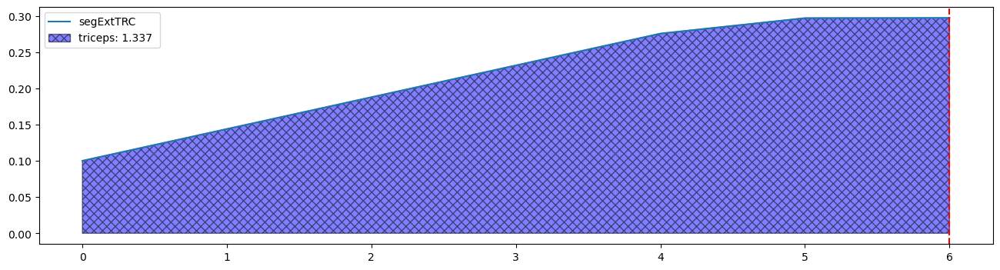

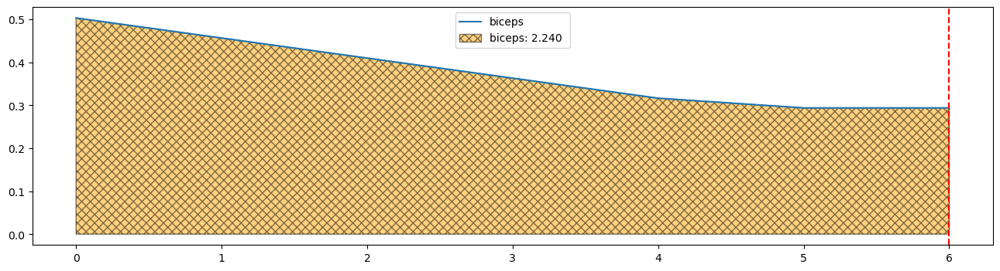

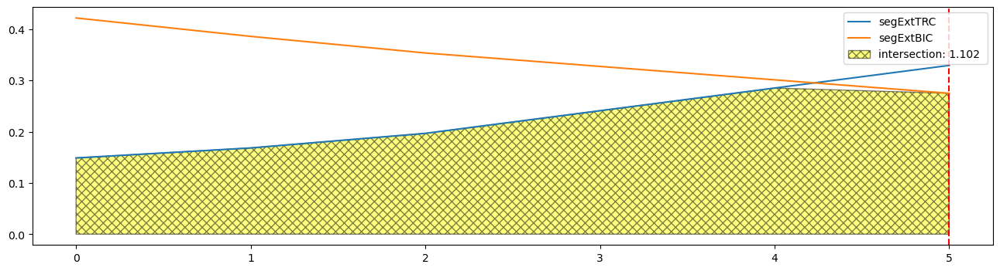

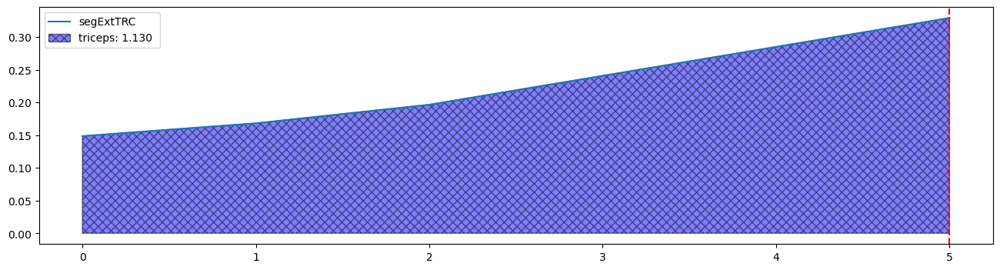

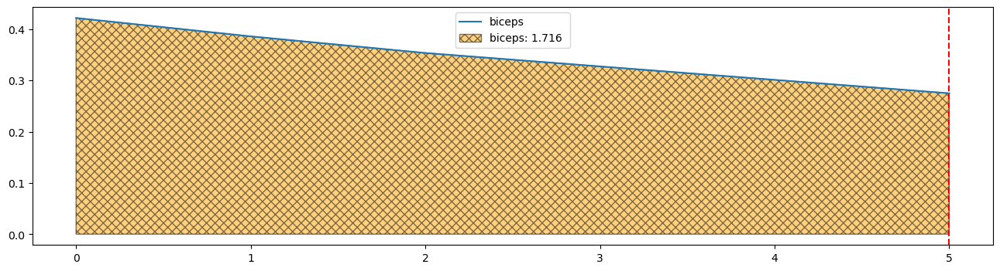

In [71]:
areaInter=[]
areaTrc=[]
areaBic=[]


for index, segmento in enumerate(segmentosExtRMStrcTemp):
    segmentoBic=segmentosExtRMSbicTemp[index]
    segmentoBic=segmentoBic[0:extPeaks[index]+1]
    segmento=segmento[0:extPeaks[index]+1]
    plt.figure(figsize=[16,4])
    plt.plot(segmento,label= 'segExtTRC')
    plt.plot(segmentoBic,label= 'segExtBIC')
#plt.fill_between(x, segmentosExtRMStrcTemp[2], segmentosExtRMSbicTemp[2], color='green',
                 #alpha=0.5)
    plt.legend()


    ys = []
    x = np.arange(0,len(segmento),1)
    ys.append(segmento)
    ys.append(segmentoBic)
    y_intersection = np.amin(ys, axis=0)
    area = np.trapz(y_intersection, x)
    fill_poly = plt.fill_between(x, 0, y_intersection, fc='yellow', ec='black', alpha=0.5,
                                 label=f'intersection: {area:.3f} ')
    fill_poly.set_hatch('xxx')
    print(area)
    plt.legend()
    areaInter.append(area)

    plt.axvline(extPeaks[index], linestyle = '--', color = "red")          



    plt.figure(figsize=[16,4])
    plt.plot(segmento,label= 'segExtTRC')
    ys = []
    x = np.arange(0,len(segmento),1)

    area = np.trapz(segmento, x)
    fill_poly = plt.fill_between(x, 0, segmento, fc='blue', ec='black', alpha=0.5,
                             label=f'triceps: {area:.3f} ')
    fill_poly.set_hatch('xxx')
    print(area)
    areaTrc.append(area)
    plt.legend()
    plt.axvline(extPeaks[index], linestyle = '--', color = "red")   
    
    plt.figure(figsize=[16,4])
    plt.plot(segmentoBic,label= 'biceps')
    ys = []
    x = np.arange(0,len(segmentoBic),1)

    area = np.trapz(segmentoBic, x)
    fill_poly = plt.fill_between(x, 0, segmentoBic, fc='orange', ec='black', alpha=0.5,
                                 label=f'biceps: {area:.3f} ')
    fill_poly.set_hatch('xxx')
    print(area)
    areaBic.append(area)
    plt.legend()
    plt.axvline(extPeaks[index], linestyle = '--', color = "red")
    
CoeffsExtAcc=AlternativeCoefs(areaInter, areaTrc, areaBic)
#print(CoeffsExtAcc)
#print("Media:")
#print(stat.mean(CoeffsExtAcc))
#print("Desv. Std.:")
#print(stat.stdev(CoeffsExtAcc))

2.6403769738066325
2.6403769738066325
10.036901641450772
0.346991726019449
0.346991726019449
7.830385120006355
5.60980305713206
8.015334080096594
6.774344438939909
6.112793354368931
7.001248239929328
6.424794916949269
2.7820372357576932
4.937729651678169
3.136933934183835
2.023522602897288
2.023522602897288
7.874683974949415
0.37777640618841607
0.37777640618841607
5.0545748917044175


/var/folders/m1/fyb2wf_51n3f0l5w2s09qqyh0000gn/T/ipykernel_3645/198719632.py:49: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


0.49087975695273695
0.49087975695273695
4.10147030014787
4.774497685750352
7.2467091257009155
4.978284930095357


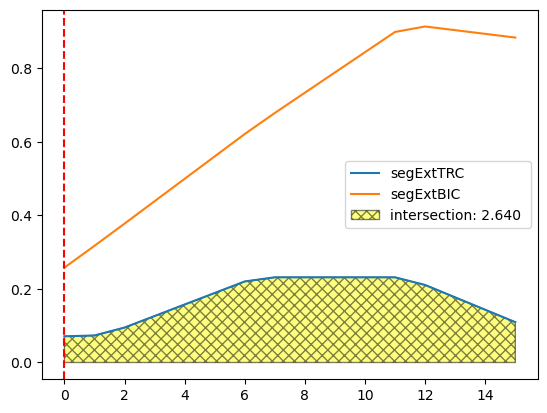

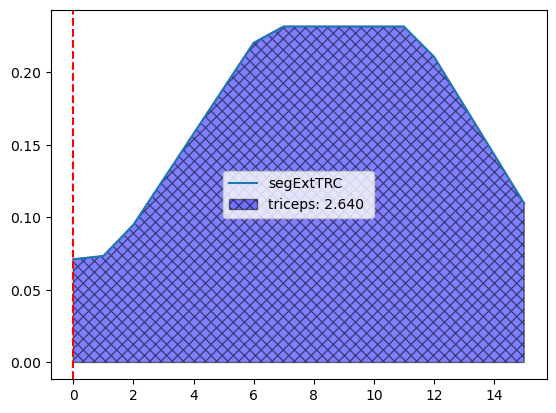

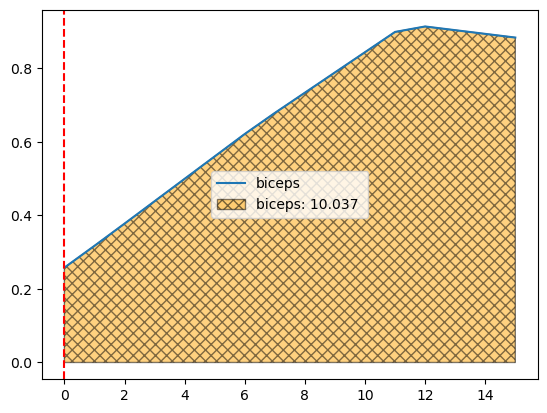

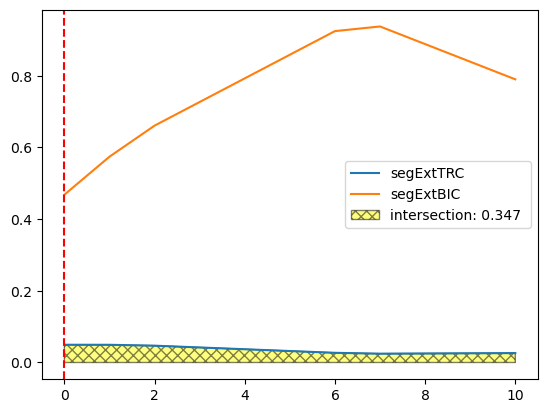

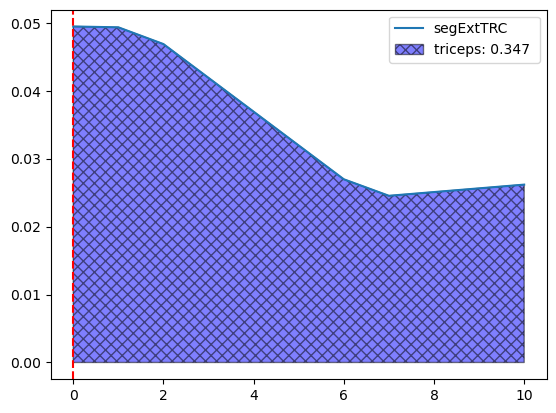

...

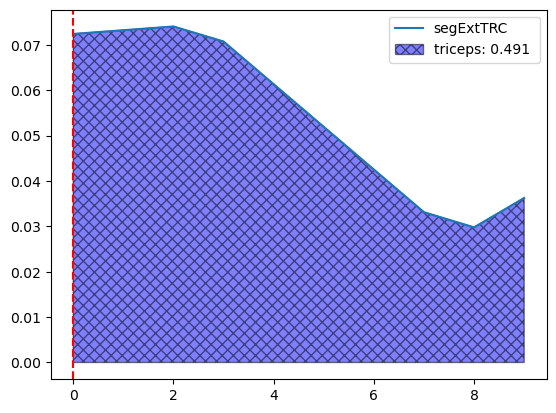

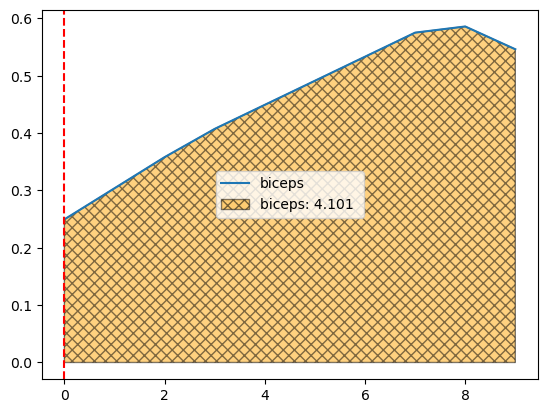

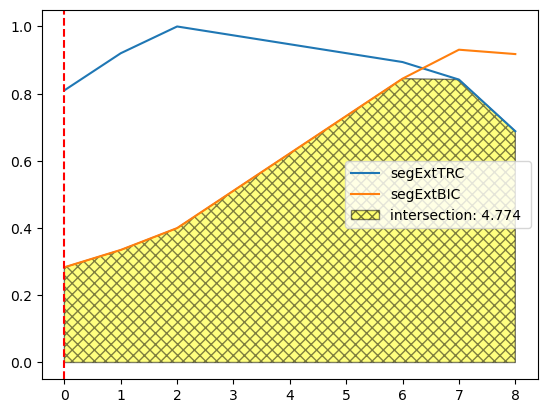

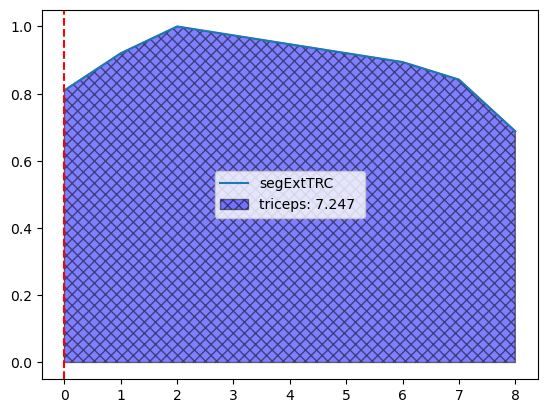

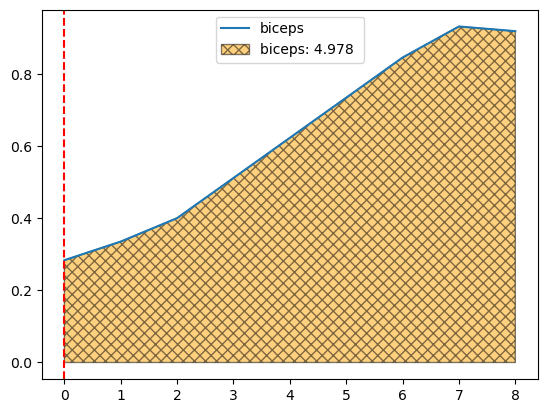

In [72]:
areaInter=[]
areaTrc=[]
areaBic=[]

 
for index, segmento in enumerate(segmentosFlexRMStrcTemp):
    segmentoBic=segmentosFlexRMSbicTemp[index]
    segmentoBic=segmentoBic[flexPeaks[index]:-1]
    segmento=segmento[flexPeaks[index]:-1]
    plt.figure()
    plt.plot(segmento,label= 'segExtTRC')
    plt.plot(segmentoBic,label= 'segExtBIC')
#plt.fill_between(x, segmentosExtRMStrcTemp[2], segmentosExtRMSbicTemp[2], color='green',
                 #alpha=0.5)
    plt.legend()


    ys = []
    x = np.arange(0,len(segmento),1)
    ys.append(segmento)
    ys.append(segmentoBic)
    y_intersection = np.amin(ys, axis=0)
    area = np.trapz(y_intersection, x)
    fill_poly = plt.fill_between(x, 0, y_intersection, fc='yellow', ec='black', alpha=0.5,
                                 label=f'intersection: {area:.3f} ')
    fill_poly.set_hatch('xxx')
    print(area)
    plt.legend()
    areaInter.append(area)

    plt.axvline(0, linestyle = '--', color = "red")          



    plt.figure()
    plt.plot(segmento,label= 'segExtTRC')
    ys = []
    x = np.arange(0,len(segmento),1)

    area = np.trapz(segmento, x)
    fill_poly = plt.fill_between(x, 0, segmento, fc='blue', ec='black', alpha=0.5,
                             label=f'triceps: {area:.3f} ')
    fill_poly.set_hatch('xxx')
    print(area)
    areaTrc.append(area)
    plt.legend()
    plt.axvline(0, linestyle = '--', color = "red")   
    
    plt.figure()
    plt.plot(segmentoBic,label= 'biceps')
    ys = []
    x = np.arange(0,len(segmentoBic),1)

    area = np.trapz(segmentoBic, x)
    fill_poly = plt.fill_between(x, 0, segmentoBic, fc='orange', ec='black', alpha=0.5,
                                 label=f'biceps: {area:.3f} ')
    fill_poly.set_hatch('xxx')
    print(area)
    areaBic.append(area)
    plt.legend()
    plt.axvline(0, linestyle = '--', color = "red")
    
CoeffsFlexDecc=AlternativeCoefs(areaInter, areaTrc, areaBic)
#print(CoeffsFlexDecc)
#print("Media:")
#print(stat.mean(CoeffsFlexDecc))
#print("Desv. Std.:")
#print(stat.stdev(CoeffsFlexDecc))

2.821017466314527
2.9916222536460944
3.3703972542473117
1.5761074443706782
2.915917939436554
1.5761074443706782
1.5886012891038066
3.1109751443515457
1.5886012891038066
1.1378355320467692
1.8727725235774926
1.1904531713231161
1.8891321061999662
3.8317929342344996
1.8891321061999662
3.2839892070486147
5.256602959549701
3.3731340346550316
2.8363632952378897
3.086829631977735
2.892529235663051
2.967912025716484
3.2964375429999864
2.967912025716484
2.524403475966855
4.743975243522671
2.524403475966855


/var/folders/m1/fyb2wf_51n3f0l5w2s09qqyh0000gn/T/ipykernel_3645/3615475092.py:50: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


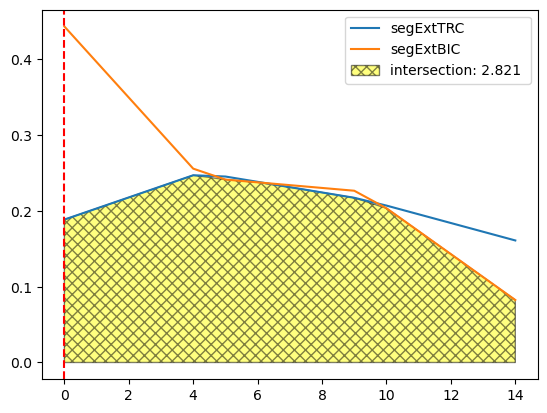

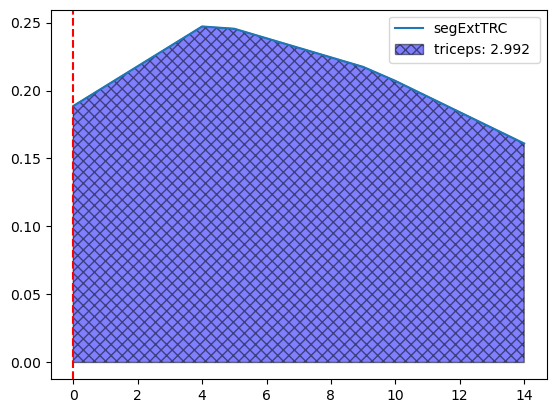

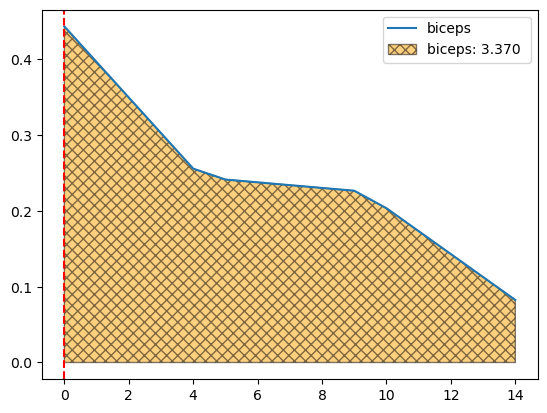

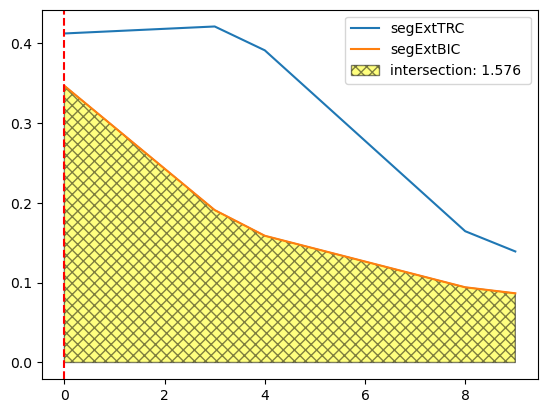

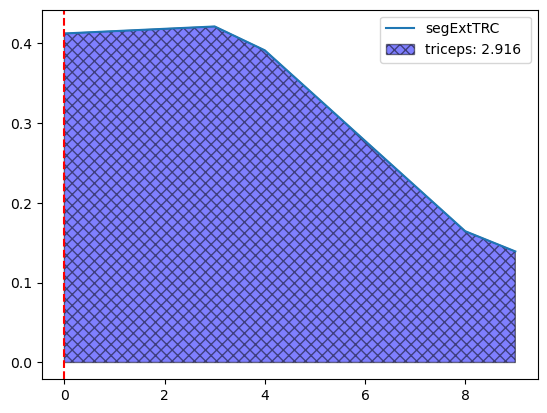

...

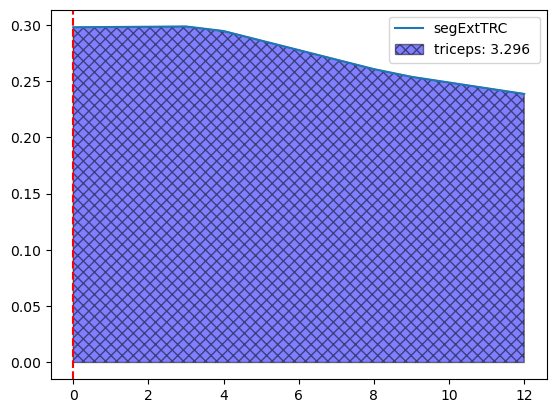

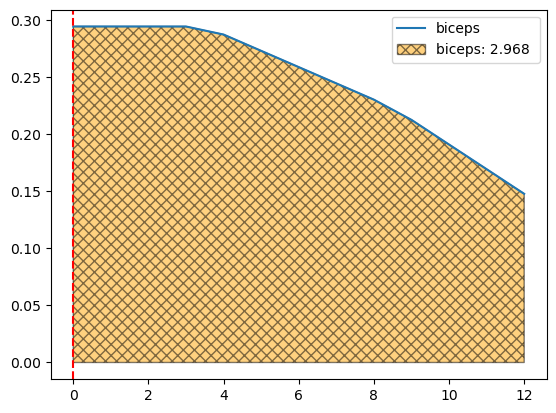

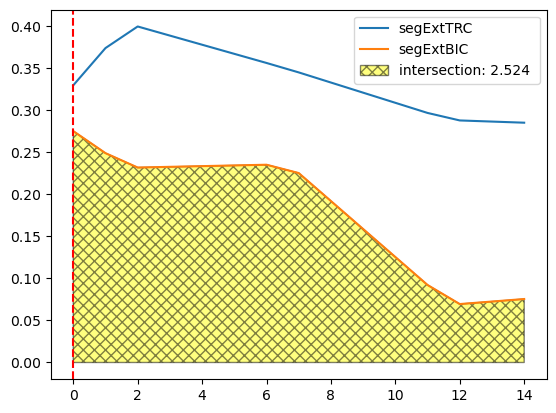

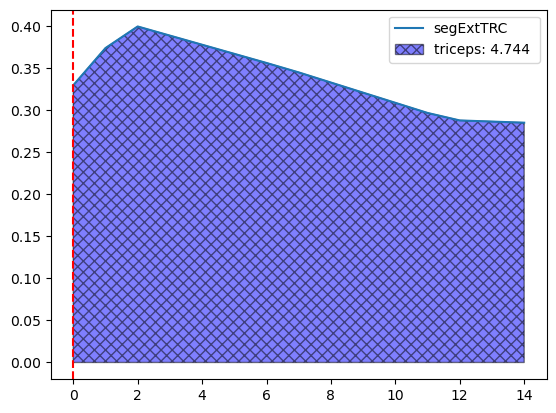

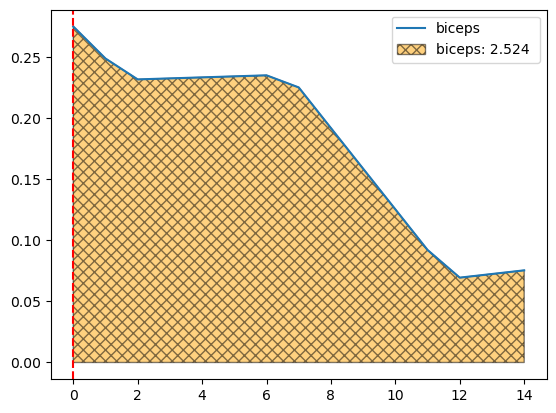

In [73]:
areaInter=[]
areaTrc=[]
areaBic=[]



for index, segmento in enumerate(segmentosExtRMStrcTemp):
    segmentoBic=segmentosExtRMSbicTemp[index]
    segmentoBic=segmentoBic[extPeaks[index]:-1]
    segmento=segmento[extPeaks[index]:-1]
    plt.figure()
    plt.plot(segmento,label= 'segExtTRC')
    plt.plot(segmentoBic,label= 'segExtBIC')
#plt.fill_between(x, segmentosExtRMStrcTemp[2], segmentosExtRMSbicTemp[2], color='green',
                 #alpha=0.5)
    plt.legend()


    ys = []
    x = np.arange(0,len(segmento),1)
    ys.append(segmento)
    ys.append(segmentoBic)
    y_intersection = np.amin(ys, axis=0)
    area = np.trapz(y_intersection, x)
    fill_poly = plt.fill_between(x, 0, y_intersection, fc='yellow', ec='black', alpha=0.5,
                                 label=f'intersection: {area:.3f} ')
    fill_poly.set_hatch('xxx')
    print(area)
    plt.legend()
    areaInter.append(area)

    plt.axvline(0, linestyle = '--', color = "red")          



    plt.figure()
    plt.plot(segmento,label= 'segExtTRC')
    ys = []
    x = np.arange(0,len(segmento),1)

    area = np.trapz(segmento, x)
    fill_poly = plt.fill_between(x, 0, segmento, fc='blue', ec='black', alpha=0.5,
                             label=f'triceps: {area:.3f} ')
    fill_poly.set_hatch('xxx')
    print(area)
    areaTrc.append(area)
    plt.legend()
    plt.axvline(0, linestyle = '--', color = "red")   
    
    plt.figure()
    plt.plot(segmentoBic,label= 'biceps')
    ys = []
    x = np.arange(0,len(segmentoBic),1)

    area = np.trapz(segmentoBic, x)
    fill_poly = plt.fill_between(x, 0, segmentoBic, fc='orange', ec='black', alpha=0.5,
                                 label=f'biceps: {area:.3f} ')
    fill_poly.set_hatch('xxx')
    print(area)
    areaBic.append(area)
    plt.legend()
    plt.axvline(0, linestyle = '--', color = "red")
    
CoeffsExtDecc=AlternativeCoefs(areaInter, areaTrc, areaBic)
#print(CoeffsExtDecc)
#print("Media:")
#print(stat.mean(CoeffsExtDecc))
#print("Desv. Std.:")
#print(stat.stdev(CoeffsExtDecc))
    

4.376493603086293
4.6333935738882515
7.730867017655485
3.6341709991611655
5.071211840146782
4.865637883990654
2.9225650059140533
4.710310188681924
3.9053809565530715
3.278935752026584
4.034598547320127
4.510401444435961
4.619089931077807
7.298770610106085
5.031480842029577
5.723945869582116
8.608643516112219
5.970607302485241
4.410945328441098
4.684927250896753
5.772871199098313
4.436744487326674


/var/folders/m1/fyb2wf_51n3f0l5w2s09qqyh0000gn/T/ipykernel_3645/1799652739.py:49: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


4.869774257301257
5.344640829929105
3.7037677898634835
6.157832061670279
4.317332060190664


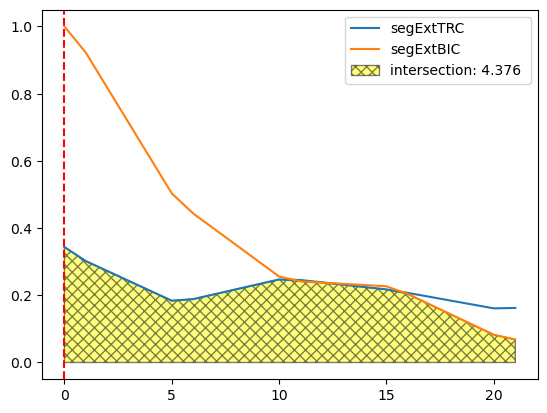

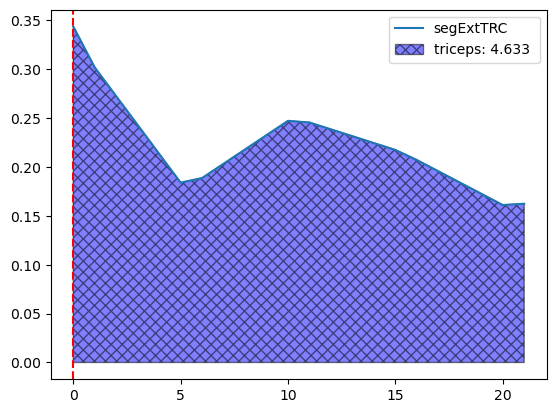

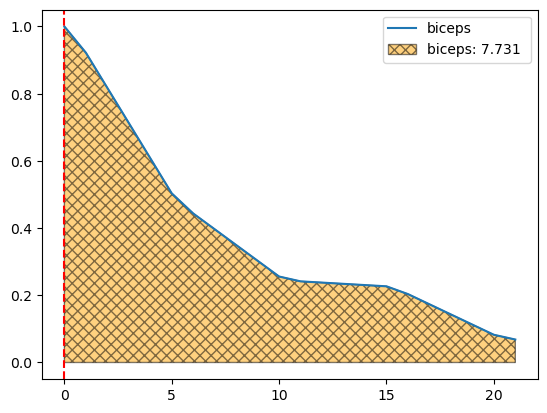

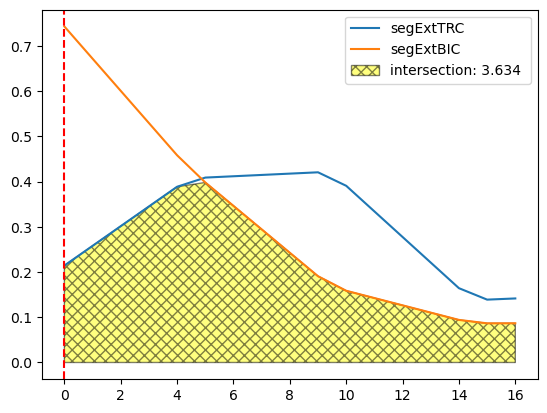

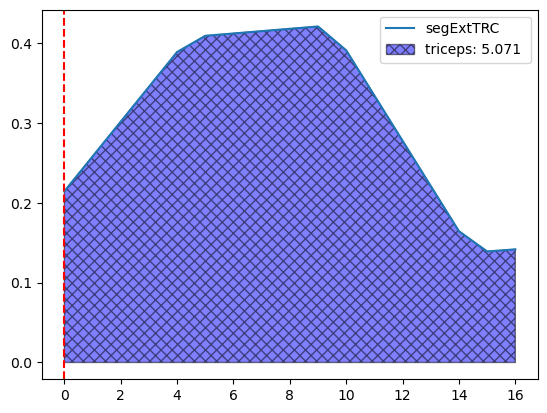

...

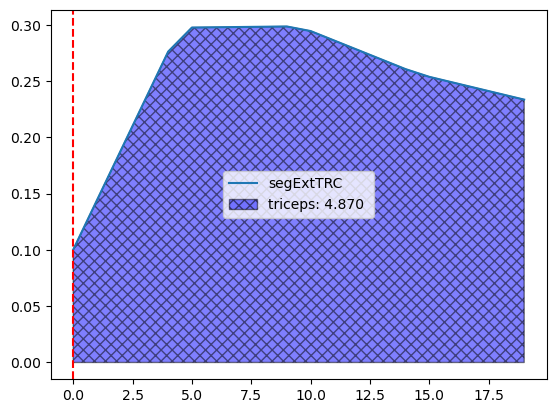

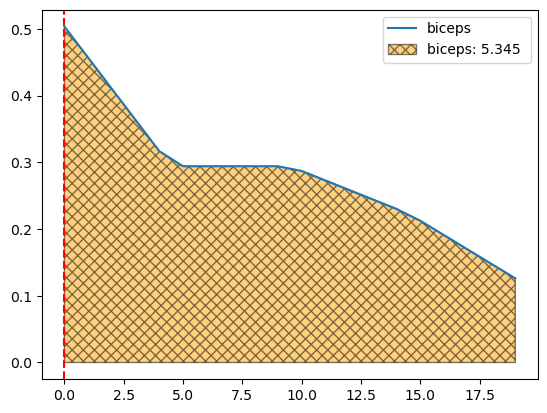

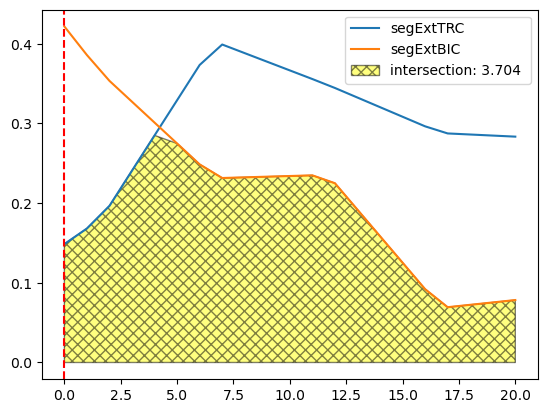

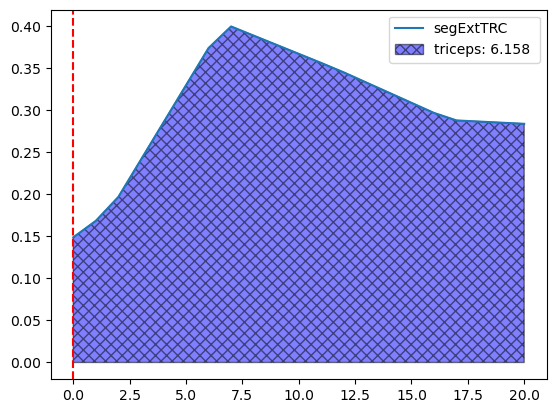

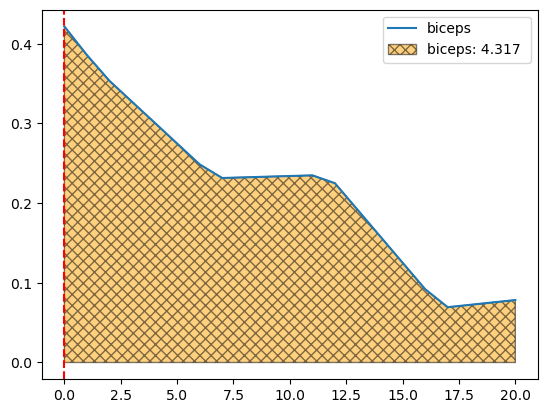

In [74]:
#INTEGRAL EXT 
areaInter=[]
areaTrc=[]
areaBic=[]

 
for index, segmento in enumerate(segmentosExtRMStrcTemp):
    segmentoBic=segmentosExtRMSbicTemp[index]
   
    plt.figure()
    plt.plot(segmento,label= 'segExtTRC')
    plt.plot(segmentoBic,label= 'segExtBIC')
#plt.fill_between(x, segmentosExtRMStrcTemp[2], segmentosExtRMSbicTemp[2], color='green',
                 #alpha=0.5)
    plt.legend()


    ys = []
    x = np.arange(0,len(segmento),1)
    ys.append(segmento)
    ys.append(segmentoBic)
    y_intersection = np.amin(ys, axis=0)
    area = np.trapz(y_intersection, x)
    fill_poly = plt.fill_between(x, 0, y_intersection, fc='yellow', ec='black', alpha=0.5,
                                 label=f'intersection: {area:.3f} ')
    fill_poly.set_hatch('xxx')
    print(area)
    plt.legend()
    areaInter.append(area)

    plt.axvline(0, linestyle = '--', color = "red")          



    plt.figure()
    plt.plot(segmento,label= 'segExtTRC')
    ys = []
    x = np.arange(0,len(segmento),1)

    area = np.trapz(segmento, x)
    fill_poly = plt.fill_between(x, 0, segmento, fc='blue', ec='black', alpha=0.5,
                             label=f'triceps: {area:.3f} ')
    fill_poly.set_hatch('xxx')
    print(area)
    areaTrc.append(area)
    plt.legend()
    plt.axvline(0, linestyle = '--', color = "red")   
    
    plt.figure()
    plt.plot(segmentoBic,label= 'biceps')
    ys = []
    x = np.arange(0,len(segmentoBic),1)

    area = np.trapz(segmentoBic, x)
    fill_poly = plt.fill_between(x, 0, segmentoBic, fc='orange', ec='black', alpha=0.5,
                                 label=f'biceps: {area:.3f} ')
    fill_poly.set_hatch('xxx')
    print(area)
    areaBic.append(area)
    plt.legend()
    plt.axvline(0, linestyle = '--', color = "red")
    
CoeffsExt=AlternativeCoefs(areaInter, areaTrc, areaBic)
#print(CoeffsExt)
#print("Media:")
#print(stat.mean(CoeffsExt))
#print("Desv. Std.:")
#print(stat.stdev(CoeffsExt))

3.1478175107719726
3.177509849802419
11.64785392450898
0.6692179938197893
0.6692179938197893
9.838122543533633
6.493091411306478
8.909608484090143
8.933651006721854
7.548487443550191
8.541442796420823
8.432513372708529
3.945238814246815
7.157544238030434
4.847654127805431
3.5971493814661146
3.5971493814661146
11.573948068757174
1.33492421723795
1.3827439446975185


/var/folders/m1/fyb2wf_51n3f0l5w2s09qqyh0000gn/T/ipykernel_3645/2761288313.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


7.617388578189083
1.038181702297872
1.038181702297872
5.636654732095195
6.62833359814014
11.352287615695817
7.132193245176
Media:
51.395654801948
Desv. Std.:
24.89761769574855


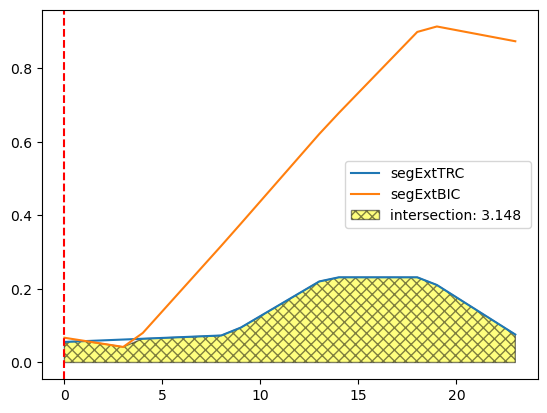

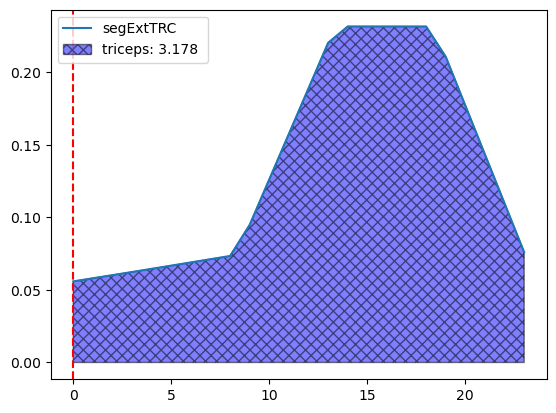

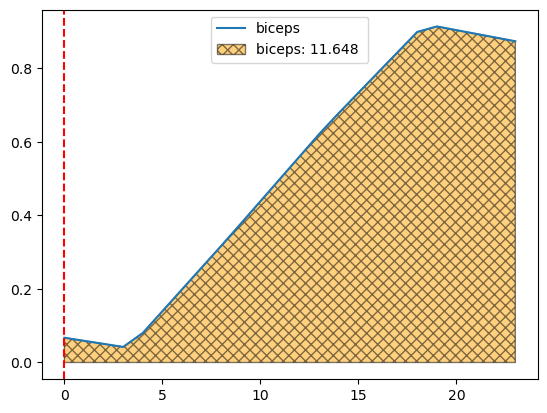

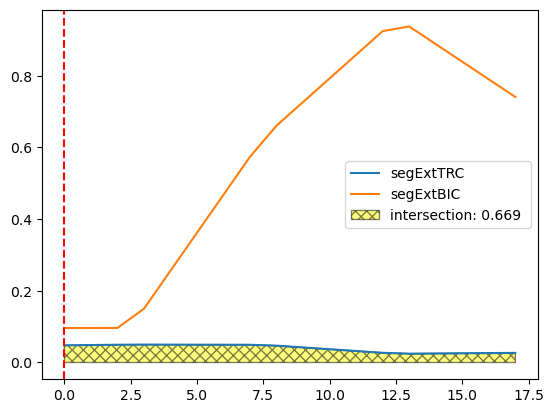

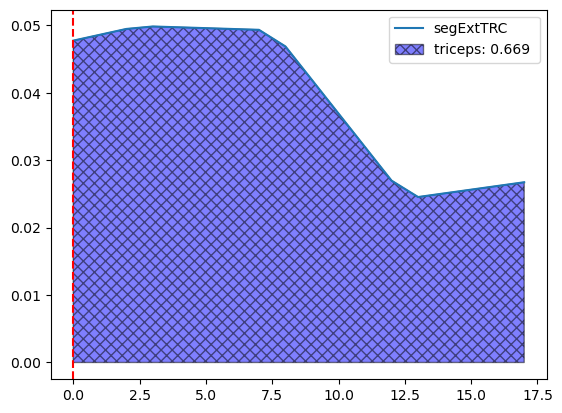

...

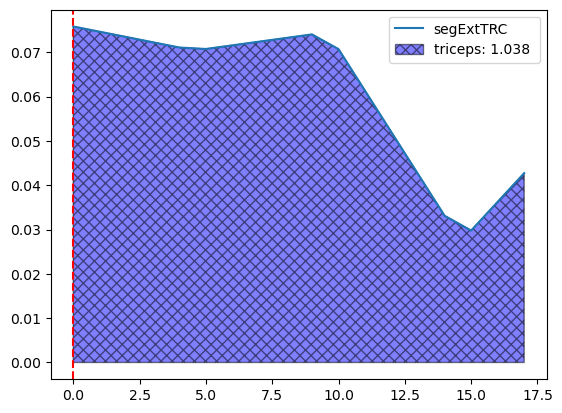

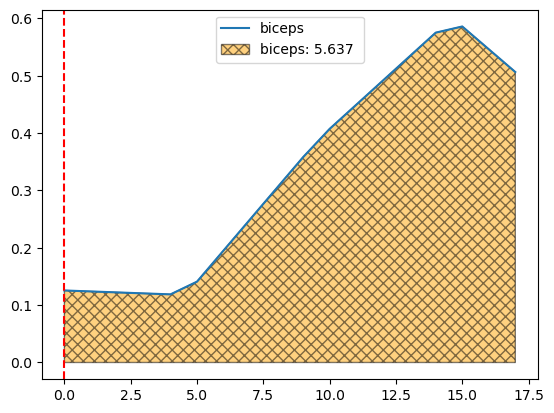

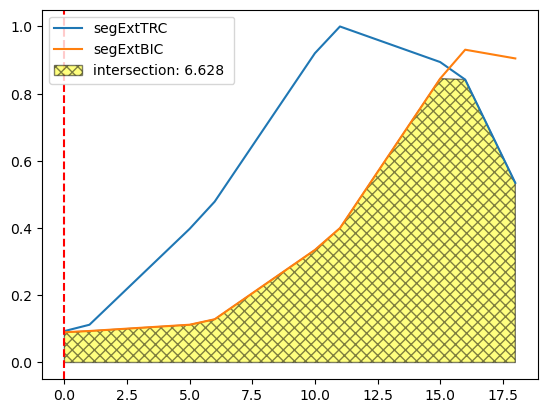

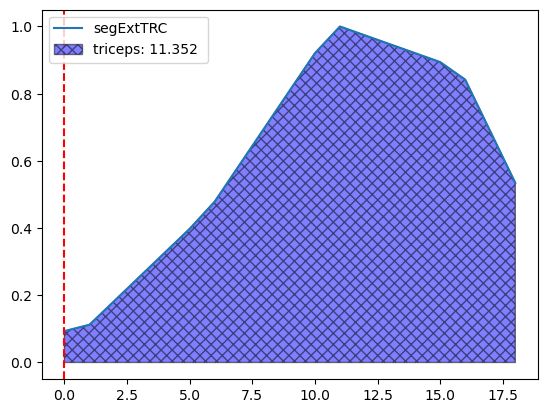

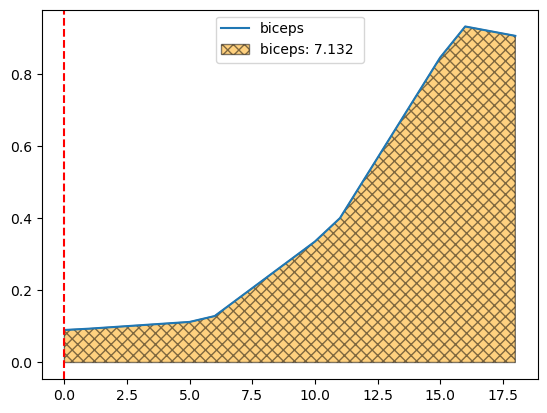

In [75]:
#INTEGRAL FLEX 
areaInter=[]
areaTrc=[]
areaBic=[]




for index, segmento in enumerate(segmentosFlexRMStrcTemp):
    segmentoBic=segmentosFlexRMSbicTemp[index]
   
    plt.figure()
    plt.plot(segmento,label= 'segExtTRC')
    plt.plot(segmentoBic,label= 'segExtBIC')
#plt.fill_between(x, segmentosExtRMStrcTemp[2], segmentosExtRMSbicTemp[2], color='green',
                 #alpha=0.5)
    plt.legend()


    ys = []
    x = np.arange(0,len(segmento),1)
    ys.append(segmento)
    ys.append(segmentoBic)
    y_intersection = np.amin(ys, axis=0)
    area = np.trapz(y_intersection, x)
    fill_poly = plt.fill_between(x, 0, y_intersection, fc='yellow', ec='black', alpha=0.5,
                                 label=f'intersection: {area:.3f} ')
    fill_poly.set_hatch('xxx')
    print(area)
    plt.legend()
    areaInter.append(area)

    plt.axvline(0, linestyle = '--', color = "red")          



    plt.figure()
    plt.plot(segmento,label= 'segExtTRC')
    ys = []
    x = np.arange(0,len(segmento),1)

    area = np.trapz(segmento, x)
    fill_poly = plt.fill_between(x, 0, segmento, fc='blue', ec='black', alpha=0.5,
                             label=f'triceps: {area:.3f} ')
    fill_poly.set_hatch('xxx')
    print(area)
    areaTrc.append(area)
    plt.legend()
    plt.axvline(0, linestyle = '--', color = "red")   
    
    plt.figure()
    plt.plot(segmentoBic,label= 'biceps')
    ys = []
    x = np.arange(0,len(segmentoBic),1)

    area = np.trapz(segmentoBic, x)
    fill_poly = plt.fill_between(x, 0, segmentoBic, fc='orange', ec='black', alpha=0.5,
                                 label=f'biceps: {area:.3f} ')
    fill_poly.set_hatch('xxx')
    print(area)
    areaBic.append(area)
    plt.legend()
    plt.axvline(0, linestyle = '--', color = "red")
    
CoeffsFlex=AlternativeCoefs(areaInter, areaTrc, areaBic)
#print(CoeffsFlex)
print("Media:")
print(stat.mean(CoeffsFlex))
print("Desv. Std.:")
print(stat.stdev(CoeffsFlex))

Valores de Coeficientes de la Aceleracion de la Flexion
Media:
63.32107571901119
Desv. Std.:
11.968676860761514
----
Valores de Coeficientes de la Deceleracion de la Flexion
Media:
48.9170151622077
Desv. Std.:
30.597432871941272
----
Valores de Coeficientes de la Aceleracion de la Extension
Media:
73.73341893512587
Desv. Std.:
10.175702198723004
----
Valores de Coeficientes de la Deceleracion de la Extension
Media:
77.99938600561373
Desv. Std.:
11.629827257584976
----
FINAL


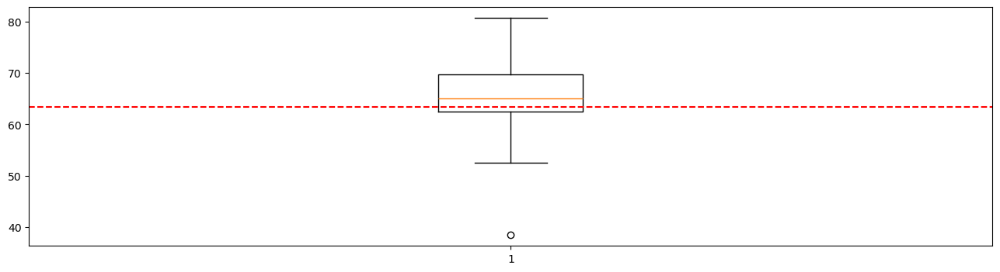

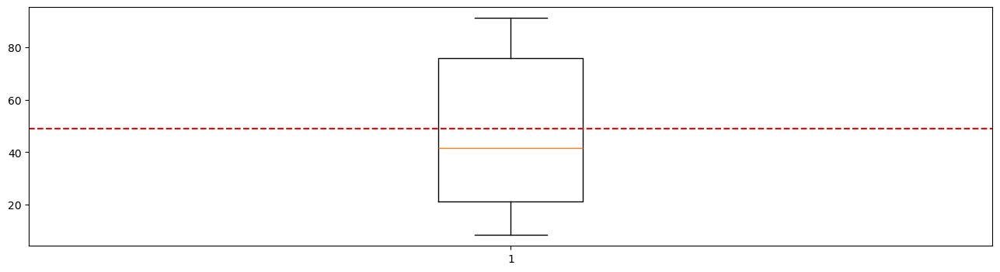

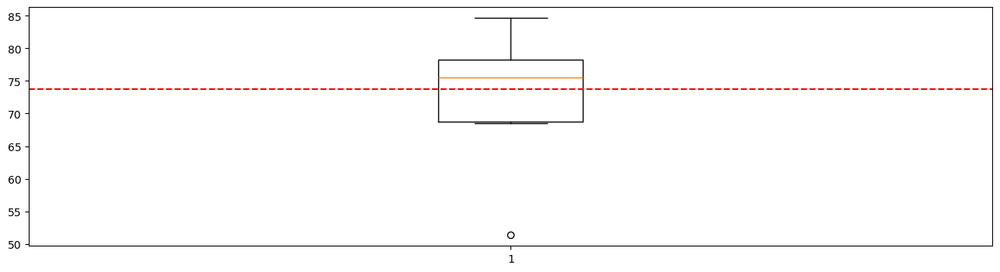

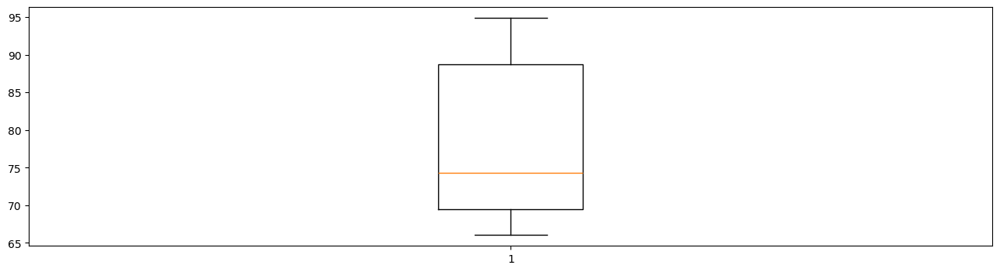

In [76]:


plt.figure(figsize=[16,4])
plt.boxplot(CoeffsFlexAcc)
print("Valores de Coeficientes de la Aceleracion de la Flexion")
print("Media:")
print(stat.mean(CoeffsFlexAcc))
print("Desv. Std.:")
print(stat.stdev(CoeffsFlexAcc))
print("----")
plt.axhline(stat.mean(CoeffsFlexAcc), color = 'red', linestyle = '--', label = 'meanMin')

plt.figure(figsize=[16,4])
plt.boxplot(CoeffsFlexDecc)
print("Valores de Coeficientes de la Deceleracion de la Flexion")
print("Media:")
print(stat.mean(CoeffsFlexDecc))
print("Desv. Std.:")
print(stat.stdev(CoeffsFlexDecc))
print("----")
plt.axhline(stat.mean(CoeffsFlexDecc), color = 'red', linestyle = '--', label = 'meanMin')

plt.figure(figsize=[16,4])
plt.boxplot(CoeffsExtAcc)
print("Valores de Coeficientes de la Aceleracion de la Extension")
print("Media:")
print(stat.mean(CoeffsExtAcc))
print("Desv. Std.:")
print(stat.stdev(CoeffsExtAcc))
print("----")
plt.axhline(stat.mean(CoeffsExtAcc), color = 'red', linestyle = '--', label = 'meanMin')


plt.figure(figsize=[16,4])
plt.boxplot(CoeffsExtDecc)
print("Valores de Coeficientes de la Deceleracion de la Extension")
print("Media:")
print(stat.mean(CoeffsExtDecc))
print("Desv. Std.:")
print(stat.stdev(CoeffsExtDecc))
print("----")

print("FINAL")

kk
[0.06655681741776856, 0.07302826906724916, 0.08532669630602104, 0.09756944597069367, 0.12222736669982925, 0.1527427635840671, 0.19767515196152044, 0.24587272888000689, 0.2938098910396394, 0.32914445058200253, 0.3591332792511988, 0.3797962607787797, 0.38866944273097537, 0.3978253023316697, 0.3911510182565466, 0.376995174121845, 0.3389124541779261, 0.28954777274237675, 0.2666387522297083, 0.33333733675577093, 0.281694097363137, 0.2723820734961874, 0.2899995509526357, 0.3155875355271358, 0.36900163504455724, 0.38603262769339936, 0.3938114119400271, 0.38543187007717017, 0.3718037850115643, 0.3568963875245486, 0.3439466604960195, 0.3202772531448219, 0.29171518230220506, 0.26506422166556554, 0.23685180774300227]


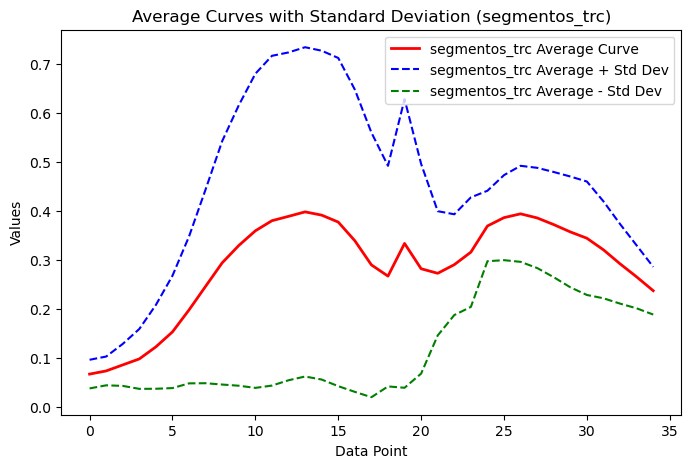

kk
[0.09667653883543213, 0.11016939575450561, 0.12377271795883368, 0.14332647526820555, 0.1723315194847086, 0.20694379310252528, 0.240407218152194, 0.27779477723779955, 0.3130288345503389, 0.3586739353496481, 0.41178060371117137, 0.48417862032113707, 0.5617130278571186, 0.6333574705502479, 0.6866477100363939, 0.7265077424067075, 0.7453458613352755, 0.7531750992293673, 0.7708205250841318, 0.71831236174381, 0.6344674099760812, 0.5476672465307236, 0.5015229894235494, 0.48532923396992306, 0.4567289489352453, 0.4086266348256059, 0.3646511368179455, 0.32925359546800936, 0.29868658834395956, 0.2751043395496909, 0.25624591373313105, 0.23774535539704436, 0.21080516851362407, 0.1835590164740336, 0.15914819592049828]


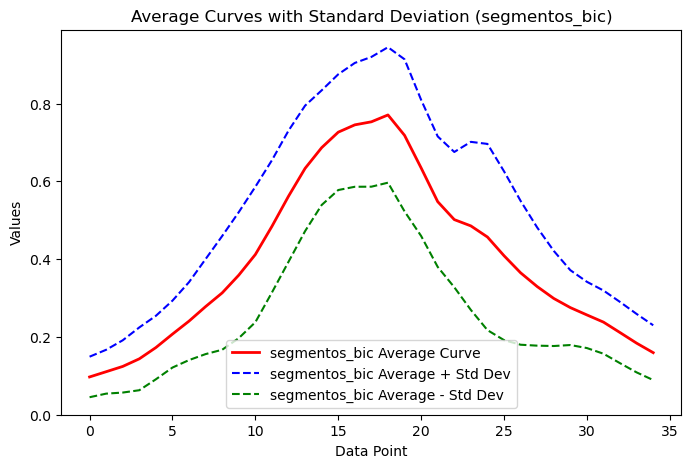

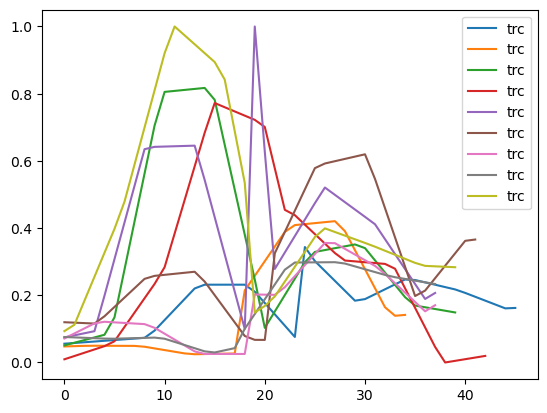

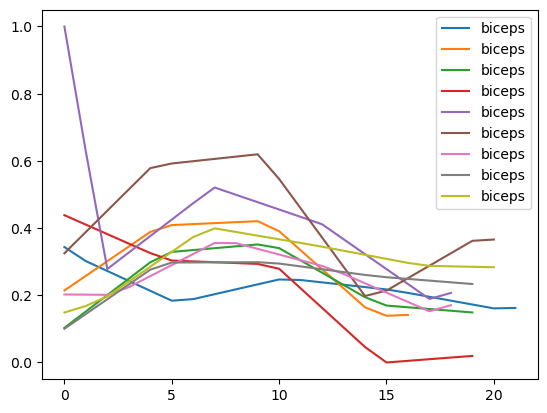

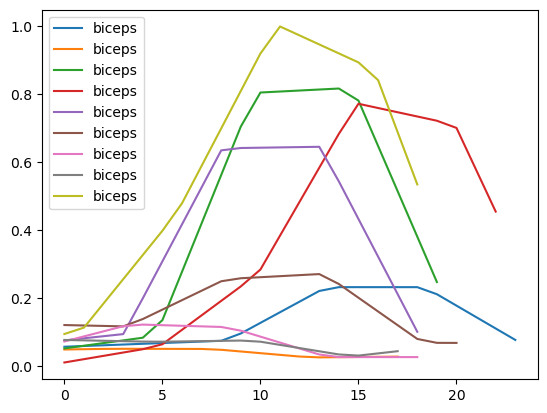

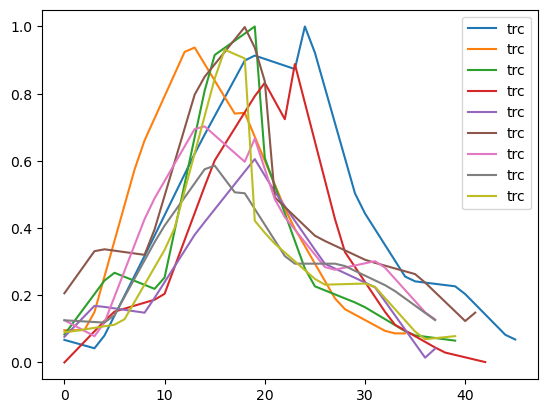

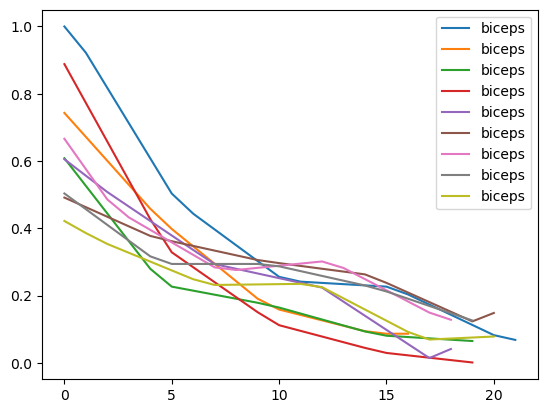

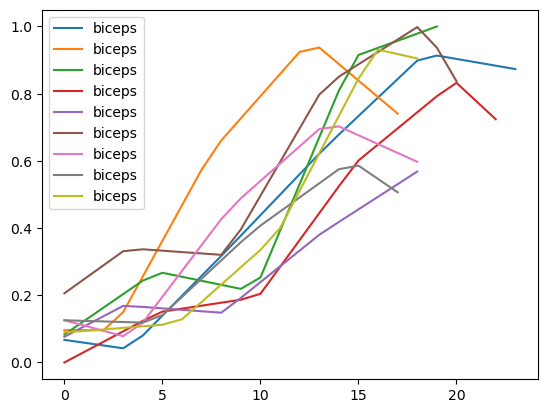

In [77]:


segmentosTrc=concatenate_lists(segmentosFlexRMStrcTemp,segmentosExtRMStrcTemp)
segmentosBic=concatenate_lists(segmentosFlexRMSbicTemp,segmentosExtRMSbicTemp)

plot_average_curve_with_std_EMG(segmentosTrc, 'segmentos_trc')
plot_average_curve_with_std_EMG(segmentosBic, 'segmentos_bic')


plt.figure()
for seg in segmentosTrc:
    plt.plot(seg,label= 'trc')
plt.legend()

plt.figure()
for seg in segmentosExtRMStrcTemp:
    plt.plot(seg,label= 'biceps')
plt.legend()
plt.figure()
for seg in segmentosFlexRMStrcTemp:
    plt.plot(seg,label= 'biceps')

plt.legend()

plt.figure()
for seg in segmentosBic:
    plt.plot(seg,label= 'trc')
plt.legend()

plt.figure()
for seg in segmentosExtRMSbicTemp:
    plt.plot(seg,label= 'biceps')
plt.legend()
plt.figure()
for seg in segmentosFlexRMSbicTemp:
    plt.plot(seg,label= 'biceps')

plt.legend()

In [78]:
#--
#--
#--
#--
#--


24
24
0.4146378890571323
3.177509849802419
11.64785392450898
7
0.44433022808757805
0.73264360652709
7


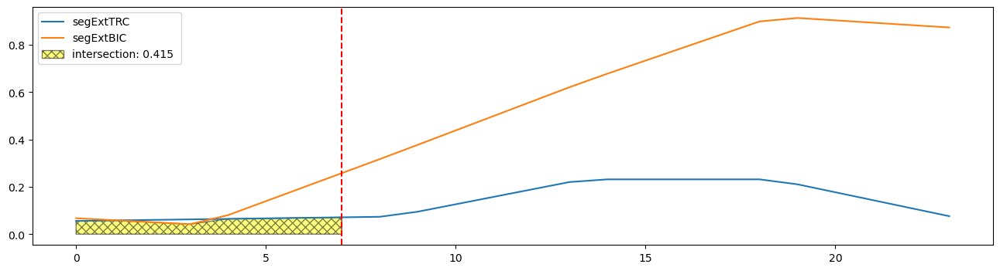

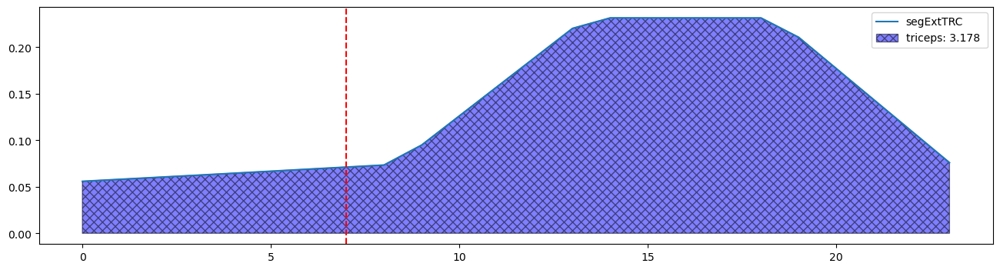

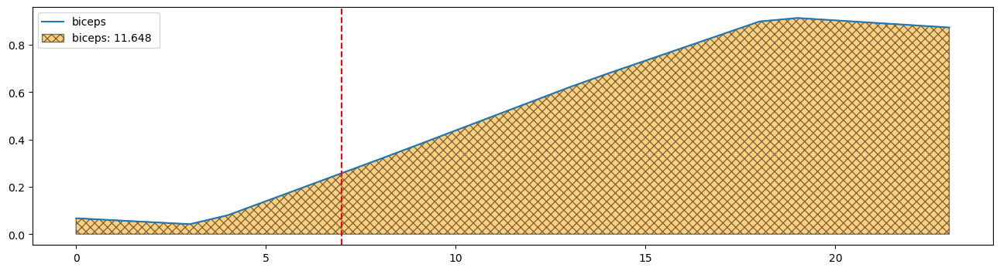

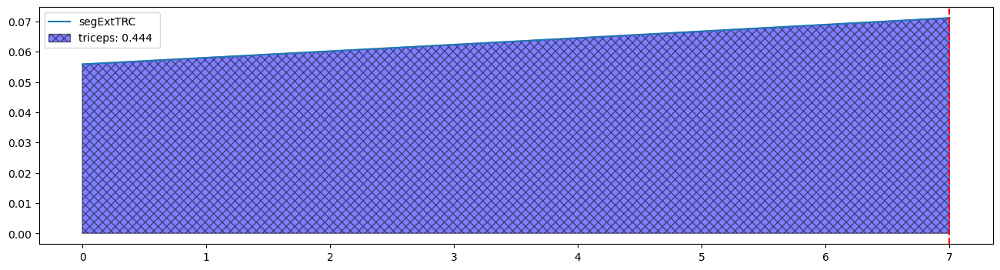

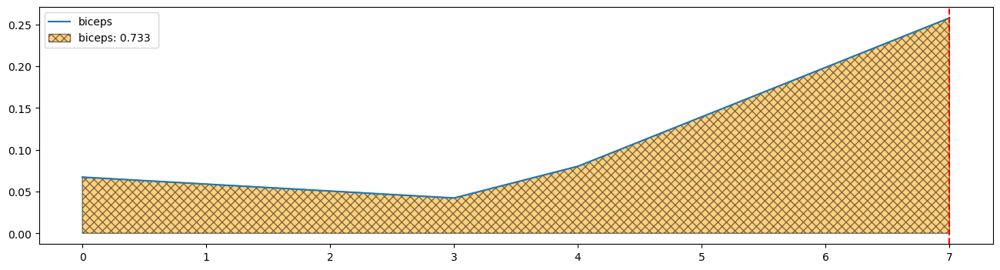

In [79]:
print(len(segmentosFlexRMStrcTemp[0]))
print(len(segmentosFlexRMSbicTemp[0]))
plt.figure(figsize=[16,4])

plt.plot(segmentosFlexRMStrcTemp[0],label= 'segExtTRC')
plt.plot(segmentosFlexRMSbicTemp[0],label= 'segExtBIC')
#plt.fill_between(x, segmentosExtRMStrcTemp[2], segmentosExtRMSbicTemp[2], color='green',
                 #alpha=0.5)
plt.legend()


ys = []
x = np.arange(0,len(segmentosFlexRMSbicTemp[0]),1)
x = np.arange(0,flexPeaks[0]+1,1)
segTrcTemp =segmentosFlexRMStrcTemp[0]
segTrcTemp = segTrcTemp[0:flexPeaks[0]+1]
segBicTemp =segmentosFlexRMSbicTemp[0]
segBicTemp = segBicTemp[0:flexPeaks[0]+1]

ys.append(segTrcTemp)
ys.append(segBicTemp)
y_intersection = np.amin(ys, axis=0)
area = np.trapz(y_intersection, x)
fill_poly = plt.fill_between(x, 0, y_intersection, fc='yellow', ec='black', alpha=0.5,
                             label=f'intersection: {area:.3f} ')
fill_poly.set_hatch('xxx')
print(area)
plt.legend()


plt.axvline(flexPeaks[0], linestyle = '--', color = "red")          


segTrcTemp =segmentosFlexRMStrcTemp[0]
#segTrcTemp = segTrcTemp[0:flexPeaks[0]+1]
segBicTemp =segmentosFlexRMSbicTemp[0]
#segBicTemp = segBicTemp[0:flexPeaks[0]+1]
plt.figure(figsize=[16,4])
plt.plot(segTrcTemp,label= 'segExtTRC')
ys = []
x = np.arange(0,len(segmentosFlexRMSbicTemp[0]),1)

area = np.trapz(segTrcTemp, x)
fill_poly = plt.fill_between(x, 0, segTrcTemp, fc='blue', ec='black', alpha=0.5,
                             label=f'triceps: {area:.3f} ')
fill_poly.set_hatch('xxx')
print(area)
plt.legend()
plt.axvline(flexPeaks[0], linestyle = '--', color = "red")   

plt.figure(figsize=[16,4])
plt.plot(segBicTemp,label= 'biceps')
ys = []
x = np.arange(0,len(segmentosFlexRMSbicTemp[0]),1)

area = np.trapz(segBicTemp, x)
fill_poly = plt.fill_between(x, 0, segBicTemp, fc='orange', ec='black', alpha=0.5,
                             label=f'biceps: {area:.3f} ')
fill_poly.set_hatch('xxx')
print(area)
plt.legend()
plt.axvline(flexPeaks[0], linestyle = '--', color = "red")   

print(flexPeaks[0])

segTrcTemp =segmentosFlexRMStrcTemp[0]
segTrcTemp = segTrcTemp[0:flexPeaks[0]+1]
segBicTemp =segmentosFlexRMSbicTemp[0]
segBicTemp = segBicTemp[0:flexPeaks[0]+1]

plt.figure(figsize=[16,4])
plt.plot(segTrcTemp,label= 'segExtTRC')
ys = []
x = np.arange(0,len(segmentosFlexRMSbicTemp[0]),1)
x = np.arange(0,flexPeaks[0]+1,1)
area = np.trapz(segTrcTemp, x)
fill_poly = plt.fill_between(x, 0, segTrcTemp, fc='blue', ec='black', alpha=0.5,
                             label=f'triceps: {area:.3f} ')
fill_poly.set_hatch('xxx')
print(area)
plt.legend()
plt.axvline(flexPeaks[0], linestyle = '--', color = "red")   

plt.figure(figsize=[16,4])
plt.plot(segBicTemp,label= 'biceps')
ys = []
x = np.arange(0,len(segmentosFlexRMSbicTemp[0]),1)
x = np.arange(0,flexPeaks[0]+1,1)
area = np.trapz(segBicTemp, x)
fill_poly = plt.fill_between(x, 0, segBicTemp, fc='orange', ec='black', alpha=0.5,
                             label=f'biceps: {area:.3f} ')
fill_poly.set_hatch('xxx')
print(area)
plt.legend()
plt.axvline(flexPeaks[0], linestyle = '--', color = "red")   

print(flexPeaks[0])

In [80]:
#--

In [81]:
def integralRMS(segmentosRMSFlexTrc, segmentosRMSFlexBic, segmentosRMSExtTrc, segmentosRMSExtBic):
    
    areaRMSFlexTrc=[]
    areaRMSFlexBic=[]
    areaRMSExtTrc=[]
    areaRMSExtBic=[]
    
    a = 0
    b = 0
    I=0
    x=np.arange(0,100,1)

    for segmento in segmentosRMSFlexTrc:
        x=np.arange(0,len(segmento),1)
        b = len(segmento)
        I = np.trapz(segmento,x)
        areaRMSFlexTrc.append(I)
    for segmento in segmentosRMSFlexBic:
        x=np.arange(0,len(segmento),1)
        b = len(segmento)
        I = np.trapz(segmento,x)
        areaRMSFlexBic.append(I)
    for segmento in segmentosRMSExtTrc:
        x=np.arange(0,len(segmento),1)
        b = len(segmento)
        I = np.trapz(segmento,x)
        areaRMSExtTrc.append(I)
    for segmento in segmentosRMSExtBic:
        x=np.arange(0,len(segmento),1)
        b = len(segmento)
        I = np.trapz(segmento,x)
        areaRMSExtBic.append(I)
        
    return areaRMSFlexTrc, areaRMSFlexBic, areaRMSExtTrc, areaRMSExtBic

In [82]:
areaRMSFlexTrc, areaRMSFlexBic, areaRMSExtTrc, areaRMSExtBic = integralRMS(segmentosFlexRMStrcTemp, segmentosFlexRMSbicTemp,segmentosExtRMStrcTemp, segmentosExtRMSbicTemp)
print(areaRMSFlexTrc)
print(areaRMSFlexBic)
print(len(areaRMSFlexTrc))
print(len(areaRMSFlexBic))
print(len(areaRMSExtTrc))
print(len(areaRMSExtBic))



[3.177509849802419, 0.6692179938197893, 8.909608484090143, 8.541442796420823, 7.157544238030434, 3.5971493814661146, 1.3827439446975185, 1.038181702297872, 11.352287615695817]
[11.64785392450898, 9.838122543533633, 8.933651006721854, 8.432513372708529, 4.847654127805431, 11.573948068757174, 7.617388578189083, 5.636654732095195, 7.132193245176]
9
9
9
9


24
24
0.4146378890571323
3.177509849802419
11.64785392450898
7
0.44433022808757805
0.73264360652709
7


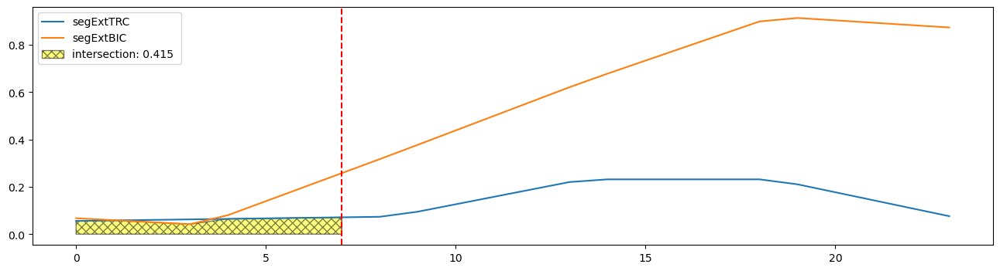

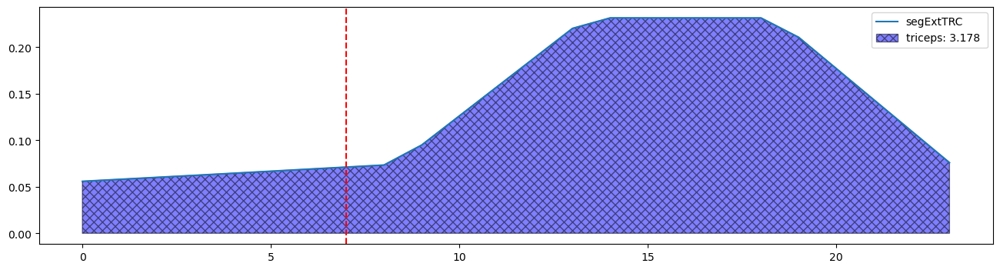

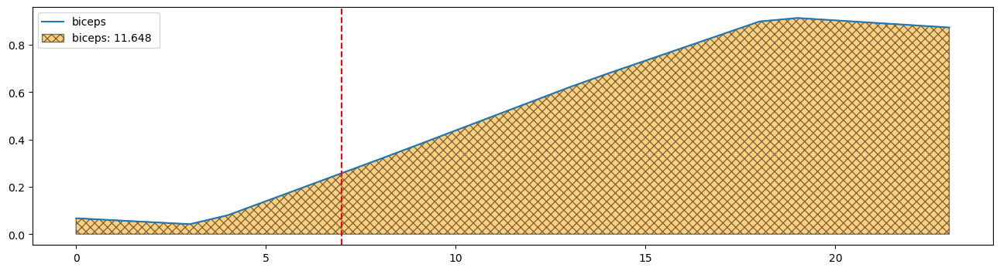

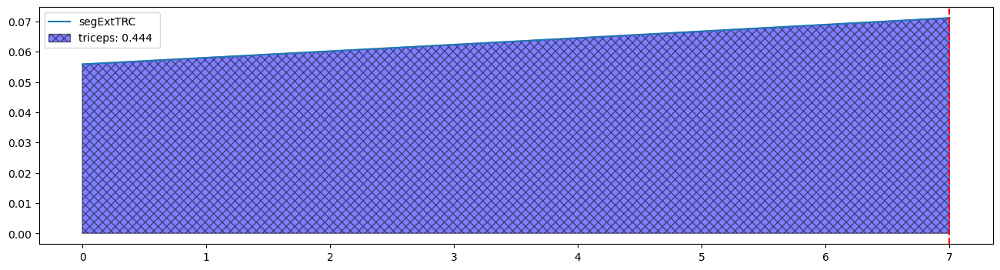

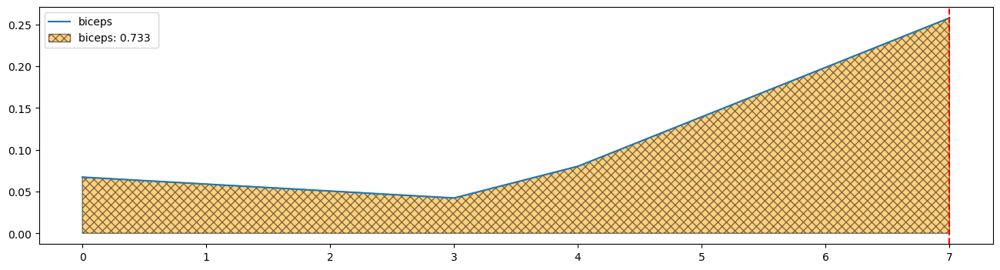

In [83]:
print(len(segmentosFlexRMStrcTemp[0]))
print(len(segmentosFlexRMSbicTemp[0]))
plt.figure(figsize=[16,4])

plt.plot(segmentosFlexRMStrcTemp[0],label= 'segExtTRC')
plt.plot(segmentosFlexRMSbicTemp[0],label= 'segExtBIC')
#plt.fill_between(x, segmentosExtRMStrcTemp[2], segmentosExtRMSbicTemp[2], color='green',
                 #alpha=0.5)
plt.legend()


ys = []
x = np.arange(0,len(segmentosFlexRMSbicTemp[0]),1)
x = np.arange(0,flexPeaks[0]+1,1)
segTrcTemp =segmentosFlexRMStrcTemp[0]
segTrcTemp = segTrcTemp[0:flexPeaks[0]+1]
segBicTemp =segmentosFlexRMSbicTemp[0]
segBicTemp = segBicTemp[0:flexPeaks[0]+1]

ys.append(segTrcTemp)
ys.append(segBicTemp)
y_intersection = np.amin(ys, axis=0)
area = np.trapz(y_intersection, x)
fill_poly = plt.fill_between(x, 0, y_intersection, fc='yellow', ec='black', alpha=0.5,
                             label=f'intersection: {area:.3f} ')
fill_poly.set_hatch('xxx')
print(area)
plt.legend()


plt.axvline(flexPeaks[0], linestyle = '--', color = "red")          


segTrcTemp =segmentosFlexRMStrcTemp[0]
#segTrcTemp = segTrcTemp[0:flexPeaks[0]+1]
segBicTemp =segmentosFlexRMSbicTemp[0]
#segBicTemp = segBicTemp[0:flexPeaks[0]+1]
plt.figure(figsize=[16,4])
plt.plot(segTrcTemp,label= 'segExtTRC')
ys = []
x = np.arange(0,len(segmentosFlexRMSbicTemp[0]),1)

area = np.trapz(segTrcTemp, x)
fill_poly = plt.fill_between(x, 0, segTrcTemp, fc='blue', ec='black', alpha=0.5,
                             label=f'triceps: {area:.3f} ')
fill_poly.set_hatch('xxx')
print(area)
plt.legend()
plt.axvline(flexPeaks[0], linestyle = '--', color = "red")   

plt.figure(figsize=[16,4])
plt.plot(segBicTemp,label= 'biceps')
ys = []
x = np.arange(0,len(segmentosFlexRMSbicTemp[0]),1)

area = np.trapz(segBicTemp, x)
fill_poly = plt.fill_between(x, 0, segBicTemp, fc='orange', ec='black', alpha=0.5,
                             label=f'biceps: {area:.3f} ')
fill_poly.set_hatch('xxx')
print(area)
plt.legend()
plt.axvline(flexPeaks[0], linestyle = '--', color = "red")   

print(flexPeaks[0])

segTrcTemp =segmentosFlexRMStrcTemp[0]
segTrcTemp = segTrcTemp[0:flexPeaks[0]+1]
segBicTemp =segmentosFlexRMSbicTemp[0]
segBicTemp = segBicTemp[0:flexPeaks[0]+1]

plt.figure(figsize=[16,4])
plt.plot(segTrcTemp,label= 'segExtTRC')
ys = []
x = np.arange(0,len(segmentosFlexRMSbicTemp[0]),1)
x = np.arange(0,flexPeaks[0]+1,1)
area = np.trapz(segTrcTemp, x)
fill_poly = plt.fill_between(x, 0, segTrcTemp, fc='blue', ec='black', alpha=0.5,
                             label=f'triceps: {area:.3f} ')
fill_poly.set_hatch('xxx')
print(area)
plt.legend()
plt.axvline(flexPeaks[0], linestyle = '--', color = "red")   

plt.figure(figsize=[16,4])
plt.plot(segBicTemp,label= 'biceps')
ys = []
x = np.arange(0,len(segmentosFlexRMSbicTemp[0]),1)
x = np.arange(0,flexPeaks[0]+1,1)
area = np.trapz(segBicTemp, x)
fill_poly = plt.fill_between(x, 0, segBicTemp, fc='orange', ec='black', alpha=0.5,
                             label=f'biceps: {area:.3f} ')
fill_poly.set_hatch('xxx')
print(area)
plt.legend()
plt.axvline(flexPeaks[0], linestyle = '--', color = "red")   

print(flexPeaks[0])

4.376493603086293
4.6333935738882515
7.730867017655485
9
9
par
cawen
9
[[0.05587076062892216, 0.05802892596494367, 0.060187091300965154, 0.06234525663698666, 0.06453917283637682, 0.06674949926813296, 0.06895982569988912, 0.07117015213164526, 0.07338047856340141, 0.09490301113111912, 0.126245309530682, 0.1575876079302449, 0.1889299063298078, 0.22027220472937026, 0.23153716990890863, 0.23153064977194185, 0.23152412963497496, 0.23151760949800818, 0.23151108936104128, 0.21069324440550288, 0.17701021683484716, 0.14332718926419147, 0.1096441616935358, 0.07596113412288054], [0.04772952713622397, 0.04859670535281267, 0.04946388356940137, 0.04982996361910092, 0.04970608101673112, 0.04958219841436132, 0.049458315811991484, 0.049334433209621685, 0.04686681777755635, 0.041891953271863264, 0.03691708876617029, 0.03194222426047731, 0.02696735975478422, 0.02453659408557643, 0.025084285590790352, 0.025631977096004257, 0.026179668601218165, 0.026727360106432084], [0.050904980359003066, 0.05879434608887

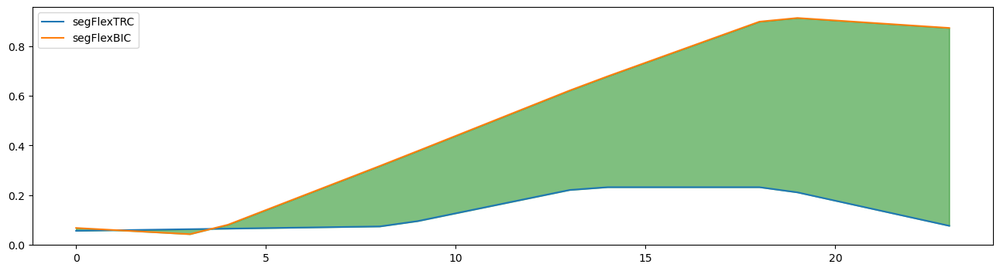

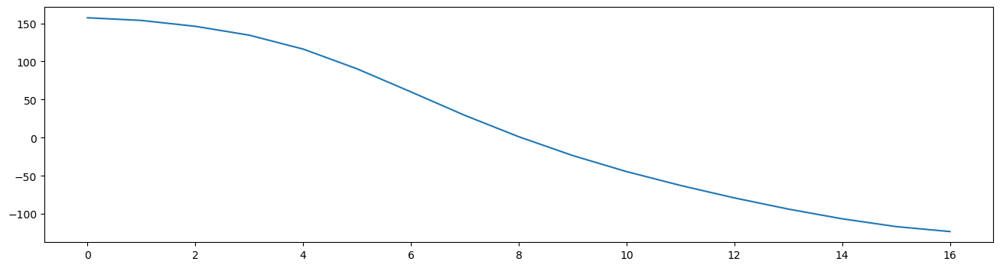

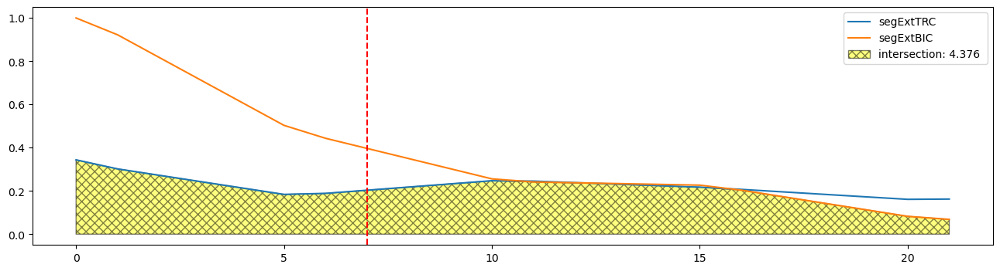

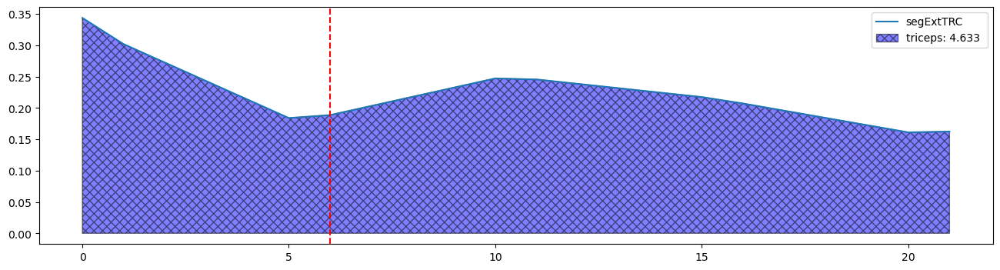

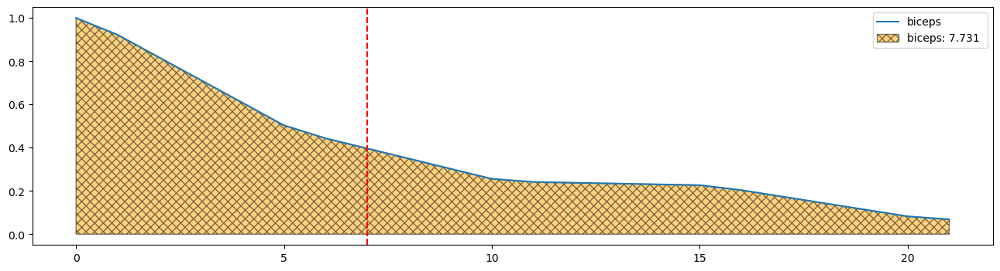

In [84]:
def integralSuperposiciónFlexAcc(segmentosFlexRMStrcTemp, segmentosFlexRMSbicTemp, flexPeaks):
    
    i=0
    x_y_curve1=[]
    x_y_curve2=[]
    area=0
    areasFlexAcc=[]
    segmentosFlexTrcAcc = []
    segmentosFlexBicAcc = []
    
    print("cawen")
    #segmentosFlexRMStrcTemp.pop()
    print(len(flexPeaks))
    print(segmentosFlexRMStrcTemp)
    print(len(segmentosFlexRMStrcTemp))
    for segmento in segmentosFlexRMStrcTemp:
        #print(segmento[0:flexPeaks[i]])
        #segmentosFlexTrcAcc.append(segmento[0:flexPeaks[i]])
        i=i+1
    print("i vale")
    print(i)
    for j in range (0,(i-1),1):
        print(segmento[0:flexPeaks[j]])
        segmentosFlexTrcAcc.append(segmento[0:flexPeaks[j]])
    segmentosFlexTrcAcc.append(segmento[flexPeaks[j]:-1])
    i=0
    
    for segmento in segmentosFlexRMSbicTemp:
        #print(segmento[0:flexPeaks[i]])
        #segmentosFlexTrcAcc.append(segmento[0:flexPeaks[i]])
        i=i+1
    for j in range (0,i-1,1):
        print(segmento[0:flexPeaks[j]])
        segmentosFlexBicAcc.append(segmento[0:flexPeaks[j]])
    segmentosFlexBicAcc.append(segmento[flexPeaks[j]:-1])
    #segmentosFlexRMSbicTemp.pop()
    
    #for segmento in segmentosFlexRMSbicTemp:
        #print(segmento[0:flexPeaks[i]])
        #segmentosFlexBicAcc.append(segmento[0:flexPeaks[i]])
        #i=i+1
    #print(segmentosFlexTrcAcc)    
    

    for j in range (0,len(segmentosFlexRMStrcTemp),1):
        area = calculoArea(segmentosFlexTrcAcc[j], segmentosFlexBicAcc[j])
        areasFlexAcc.append(area)
    
    return areasFlexAcc
def integralSuperposiciónFlexDecc(segmentosFlexRMStrcTemp, segmentosFlexRMSbicTemp, flexPeaks):
    
    i=0
    x_y_curve1=[]
    x_y_curve2=[]
    area=0
    areasFlexDecc=[]
    segmentosFlexTrcDecc = []
    segmentosFlexBicDecc = []
    
    i=0
    #segmentosFlexRMStrcTemp.pop()
    for segmento in segmentosFlexRMStrcTemp:
        #print(segmento[0:flexPeaks[i]])
        segmentosFlexTrcDecc.append(segmento[flexPeaks[i]:-1])
        i=i+1
    i=0
    #segmentosFlexRMSbicTemp.pop()
    for segmento in segmentosFlexRMSbicTemp:
        #print(segmento[0:flexPeaks[i]])
        segmentosFlexBicDecc.append(segmento[flexPeaks[i]:-1])
        i=i+1
    #print(segmentosFlexTrcAcc)    
    

    for j in range (0,len(segmentosFlexRMStrcTemp),1):
        area = calculoArea(segmentosFlexTrcDecc[j], segmentosFlexBicDecc[j])
        areasFlexDecc.append(area)
    
    return areasFlexDecc
def integralSuperposiciónExtAcc(segmentosExtRMStrcTemp, segmentosExtRMSbicTemp, extPeaks):
    
    i=0
    x_y_curve1=[]
    x_y_curve2=[]
    area=0
    areasExtAcc=[]
    segmentosExtTrcAcc = []
    segmentosExtBicAcc = []
    
    i=0
    print(len(extPeaks))   

    print(len(segmentosExtRMStrcTemp))
    for segmento in segmentosExtRMStrcTemp:
        #print(segmento[0:flexPeaks[i]])
        segmentosExtTrcAcc.append(segmento[0:extPeaks[i]])
        i=i+1
    i=0

    for segmento in segmentosExtRMSbicTemp:
        #print(segmento[0:flexPeaks[i]])
        segmentosExtBicAcc.append(segmento[0:extPeaks[i]])
        i=i+1
    #print(segmentosFlexTrcAcc)    
    

    for j in range (0,len(segmentosExtRMStrcTemp),1):
        area = calculoArea(segmentosExtTrcAcc[j], segmentosExtBicAcc[j])
        areasExtAcc.append(area)
    
    return areasExtAcc
def integralSuperposiciónExtDecc(segmentosExtRMStrcTemp, segmentosExtRMSbicTemp, extPeaks):
    
    i=0
    x_y_curve1=[]
    x_y_curve2=[]
    area=0
    areasExtDecc=[]
    segmentosExtTrcDecc = []
    segmentosExtBicDecc = []
    
    i=0

    for segmento in segmentosExtRMStrcTemp:
        #print(segmento[0:flexPeaks[i]])
        segmentosExtTrcDecc.append(segmento[extPeaks[i]:-1])
        i=i+1
    i=0

    for segmento in segmentosExtRMSbicTemp:
        #print(segmento[0:flexPeaks[i]])
        segmentosExtBicDecc.append(segmento[extPeaks[i]:-1])
        i=i+1
    #print(segmentosFlexTrcAcc)    
    

    for j in range (0,len(segmentosExtRMStrcTemp),1):
        area = calculoArea(segmentosExtTrcDecc[j], segmentosExtBicDecc[j])
        areasExtDecc.append(area)
    
    return areasExtDecc



x = np.arange(0,len(segmentosFlexRMStrcTemp[0]),1)
plt.figure(figsize=[16,4])

plt.plot(segmentosFlexRMStrcTemp[0],label= 'segFlexTRC')
plt.plot(segmentosFlexRMSbicTemp[0],label= 'segFlexBIC')
plt.fill_between(x, segmentosFlexRMStrcTemp[0], segmentosFlexRMSbicTemp[0], color='green',
                 alpha=0.5)
plt.legend()

x = np.arange(0,len(segmentosExtRMStrcTemp[0]),1)

plt.figure(figsize=[16,4])

plt.plot(segmentosExtTemp[0],label= 'segExtTRC')


plt.figure(figsize=[16,4])

plt.plot(segmentosExtRMStrcTemp[0],label= 'segExtTRC')
plt.plot(segmentosExtRMSbicTemp[0],label= 'segExtBIC')
#plt.fill_between(x, segmentosExtRMStrcTemp[2], segmentosExtRMSbicTemp[2], color='green',
                 #alpha=0.5)
plt.legend()


ys = []
x = np.arange(0,len(segmentosExtRMStrcTemp[0]),1)
ys.append(segmentosExtRMStrcTemp[0])
ys.append( segmentosExtRMSbicTemp[0])
y_intersection = np.amin(ys, axis=0)
area = np.trapz(y_intersection, x)
fill_poly = plt.fill_between(x, 0, y_intersection, fc='yellow', ec='black', alpha=0.5,
                             label=f'intersection: {area:.3f} ')
fill_poly.set_hatch('xxx')
print(area)
plt.legend()


plt.axvline(flexPeaks[0], linestyle = '--', color = "red")          



plt.figure(figsize=[16,4])
plt.plot(segmentosExtRMStrcTemp[0],label= 'segExtTRC')
ys = []
x = np.arange(0,len(segmentosExtRMStrcTemp[0]),1)

area = np.trapz(segmentosExtRMStrcTemp[0], x)
fill_poly = plt.fill_between(x, 0, segmentosExtRMStrcTemp[0], fc='blue', ec='black', alpha=0.5,
                             label=f'triceps: {area:.3f} ')
fill_poly.set_hatch('xxx')
print(area)
plt.legend()
plt.axvline(flexPeaks[2], linestyle = '--', color = "red")   

plt.figure(figsize=[16,4])
plt.plot(segmentosExtRMSbicTemp[0],label= 'biceps')
ys = []
x = np.arange(0,len(segmentosExtRMSbicTemp[0]),1)

area = np.trapz(segmentosExtRMSbicTemp[0], x)
fill_poly = plt.fill_between(x, 0, segmentosExtRMSbicTemp[0], fc='orange', ec='black', alpha=0.5,
                             label=f'biceps: {area:.3f} ')
fill_poly.set_hatch('xxx')
print(area)
plt.legend()
plt.axvline(flexPeaks[0], linestyle = '--', color = "red")   




#segmentosFlexTriceps.pop(0)
#segmentosFlexBiceps.pop(0)
#segmentosFlexTriceps.pop(0)
#segmentosFlexBiceps.pop(0)
#segmentosExtTriceps.pop(0)
#segmentosExtBiceps.pop(0)
#segmentosExtTriceps.pop(0)
#segmentosExtBiceps.pop(0)

print(len(segmentosFlexTriceps))
print(len(flexPeaks))
print("par")
areasFlexAcc = integralSuperposiciónFlexAcc(segmentosFlexRMStrcTemp, segmentosFlexRMSbicTemp, flexPeaks)
#print(areasFlexAcc)
print("---------------------------------")
areasFlexDecc = integralSuperposiciónFlexDecc(segmentosFlexRMStrcTemp, segmentosFlexRMSbicTemp, flexPeaks)
print(areasFlexDecc)
print("---------------------------------")
print(len(segmentosExtTriceps))
print(len(segmentosExtBiceps))
print(len(extPeaks))
print("kk")
areasExtAcc = integralSuperposiciónExtAcc(segmentosExtRMStrcTemp, segmentosExtRMSbicTemp, extPeaks)
#print(areasExtAcc)
print("---------------------------------")
areasExtDecc = integralSuperposiciónExtDecc(segmentosExtRMStrcTemp, segmentosExtRMSbicTemp, extPeaks)
#print(areasExtDecc)

In [85]:
def sinergiaMuscular (areaFlex, areaExt):
    porcentajeFlex = 0
    porcentajeExt = 0
    
    porcentajeFlex = ((areaFlex)/(areaFlex+areaExt))*100 # Cálculo del porcentaje de activación durante la fase de flexión
    porcentajeExt = ((areaExt)/(areaFlex+areaExt))*100  # Cálculo del porcentaje de activación durante la fase de extensión
    
    return porcentajeFlex,porcentajeExt


porcentajeFlexBic = []
porcentajeFlexTrc = []
porcentajeExtBic = []
porcentajeExtTrc = []

for i in range (0, len(areaRMSFlexTrc)): # Bucle para calcular sinergias del TRÍCEPS (flexión y extensión)
    porcentajeFlex, porcentajeExt=sinergiaMuscular(areaRMSFlexTrc[i],areaRMSExtTrc[i])
    porcentajeFlexTrc.append(porcentajeFlex) # % de activación del tríceps durante flexión
    porcentajeExtTrc.append(porcentajeExt)  # % de activación del tríceps durante extensión
    
for i in range (0, len(areaRMSFlexBic)): # Bucle para calcular sinergias del BÍCEPS (flexión y extensión)
    porcentajeFlex, porcentajeExt=sinergiaMuscular(areaRMSFlexBic[i],areaRMSExtBic[i])
    porcentajeFlexBic.append(porcentajeFlex)  # % de activación del bíceps durante flexión
    porcentajeExtBic.append(porcentajeExt) # % de activación del bíceps durante extesnión


# Cálculo de promedios globales de sinergia para cada músculo y fase
porcentajeAVGFlexTrc=stat.mean(porcentajeFlexTrc)
porcentajeAVGExtTrc=stat.mean(porcentajeExtTrc)

porcentajeAVGFlexBic=stat.mean(porcentajeFlexBic)
porcentajeAVGExtBic=stat.mean(porcentajeExtBic)

print("SINERGIAS")

# Tríceps durante FLEXIÓN
print(stat.mean(porcentajeFlexTrc)) # % de activación del tríceps durante la fase de flexión
print(stat.stdev(porcentajeFlexTrc)) # desviación estándar de ese valor
print("------------")

# Tríceps durante EXTENSIÓN
print(stat.mean(porcentajeExtTrc))  # % de activación del tríceps durante la fase de extensión
print(stat.stdev(porcentajeExtTrc)) # desviación estándar
print("------------")

# Bíceps durante FLEXIÓN
print(stat.mean(porcentajeFlexBic))  # % de activación del bíceps durante la fase de flexión
print(stat.stdev(porcentajeFlexBic))
print("------------")

# Bíceps durante EXTENSIÓN
print(stat.mean(porcentajeExtBic))
print(stat.stdev(porcentajeExtBic))
print("------------")




SINERGIAS
41.09435830288515
21.896283267428306
------------
58.905641697114845
21.896283267428306
------------
60.81077401419775
7.118640345392871
------------
39.18922598580225
7.118640345392875
------------


In [86]:
data_row_finalCSV['SynergyBiceps'] = (float(stat.mean(porcentajeFlexBic)) , float(stat.stdev(porcentajeFlexBic)), float(stat.mean(porcentajeExtBic)) , float(stat.stdev(porcentajeExtBic)))
data_row_finalCSV['SynergyTriceps'] = (float(stat.mean(porcentajeFlexTrc)) , float(stat.stdev(porcentajeFlexTrc)), float(stat.mean(porcentajeExtTrc)) , float(stat.stdev(porcentajeExtTrc)))

In [87]:
def integraciónParaCoeficienteCoactivaciónFlex (areasFlexAcc, areasFlexDecc, areaRMSFlexTrc, areaRMSFlexBic):
    CoeffsFlexAcc = []
    CoeffsFlexDecc = []
    coeff=0
    print( len(areasFlexAcc))
    print( len(areaRMSFlexTrc))
    print( len(areaRMSFlexBic))
    for i in range (0, len(areasFlexAcc)-1,1):
        print(i)
        coeff = 2*((areasFlexAcc[i])/(areaRMSFlexTrc[i]+areaRMSFlexBic[i]))*100
        print("outer")
        print(areasFlexAcc[i])
        print(areaRMSFlexTrc[i])
        print(areaRMSFlexBic[i])
        CoeffsFlexAcc.append(coeff)
        coeff = 2*((areasFlexDecc[i])/(areaRMSFlexTrc[i]+areaRMSFlexBic[i]))*100
        print("outer2")
        print(areasFlexDecc[i])
        print(areaRMSFlexTrc[i])
        print(areaRMSFlexBic[i])
        CoeffsFlexDecc.append(coeff)
    
    return CoeffsFlexAcc, CoeffsFlexDecc

In [88]:
def integraciónParaCoeficienteCoactivaciónExt (areasExtAcc, areasExtDecc, areaRMSExtTrc, areaRMSExtBic):
    CoeffsExtAcc = []
    CoeffsExtDecc = []
    coeff=0
    print( len(areasExtAcc))
    print( len(areaRMSExtTrc))
    print( len(areaRMSExtBic))
    for i in range (0, len(areasExtAcc)-1,1):
        coeff = 2*((areasExtAcc[i])/(areaRMSExtTrc[i]+areaRMSExtBic[i]))*100
        CoeffsExtAcc.append(coeff)
        coeff = 2*((areasExtDecc[i])/(areaRMSExtTrc[i]+areaRMSExtBic[i]))*100
        CoeffsExtDecc.append(coeff)
    
    return CoeffsExtAcc, CoeffsExtDecc

In [89]:
CoeffsFlexAcc, CoeffsFlexDecc = integraciónParaCoeficienteCoactivaciónFlex (areasFlexAcc, areasFlexDecc, areaRMSFlexTrc, areaRMSFlexBic)
#CoeffsFlexAcc.pop()
#CoeffsFlexDecc.pop()
#print(areasFlexAcc)
#print(areaRMSFlexTrc)
#print(areaRMSFlexBic)
#print(CoeffsFlexAcc)


CoeffsExtAcc, CoeffsExtDecc = integraciónParaCoeficienteCoactivaciónExt (areasExtAcc, areasExtDecc, areaRMSExtTrc, areaRMSExtBic)
#print(areasExtAcc)
#print(areaRMSExtTrc)
#print(areaRMSExtBic)

#print(CoeffsExtAcc)

#print("medias")
#print(stat.mean(areasExtAcc))
#print(stat.mean(areaRMSExtTrc))
#print(stat.mean(areaRMSExtBic))

9
9
9
0
outer
0.6244960471430715
3.177509849802419
11.64785392450898
outer2
2.6403769738066325
3.177509849802419
11.64785392450898
1
outer
0.5039934712856081
0.6692179938197893
9.838122543533633
outer2
0.346991726019449
0.6692179938197893
9.838122543533633
2
outer
0.5039934712856081
8.909608484090143
8.933651006721854
outer2
5.60980305713206
8.909608484090143
8.933651006721854
3
outer
1.2425212769533558
8.541442796420823
8.432513372708529
outer2
6.112793354368931
8.541442796420823
8.432513372708529
4
outer
0.7789222384593265
7.157544238030434
4.847654127805431
outer2
2.7820372357576932
7.157544238030434
4.847654127805431
5
outer
0.9849306483960876
3.5971493814661146
11.573948068757174
outer2
2.023522602897288
3.5971493814661146
11.573948068757174
6
outer
0.9849306483960876
1.3827439446975185
7.617388578189083
outer2
0.37777640618841607
1.3827439446975185
7.617388578189083
7
outer
0.6244960471430715
1.038181702297872
5.636654732095195
outer2
0.49087975695273695
1.038181702297872
5.63665

13.10837589846003
[8.424697790217667, 9.5931690705925, 5.649118890470979, 14.640326210022122, 12.976415961205051, 12.984303233535572, 21.887025460824923, 18.71195057081143]
5.355617227751138
----
34.1569025690497
24.688718336255324
----
28.49285139270138
8.65597124588571
----
41.11393028221808
11.481607905161807
----
lens
8
8
8
8


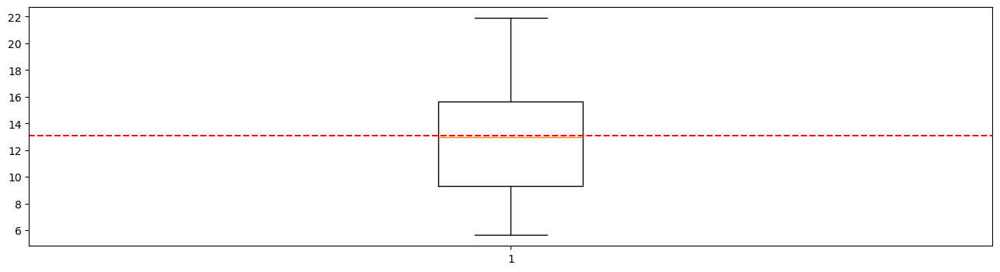

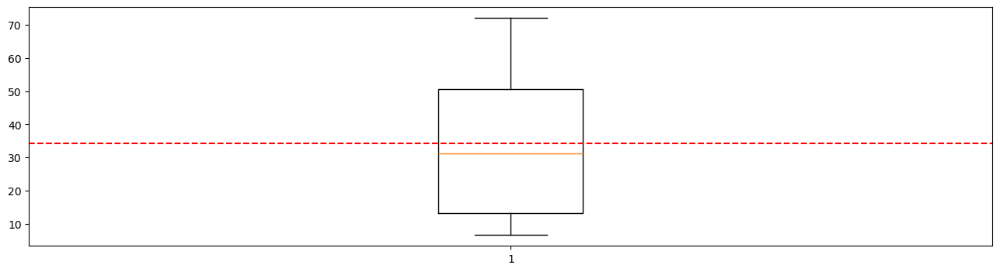

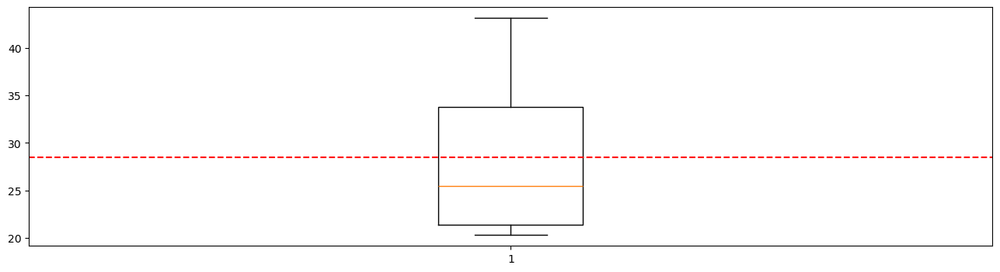

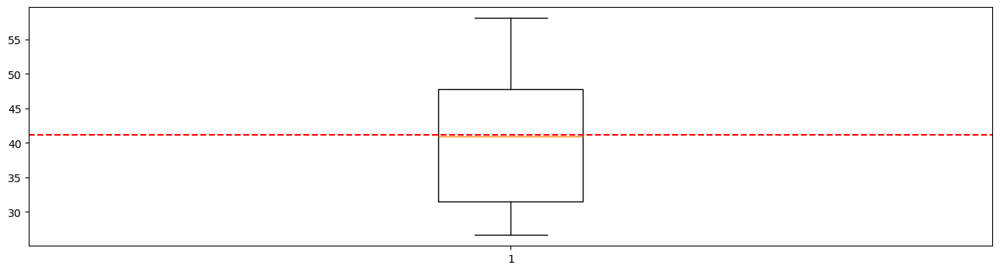

<Figure size 1600x400 with 0 Axes>

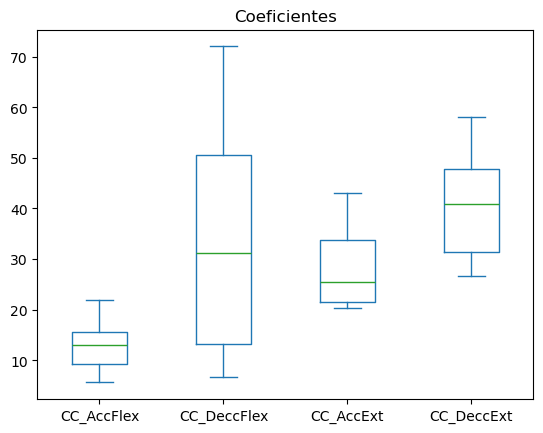

In [90]:


plt.figure(figsize=[16,4])
plt.boxplot(CoeffsFlexAcc)
print(stat.mean(CoeffsFlexAcc))
print(CoeffsFlexAcc)
print(stat.stdev(CoeffsFlexAcc))
print("----")
plt.axhline(stat.mean(CoeffsFlexAcc), color = 'red', linestyle = '--', label = 'meanMin')

plt.figure(figsize=[16,4])
plt.boxplot(CoeffsFlexDecc)
print(stat.mean(CoeffsFlexDecc))
print(stat.stdev(CoeffsFlexDecc))
print("----")
plt.axhline(stat.mean(CoeffsFlexDecc), color = 'red', linestyle = '--', label = 'meanMin')

plt.figure(figsize=[16,4])
plt.boxplot(CoeffsExtAcc)
print(stat.mean(CoeffsExtAcc))
print(stat.stdev(CoeffsExtAcc))
print("----")
plt.axhline(stat.mean(CoeffsExtAcc), color = 'red', linestyle = '--', label = 'meanMin')


plt.figure(figsize=[16,4])
plt.boxplot(CoeffsExtDecc)
print(stat.mean(CoeffsExtDecc))
print(stat.stdev(CoeffsExtDecc))
print("----")
plt.axhline(stat.mean(CoeffsExtDecc), color = 'red', linestyle = '--', label = 'meanMin')

plt.figure(figsize=[16,4])
print("lens")
print(len(CoeffsFlexAcc))
print(len(CoeffsFlexDecc))
print(len(CoeffsExtAcc))
print(len(CoeffsExtDecc))

data = pd.DataFrame({"CC_AccFlex": CoeffsFlexAcc, "CC_DeccFlex": CoeffsFlexDecc,"CC_AccExt": CoeffsExtAcc, "CC_DeccExt": CoeffsExtDecc})

# Plot the dataframe
ax = data[['CC_AccFlex', 'CC_DeccFlex','CC_AccExt','CC_DeccExt']].plot(kind='box', title='Coeficientes')
 
# Display the plot

plt.show()

In [91]:

data_row_finalCSV['CCaccFlex'] = (float(stat.mean(CoeffsFlexAcc)) , stat.stdev(CoeffsFlexAcc))
data_row_finalCSV['CCdeccFlex'] = (float(stat.mean(CoeffsFlexDecc)) , stat.stdev(CoeffsFlexDecc))
data_row_finalCSV['CCaccExt'] = (float(stat.mean(CoeffsExtAcc)) , stat.stdev(CoeffsExtAcc))
data_row_finalCSV['CCdeccExt'] = (float(stat.mean(CoeffsExtDecc)) , stat.stdev(CoeffsExtDecc))


89
89
447
447
[ 45  91 126 166 209 247 289 327 365 406]
Extension Segments (Peak to Valley): [(45.0, 67.0), (91.0, 108.0), (126.0, 146.0), (166.0, 186.0), (209.0, 228.0), (247.0, 268.0), (289.0, 308.0), (327.0, 347.0), (365.0, 386.0)]
Flexion Segments (Valley to Peak): [(67.0, 91.0), (108.0, 126.0), (146.0, 166.0), (186.0, 209.0), (228.0, 247.0), (268.0, 289.0), (308.0, 327.0), (347.0, 365.0), (386.0, 406.0)]
Average distance between biceps peak and refined secondary triceps peaks: -0.017474747474747473 seconds
List of distances between t_peaks inside flexion and the closest b_peak: [5, 10, 5, 5, 5, 5, 10, 6, 5]
Average distance: 6.222222222222222
[ 45  86 121 165 206 246 286 322 362 402 436]
[ 26  40  55  81 100 111 135 160 201 216 241 256 267 281 296 312 336 356
 372 397 412 436]
[ 45  91 126 166 209 247 289 327 365 406]
[67, 108, 146, 186, 228, 268, 308, 347, 386, 427, 444]


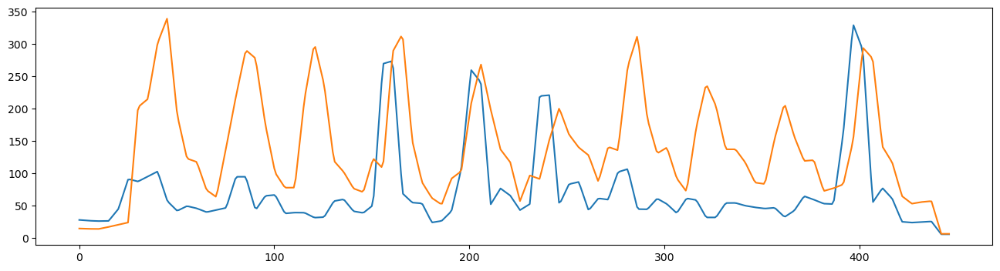

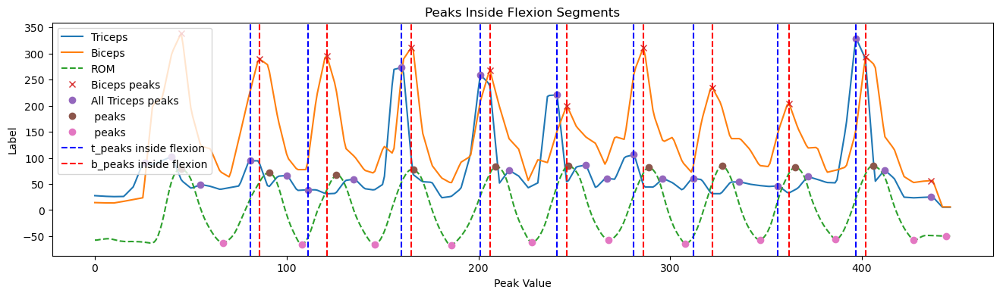

In [92]:
import numpy as np
import scipy.signal as signal
import matplotlib.pyplot as plt
import csv

extension=[]
flexion=[]

def ajusteRMSInterp(length, tricepsEMG, bicepsEMG):
    tricepsEMGad=[]
    bicepsEMGad=[]

    print(len(tricepsEMG))
    print(len(bicepsEMG))
    trc = np.interp(
    np.linspace(0.0, 1.0, length, endpoint=False),  # where to interpret
    np.linspace(0.0, 1.0, len(tricepsEMG), endpoint=False),  # known positions
    tricepsEMG,  # known data points
    )

    tricepsEMGad=trc
    
    print(len(trc))
    
    bic = np.interp(
    np.linspace(0.0, 1.0, length, endpoint=False),  # where to interpret
    np.linspace(0.0, 1.0, len(bicepsEMG), endpoint=False),  # known positions
    bicepsEMG,  # known data points
    )
    
    bicepsEMGad=bic
    print(len(bic))
    return tricepsEMGad, bicepsEMGad
    

def detect_phases(rom_signal, fs):
    rom_signal = np.array(rom_signal, dtype=float)
    # Detect start of oscillations
    window_size = 20
    std_dev = np.array([np.std(rom_signal[i:i + window_size]) for i in range(len(rom_signal) - window_size)])
    start_index = np.argmax(std_dev > 20)

    # Detect peaks
    peaks, _ = sig.find_peaks(rom_signal[start_index:], height=45, distance=25)
    peaks += start_index  # Adjust indices

    #peaks, _ = signal.find_peaks(rom_signal)
    valleys, _ = signal.find_peaks(-rom_signal)

    #Start phases from the first detected peak
    first_peak = peaks[0]
    # Remove valleys before first peak
    valleys = [v for v in valleys if v >= first_peak]
    print(peaks)
    #extension = []  # Peak to Valley
    #flexion = []  # Valley to Peak
    
    peak_idx, valley_idx = 0, 0
    while peak_idx < len(peaks) and valley_idx < len(valleys):
        if peaks[peak_idx] < valleys[valley_idx]:
            if valley_idx > 0:  # Ensure there's a previous valley to pair with
                flexion.append((float(valleys[valley_idx - 1]), float(peaks[peak_idx])))
            peak_idx += 1
        else:
            extension.append((float(peaks[peak_idx - 1]), float(valleys[valley_idx])))
            valley_idx += 1

    print("Extension Segments (Peak to Valley):", extension)
    print("Flexion Segments (Valley to Peak):", flexion)
    return extension, flexion, peaks, valleys

def find_secondary_triceps_peaks_refined(bicepsEMG, tricepsEMG, rom_signal, fs):

    
    #min_peak_height_biceps = 0.5 * np.max(biceps_signal)
    #min_peak_height_triceps = 0.5 * np.max(triceps_signal)
    
    biceps_peaks, _ = signal.find_peaks(bicepsEMG, height=20, distance = 25)
    triceps_peaks, _ = signal.find_peaks(tricepsEMG, height=20, distance = 5)
    
    extension_phases, flexion_phases, peaks, valleys = detect_phases(rom_signal, fs)
    
    secondary_triceps_peaks = []
    all_secondary_distances = []
    
    for b_peak in biceps_peaks:
        for ext_start, ext_end in extension_phases:
            triceps_in_ext = triceps_peaks[(triceps_peaks >= ext_start) & (triceps_peaks <= ext_end)]
            for sec_peak in triceps_in_ext:
                secondary_triceps_peaks.append(sec_peak)
                all_secondary_distances.append(sec_peak - b_peak)
    
    avg_distance = (np.mean(all_secondary_distances) / fs) if all_secondary_distances else None
    
    return avg_distance, biceps_peaks, triceps_peaks, secondary_triceps_peaks, peaks, valleys

if __name__ == "__main__":
    fs = 1000  # Sampling frequency in Hz

    tricepsEMG = []
    bicepsEMG = []
    csvangles = second_column[0:-1] 
    rom_signal = csvangles
    
    with open(basic, newline='') as csvfile:
        csvreader = csv.reader(csvfile, delimiter=';', quotechar='|')
        next(csvreader)
        for row in csvreader:
            try:
                triceps_value = float(row[7].replace(",", "."))
                biceps_value = float(row[6].replace(",", "."))
                tricepsEMG.append(triceps_value)
                bicepsEMG.append(biceps_value)
            except (ValueError, IndexError):
                pass
    length=len(rom_signal)
    tricepsEMGad, bicepsEMGad= ajusteRMSInterp(length, tricepsEMG, bicepsEMG)
    plt.figure(figsize=[16,4])
    plt.plot(tricepsEMGad, label='Triceps')
    plt.plot(bicepsEMGad, label='Biceps')

    avg_dist, b_peaks, t_peaks, secondary_peaks, peaks, valleys = find_secondary_triceps_peaks_refined(bicepsEMGad, tricepsEMGad, rom_signal, fs)

    print(f"Average distance between biceps peak and refined secondary triceps peaks: {avg_dist} seconds")

    plt.figure(figsize=[16,4])
    plt.plot(tricepsEMGad, label='Triceps')
    plt.plot(bicepsEMGad, label='Biceps')
    plt.plot(rom_signal, label='ROM', linestyle='dashed')
    plt.plot(b_peaks, np.array(bicepsEMGad)[b_peaks], "x", label='Biceps peaks')
    plt.plot(t_peaks, np.array(tricepsEMGad)[t_peaks], "o", label='All Triceps peaks')
    plt.plot(peaks, np.array(rom_signal)[peaks], "o", label=' peaks')
    plt.plot(valleys, np.array(rom_signal)[valleys], "o", label=' peaks')
    #plt.plot(secondary_peaks, np.array(tricepsEMG)[secondary_peaks], 'r*', markersize=10, label='Refined Secondary Triceps peaks')

    def is_in_segment(x, n1, n2):
        if n1 > n2:
            n1, n2 = n2, n1  # Ensure n1 is the smaller value and n2 is the larger one
        return n1 <= x <= n2 
        
    def check_peaks_in_segments(t_peaks, extension):
        peaks_in_segment = []  # List to store peaks inside a segment
    
        for peak in t_peaks:
            x = peak
            inside_segment = False  # Flag to check if the peak is inside any segment
            
            # Check each segment in extension
            for n1, n2 in extension:
                if is_in_segment(x, n1, n2):
                    inside_segment = True  # Mark as inside a segment
                    break  # Stop further checking if inside a segment
    
            # Collect peaks inside a segment
            if inside_segment:
                peaks_in_segment.append(x)
    
        # Return the peaks inside any segment
        return peaks_in_segment
    
    # Call the function for t_peaks and b_peaks
    t_peaks_in_segments = check_peaks_in_segments(t_peaks, flexion)
    b_peaks_in_segments = check_peaks_in_segments(b_peaks, flexion)
    
    # Assuming you already have an existing figure, plot on it
    # Get the current axis
    ax = plt.gca()
    
       # Plot vertical dashed lines using plt.axvline for peaks in t_peaks
    for peak in t_peaks_in_segments:
        ax.axvline(x=peak, linestyle='--', color='b', label="t_peaks inside flexion" if peak == t_peaks_in_segments[0] else "")
    
    # Plot vertical dashed lines using plt.axvline for peaks in b_peaks
    for peak in b_peaks_in_segments:
        ax.axvline(x=peak, linestyle='--', color='r', label="b_peaks inside flexion" if peak == b_peaks_in_segments[0] else "")

    
    # Labels and title
    ax.set_xlabel('Peak Value')
    ax.set_ylabel('Label')
    ax.set_title('Peaks Inside Flexion Segments')

        # Call the function for t_peaks and b_peaks
    t_peaks_in_segments = check_peaks_in_segments(t_peaks, flexion)
    b_peaks_in_segments = b_peaks  # Using b_peaks as is, no filtering needed
    
    # Compute the closest distance between each t_peak inside flexion and the closest b_peak
    distances = []
    
    for t_peak in t_peaks_in_segments:
        # Calculate the distance to all b_peaks and find the minimum
        closest_distance = min(abs(t_peak - b_peak) for b_peak in b_peaks_in_segments)
        distances.append(closest_distance)
    
    # Print the list of distances
    print("List of distances between t_peaks inside flexion and the closest b_peak:", distances)
    
    # Compute and print the average of these distances
    average_distance = np.mean(distances)
    print(f"Average distance: {average_distance}")
    
    data_row_finalCSV['PeaktoSecondaryPeak'] = average_distance
    
    print(b_peaks)
    print(t_peaks)
    print(peaks)
    print(valleys)


    plt.legend()
    plt.show()


In [93]:

# Define the full path for the CSV file to save
csv_file_path = os.path.join(folder_path, 'computed_data.csv')

# Write the data to the CSV file
with open(csv_file_path, mode='w', newline='') as file:
    writer = csv.DictWriter(file, fieldnames=header_finalCSV)
    
    # Write the header row
    writer.writeheader()
    
    # Write the row of data after all computations
    writer.writerow(data_row_finalCSV)

print(f"CSV file has been written successfully to: {csv_file_path}")

CSV file has been written successfully to: /Users/mariavivasarias/Desktop/TRIALS/4/Dominant/1kg/computed_data.csv
